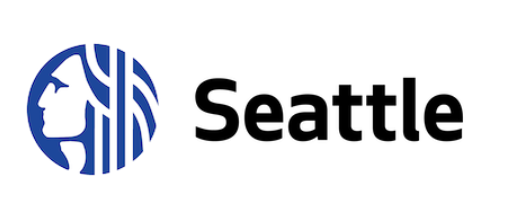

# P4 Anticipez les besoins en consommation de bâtiments

* Description du fichier csv
* Suppression des bâtiments detinés à l'habitation
* Variables qualitatives
    * 
* Variables quantitatives
* Analyse univariée
* analyse bivariée
    * energie
    * Co²

In [1]:
# Importation des librairies
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import descartes
from shapely.geometry import Point,polygon
import zipfile
import contextily as ctx
import missingno as msno
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.api

In [2]:
pd.set_option('display.max_columns', 46);
pd.set_option('display.max_rows', 100)


# Description du fichier csv

In [3]:
# Ouverture du fichier
data= pd.read_csv('2016_Building_Energy_Benchmarking.csv')

In [4]:
# Copie de mon dataset
df = data.copy()

In [5]:
# Aperçu du fichier
df.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


<AxesSubplot: >

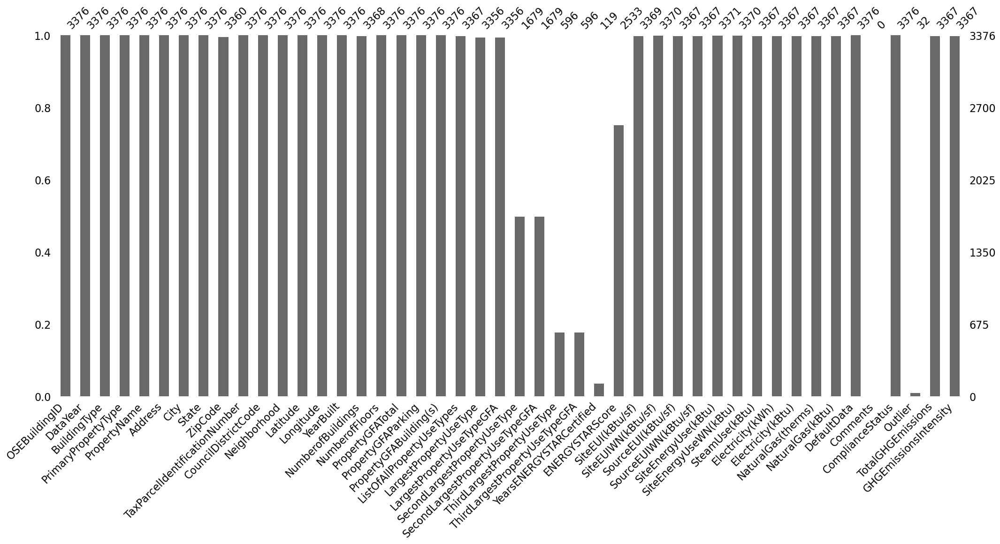

In [6]:
# Affichage des valeurs manquantes sur l'ensemble du df
msno.bar(df)

In [7]:
# Création d'une carte pour utiliser geopandas
carte = gpd.read_file('Street_Network_Database_(SND).shp')

In [8]:
# Taille du dataframe
df.shape

(3376, 46)

In [9]:
df.dtypes.value_counts()

float64    22
object     15
int64       8
bool        1
dtype: int64

In [1]:
labels = 'float64', 'object', 'int64','bool'
sizes = [22, 15, 8, 1]
#explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes,  labels=labels, autopct='%1.1f%',
        startangle=90)
plt.title('Types de variables')

plt.show()


NameError: name 'plt' is not defined

In [11]:
df.describe(include='all')

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.000000,3376.0,3376,3376,3376,3376,3376,3376,3360.000000,3376,3376.000000,3376,3376.000000,3376.000000,3376.000000,3368.000000,3376.000000,3.376000e+03,3376.000000,3.376000e+03,3367,3356,3.356000e+03,1679,1679.000000,596,596.000000,119,2533.000000,3369.000000,3370.000000,3367.000000,3367.000000,3.371000e+03,3.370000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3376,0.0,3376,32,3367.000000,3367.000000
unique,NaN,NaN,8,24,3362,3354,1,1,NaN,3268,NaN,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,466,56,NaN,50,NaN,44,NaN,65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,4,2,NaN,NaN
top,NaN,NaN,NonResidential,Low-Rise Multifamily,Northgate Plaza,2600 SW Barton St,Seattle,WA,NaN,1625049001,NaN,DOWNTOWN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Multifamily Housing,Multifamily Housing,NaN,Parking,NaN,Retail Store,NaN,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,Compliant,Low outlier,NaN,NaN
freq,NaN,NaN,1460,987,3,4,3376,3376,NaN,8,NaN,573,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,866,1667,NaN,976,NaN,110,NaN,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3263,NaN,3211,23,NaN,NaN
mean,21208.991114,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,98116.949107,NaN,4.439277,NaN,47.624033,-122.334795,1968.573164,1.106888,4.709123,9.483354e+04,8001.526066,8.683201e+04,NaN,NaN,7.917764e+04,NaN,28444.075817,NaN,11738.675166,NaN,67.918674,54.732116,57.033798,134.232848,137.783932,5.403667e+06,5.276726e+06,2.745959e+05,1.086639e+06,3.707612e+06,1.368505e+04,1.368505e+06,NaN,NaN,NaN,NaN,119.723971,1.175916
std,12223.757015,0.0,NaN,NaN,NaN,NaN,NaN,NaN,18.615205,NaN,2.120625,NaN,0.047758,0.027203,33.088156,2.108402,5.494465,2.188376e+05,32326.723928,2.079398e+05,NaN,NaN,2.017034e+05,NaN,54392.917928,NaN,29331.199286,NaN,26.873271,56.273124,57.163330,139.287554,139.109807,2.161063e+07,1.593879e+07,3.912173e+06,4.352478e+06,1.485066e+07,6.709781e+04,6.709781e+06,NaN,NaN,NaN,NaN,538.832227,1.821452
min,1.000000,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,98006.000000,NaN,1.000000,NaN,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,NaN,NaN,5.656000e+03,NaN,0.000000,NaN,0.000000,NaN,1.000000,0.000000,0.000000,0.000000,-2.100000,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,-0.800000,-0.020000
25%,19990.750000,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,98105.000000,NaN,3.000000,NaN,47.599860,-122.350662,1948.000000,1.000000,2.000000,2.848700e+04,0.000000,2.775600e+04,NaN,NaN,2.509475e+04,NaN,5000.000000,NaN,2239.000000,NaN,53.000000,27.900000,29.400000,74.699997,78.400002,9.251286e+05,9.701822e+05,0.000000e+00,1.874229e+05,6.394870e+05,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,9.495000,0.210000
50%,23112.000000,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,98115.000000,NaN,4.000000,NaN,47.618675,-122.332495,1975.000000,1.000000,4.000000,4.417500e+04,0.000000,4.321600e+04,NaN,NaN,3.989400e+04,NaN,10664.000000,NaN,5043.000000,NaN,75.000000,38.599998,40.900002,96.199997,101.099998,1.803753e+06,1.904452e+06,0.000000e+00,3.451299e+05,1.177583e+06,3.237538e+03,3.237540e+05,NaN,NaN,NaN,NaN,33.920000,0.610000
75%,25994.250000,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,98122.000000,NaN,7.000000,NaN,47.657115

     
Description des variables :  
* **OSEBuildingID** : est un identifiant unique attribué à chaque bâtiment.
* **'DataYear'** : Année de l'enregistrement des données
* **'BuildingType'**: Classification des types de bâtiments
* **'PrimaryPropertyType'**: Utilisation principale du bâtiment (bureaux,magasins...)
* **'PropertyName'** : Nom de la propriété ("Hotel Max","Paramount Hotel"
* **'Address'** : addresse
* **'City'** : Ville
* **'State'** : Etat
* **'ZipCode'** : Code postal
* **'TaxParcelIdentificationNumber'** : Numéro d'identification de la parcelle fiscale 
* **'CouncilDistrictCode'**: Code de district
* **'Neighborhood'** : Quartier
* **'Latitude'** : Latitude
* **'Longitude'**: Longitude
* **'YearBuilt'** : Année de construction
* **'NumberofBuildings'** : Nombre de bâtiments
* **'NumberofFloors'**: Nombre d'étages
* **'PropertyGFATotal'** : surface brute du plancher du bâtiment et du stationnement
* **'PropertyGFAParking'**: Espace total en pieds carrés de tous les types de stationnement (entièrement fermé, partiellement                               fermé et ouvert)
* **'PropertyGFABuilding(s)'** : Espace au sol total en pieds carrés entre les surfaces extérieures des murs d'enceinte d'un                                    bâtiment. Cela comprend toutes les zones à l'intérieur du ou des bâtiments, telles que                                          l'espace des locataires, les espaces communs, les cages d'escalier, les sous-sols, le                                          stockage, etc.
* **'ListOfAllPropertyUseTypes'**: Indique l'ensemble de services sur la propriété (piscine, hôtel, restaurant,parking..)
* **'LargestPropertyUseType'** : Utilisation principale 
* **'LargestPropertyUseTypeGFA'** : Surface brute du plancher (GFA) de l'activité principale
* **'SecondLargestPropertyUseType'**: Deuxième activité principale (exemple : Parking dans un hôtel)
* **'SecondLargestPropertyUseTypeGFA'** : Surface brute du plancher (GFA) de la deuxième activité
* **'ThirdLargestPropertyUseType'**: Troisième activité principale 
* **'ThirdLargestPropertyUseTypeGFA'** : Surface brute du plancher (GFA) de la troisième activité
* **'YearsENERGYSTARCertified'** : Année d'obtention de la certification EnergyStar
* **'ENERGYSTARScore'** : Score EnergyStar
* **'SiteEUI(kBtu/sf)'**: L'intensité de consommation d'énergie du site (IUE) est la consommation d'énergie du site d'une                                 propriété divisée par sa surface de plancher brute. La consommation d'énergie du site est le montant                           annuel de toute l'énergie consommée par la propriété sur le site, tel qu'indiqué sur les factures de                           services publics. L'IE du site est mesurée en milliers d'unités thermiques britanniques (kBtu) par                             pied carré.
* **'SiteEUIWN(kBtu/sf)'**: L'intensité de consommation d'énergie du site (EUI) normalisée par les conditions météorologiques                               (WN) est l'énergie du site WN d'une propriété divisée par sa surface de plancher brute (en pieds                               carrés). L'énergie du site WN est la consommation d'énergie du site que la propriété aurait                                     consommée dans des conditions météorologiques moyennes sur 30 ans. L'IUE du site WN est mesurée en                             milliers d'unités thermiques britanniques (kBtu) par pied carré.
* **'SourceEUI(kBtu/sf)'**:L'intensité de consommation d'énergie à la source (IUE) est la consommation d'énergie à la source                              d'une propriété divisée par sa surface de plancher brute. La consommation d'énergie à la source est                            l'énergie annuelle utilisée pour faire fonctionner la propriété, y compris les pertes de production,                            de transmission et de distribution. Source EUI est mesurée en milliers d'unités thermiques                                      britanniques (kBtu) par pied carré.
* **'SourceEUIWN(kBtu/sf)'**: L'intensité d'utilisation de l'énergie à la source (EUI) normalisée par les conditions                                         météorologiques (WN) est l'énergie à la source WN d'une propriété divisée par sa surface de                                     plancher brute. L'énergie à la source WN est l'utilisation de l'énergie à la source que la                                     propriété aurait consommée dans des conditions météorologiques moyennes sur 30 ans. WN Source EUI                               est mesuré en milliers d'unités thermiques britanniques (kBtu) par pied carré.
* **'SiteEnergyUse(kBtu)'**: La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources                                        d'énergie.
* **'SiteEnergyUseWN(kBtu)'** : La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources                                       d'énergie, ajustée à ce que la propriété aurait consommé dans des conditions météorologiques                                   moyennes sur 30 ans.
* **'SteamUse(kBtu)'** : La quantité annuelle de vapeur de quartier consommée par la propriété sur place, mesurée en milliers                            d'unités thermiques britanniques (kBtu).
* **'Electricity(kWh)'** : La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité                                achetée sur le réseau et générée par des systèmes renouvelables sur place, mesurée en kWh.
* **'Electricity(kBtu)'**: La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité                                achetée sur le réseau et générée par des systèmes renouvelables sur place, mesurée en milliers                                  d'unités thermiques britanniques (kBtu).
* **'NaturalGas(therms)'**: La quantité annuelle de gaz naturel fourni par les services publics consommée par la propriété,                                 mesurée en thermes.
* **'NaturalGas(kBtu)'**: La quantité annuelle de gaz naturel fourni par les services publics consommée par la propriété,                                 mesurée en milliers d'unités thermiques britanniques (kBtu)
* **'DefaultData'**: La propriété a utilisé des données par défaut pour au moins une caractéristique de la propriété.
* **'Comments'**: Commentaires du propriétaire ou de l'agent d'un immeuble pour mettre en contexte la consommation d'énergie de                   l'immeuble.
* **'ComplianceStatus'**: Etat de conformité
* **'Outlier'**: Si une propriété est une valeur aberrante élevée ou basse (O/N)
* **'TotalGHGEmissions'**: La quantité totale d'émissions de gaz à effet de serre, y compris le dioxyde de carbone, le méthane                            et les gaz d'oxyde nitreux libérés dans l'atmosphère à la suite de la consommation d'énergie de la                              propriété, mesurée en tonnes métriques d'équivalent dioxyde de carbone. 
* **'GHGEmissionsIntensity'**: Émissions totales de gaz à effet de serre divisées par la surface de plancher brute de la                                      propriété, mesurée en kilogrammes d'équivalent en dioxyde de carbone par pied carré.


                        

**OBJECTIF** : Prédire les **émissions de C0²** et la consommation **totale d'énergie** des bâtiments non destinés à l'habitation **qui n'ont pas encore été mesurées**.  

**Première hypothèse:**
D'après la description de mes variables, mes targets pourraient être :
* **'SiteEnergyUse(kBtu)'**: La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources                                        d'énergie.
* **'TotalGHGEmissions'**: La quantité totale d'émissions de gaz à effet de serre, y compris le dioxyde de carbone, le méthane                            et les gaz d'oxyde nitreux libérés dans l'atmosphère à la suite de la consommation d'énergie de la                              propriété, mesurée en tonnes métriques d'équivalent dioxyde de carbone.   



 

# Suppression des bâtiments detinés à l'habitation

Nos prédictions concernent que les bâtiments non destinés à l'habitation.

In [12]:
# Affichage des valeurs uniques contenues dans la colonne
df['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [13]:
# Sélection des bâtiments 'Multifamily'
df.loc[(df['BuildingType'].str.contains('Multifamily')==False),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimmin

In [14]:
df['BuildingType'].value_counts()

NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: BuildingType, dtype: int64

In [15]:
df= df.sort_values('BuildingType')

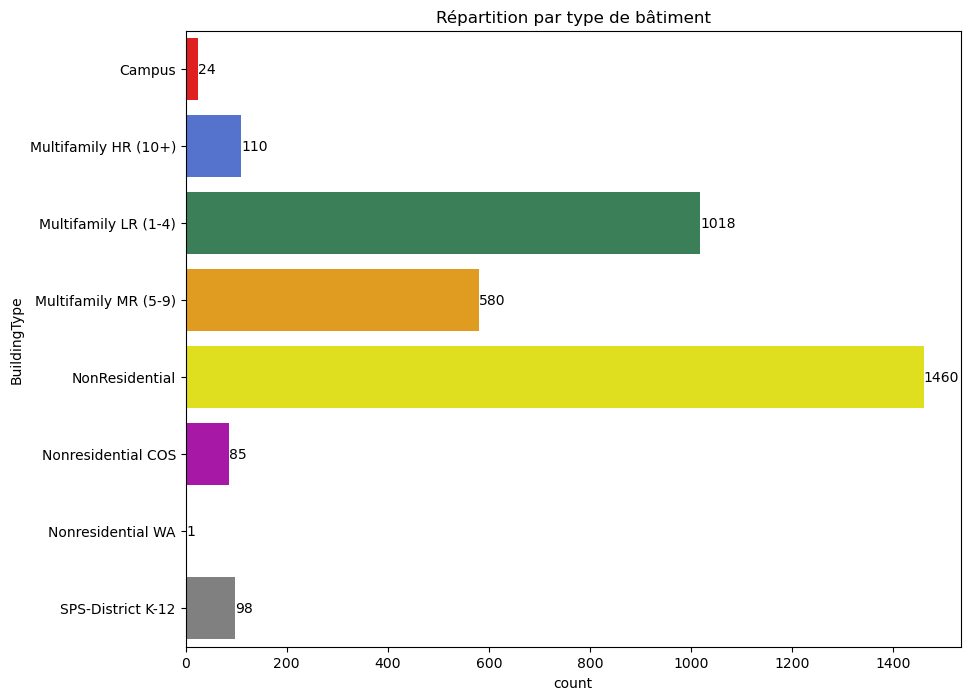

In [16]:
plt.figure(figsize=(10,8))
color = ['red','royalblue','seagreen','orange','yellow','m','purple','grey']
ax1 = sns.countplot(y='BuildingType', data=df,palette=color)
ax1.bar_label(ax1.containers[0])
plt.title('Répartition par type de bâtiment')
plt.show()

In [17]:
# Suppression des bâtiments destinés à l'habitation
df = df.drop(df.loc[(df['BuildingType'].str.contains('Multifamily'))].index)

In [18]:
df.shape

(1668, 46)

La moitié des bâtiments ont été retirés du fichier.

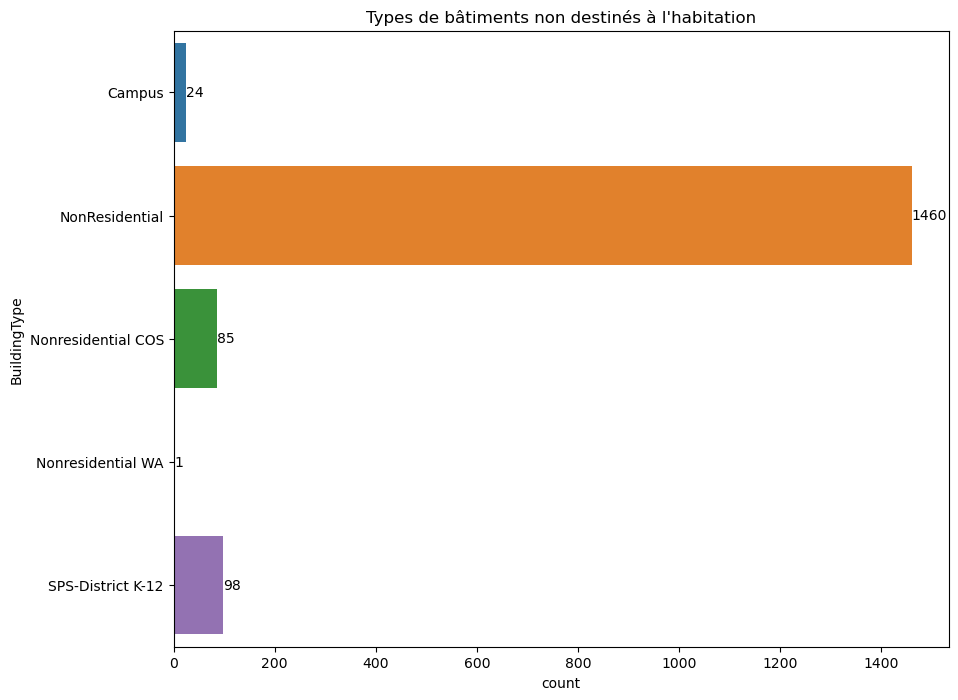

In [19]:
plt.figure(figsize=(10,8))
color = ['red','yellow','m','purple','grey']
ax1 = sns.countplot(y='BuildingType', data=df)
ax1.bar_label(ax1.containers[0])
plt.title('Types de bâtiments non destinés à l\'habitation')
plt.show()

<AxesSubplot: >

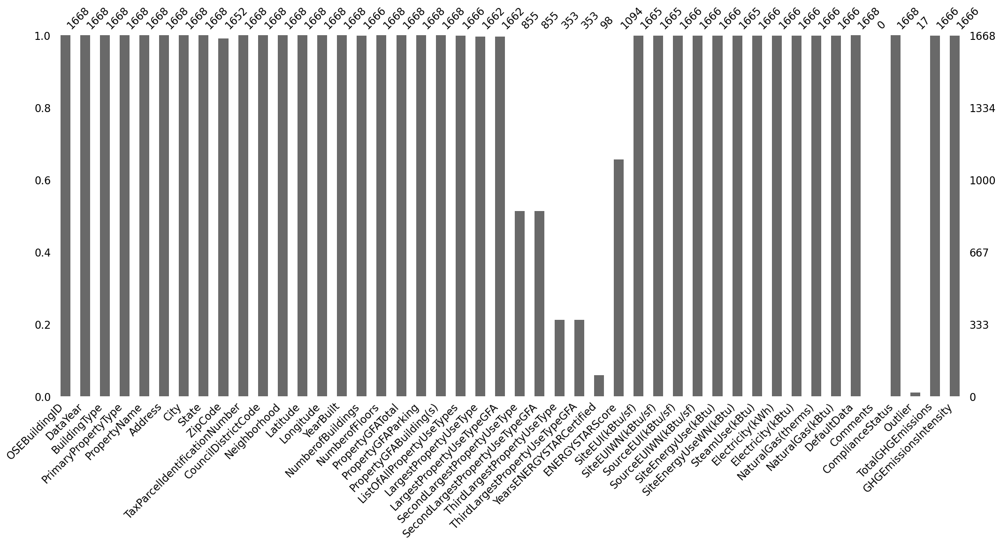

In [20]:
msno.bar(df)

<AxesSubplot: >

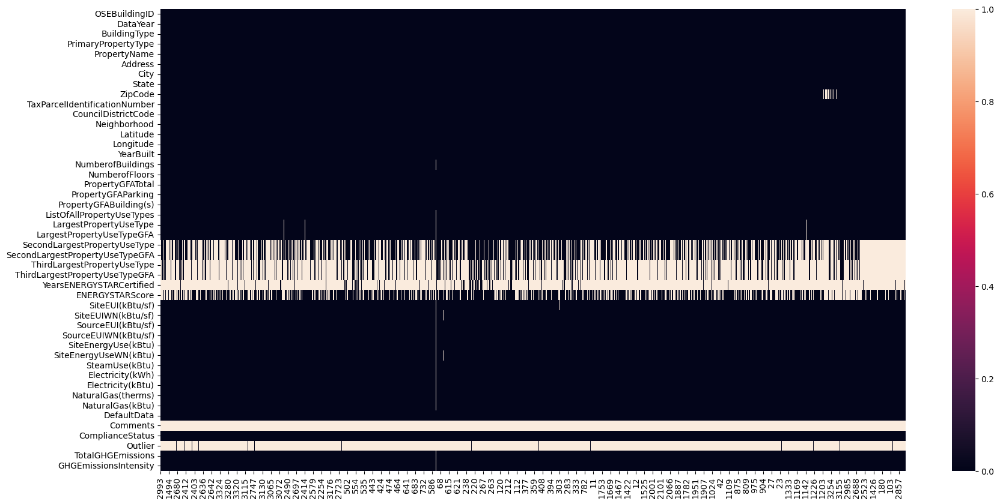

In [21]:
# J'affiche mon dataset sous forme de heatmap pour voir l'ensemble de mes valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(df.isna().T)

D'après cette heatmap, notre jeu de données comprend quelques colonnes pour lesquelles il manque beaucoup de données.  
Il s'agit principalement des colonnes qui traitent sur les activités secondaires et tertiaires.  

Cela pourrait s'expliquer par le fait que beaucoup de bâtiments doivent avoir qu'une activité principale.  

On peut aussi remarquer que les colonnes 'année de certification EnergyStar' et 'Score EnergyStar' contiennent peu d'élements.

Même remarque pour les colonnes Commentaires et Outliers.

In [22]:
# Calcul du pourcentage de valeurs manquantes
(df.isna().sum()/df.shape[0]).sort_values(ascending=False)

Comments                           1.000000
Outlier                            0.989808
YearsENERGYSTARCertified           0.941247
ThirdLargestPropertyUseType        0.788369
ThirdLargestPropertyUseTypeGFA     0.788369
SecondLargestPropertyUseType       0.487410
SecondLargestPropertyUseTypeGFA    0.487410
ENERGYSTARScore                    0.344125
ZipCode                            0.009592
LargestPropertyUseType             0.003597
LargestPropertyUseTypeGFA          0.003597
SiteEUIWN(kBtu/sf)                 0.001799
SiteEUI(kBtu/sf)                   0.001799
SiteEnergyUseWN(kBtu)              0.001799
SteamUse(kBtu)                     0.001199
SiteEnergyUse(kBtu)                0.001199
SourceEUIWN(kBtu/sf)               0.001199
SourceEUI(kBtu/sf)                 0.001199
Electricity(kWh)                   0.001199
Electricity(kBtu)                  0.001199
NaturalGas(therms)                 0.001199
NaturalGas(kBtu)                   0.001199
TotalGHGEmissions               

Cette liste nous permet de repérer des groupes de colonnes qui contiennent le même pourcentage de valeurs manquantes.  


# Variables qualitatives

In [23]:
# Création d'une boucle qui va afficher le nom de la colonne, le nombre de valeurs manquantes
# les valeurs uniques ainsi que leur nombre
for col in df.select_dtypes('object'):
    print("_____",col) 
    print("nbr_nan:",df[col].isna().sum())
    print(df[col].nunique(),"valeurs uniques")
    print(df[col].unique())
    print("_ _ _ _ _ _ _ _ _ _") 
    print("_ _ _ _ _ _ _ _ _ _") 

_____ BuildingType
nbr_nan: 0
5 valeurs uniques
['Campus' 'NonResidential' 'Nonresidential COS' 'Nonresidential WA'
 'SPS-District K-12']
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ PrimaryPropertyType
nbr_nan: 0
22 valeurs uniques
['K-12 School' 'Other' 'Mixed Use Property' 'Low-Rise Multifamily'
 'Restaurant' 'University' 'Large Office' 'Warehouse'
 'Small- and Mid-Sized Office' 'Refrigerated Warehouse'
 'Self-Storage Facility' 'Hospital' 'Senior Care Community'
 'Supermarket / Grocery Store' 'Worship Facility' 'Hotel' 'Retail Store'
 'Residence Hall' 'Medical Office' 'Distribution Center' 'Laboratory'
 'Office']
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ PropertyName
nbr_nan: 0
1664 valeurs uniques
['The Bush School - Lower / Middle School'
 'Joint Training Facilities Campus'
 '(ID#24086)Campus1:KC Metro Transit Atlantic Central Bases' ...
 'B.F. Day Elementary' 'Viewlands Elementary' 'Green Lake Elementary']
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ Address
nbr_nan: 0
1647

- La colonne YearsENERGYSTARCertified comprend plusieurs années collées les unes aux autres.  

# Colonne Comments

In [24]:
# Je commence par retirer la colonne 'Comments' qui est vide
df = df.drop(columns='Comments')

# Compliant Status

In [25]:
df['ComplianceStatus'].value_counts()

Compliant                       1548
Error - Correct Default Data      88
Non-Compliant                     18
Missing Data                      14
Name: ComplianceStatus, dtype: int64

In [26]:
df.loc[(df['ComplianceStatus']=='Compliant')==False]['ComplianceStatus'].value_counts()
#df.loc[(df['ComplianceStatus'].str.contains('Compliant',case=False)==False)|(df['ComplianceStatus'].str.contains('Non-Compliant',case=False))]

Error - Correct Default Data    88
Non-Compliant                   18
Missing Data                    14
Name: ComplianceStatus, dtype: int64

In [27]:
# Cette colonne fait référence au niveau de conformité des données. 
# Afin de ne pas biaiser mes prédictions, je retire les lignes qui n'ont pas le status 'compliant'
df= df.drop(df.loc[(df['ComplianceStatus']=='Compliant')==False]['ComplianceStatus'].index)

# Colonne Neighborhood

In [28]:
df['Neighborhood'].unique()

array(['CENTRAL', 'DELRIDGE', 'GREATER DUWAMISH', 'DOWNTOWN',
       'LAKE UNION', 'MAGNOLIA / QUEEN ANNE', 'NORTHEAST', 'EAST',
       'NORTHWEST', 'SOUTHEAST', 'BALLARD', 'SOUTHWEST', 'NORTH', 'North',
       'Northwest', 'Central', 'Ballard', 'Delridge',
       'DELRIDGE NEIGHBORHOODS'], dtype=object)

Certains quartiers sont inscrits deux fois car l'un est écrit en majuscule et l'autre en minuscule.  
Il y a également Delrigde Neighborhoods qui n'est pas écrit de la même manière.

In [29]:
# Je mets en majuscule le noms des quartiers
df['Neighborhood'] = df['Neighborhood'].str.upper()

In [30]:
df['Neighborhood'].unique()

array(['CENTRAL', 'DELRIDGE', 'GREATER DUWAMISH', 'DOWNTOWN',
       'LAKE UNION', 'MAGNOLIA / QUEEN ANNE', 'NORTHEAST', 'EAST',
       'NORTHWEST', 'SOUTHEAST', 'BALLARD', 'SOUTHWEST', 'NORTH',
       'DELRIDGE NEIGHBORHOODS'], dtype=object)

In [31]:
df.loc[df['Neighborhood']=='DELRIDGE NEIGHBORHOODS','Neighborhood']='DELRIDGE'

In [32]:
df['Neighborhood'].value_counts()

DOWNTOWN                 351
GREATER DUWAMISH         328
MAGNOLIA / QUEEN ANNE    144
LAKE UNION               143
NORTHEAST                117
EAST                     116
NORTHWEST                 78
BALLARD                   63
NORTH                     59
CENTRAL                   46
DELRIDGE                  41
SOUTHEAST                 31
SOUTHWEST                 31
Name: Neighborhood, dtype: int64

Il n'y a plus de doublons.

# Colonne '..PropertyUseType '

In [33]:
df.loc[df['LargestPropertyUseType'].isna(),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2459,25711,2016,NonResidential,Restaurant,BUSH GARDEN - RESTURANT & LOUNGE,614 S MAYNARD AVE S,Seattle,WA,98104.0,5247802410,2,DOWNTOWN,47.59697,-122.32474,1913,1.0,3,28800,0,28800,Restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.200001,32.500000,62.000000,62.799999,8.999242e+05,9.358332e+05,0.0,118085.2969,402907.0,4970.169922,497017.0,False,Compliant,NaN,29.21,1.01
2414,25568,2016,NonResidential,Small- and Mid-Sized Office,Talon Northlake LLC,1341 N Northlake Way,Seattle,WA,98103.0,4088804565,4,LAKE UNION,47.64747,-122.34086,2008,1.0,4,48350,0,48350,Office,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.0,72.199997,74.699997,226.600006,234.600006,3.168131e+06,3.280956e+06,0.0,928526.0000,3168131.0,0.000000,0.0,False,Compliant,NaN,22.09,0.46
353,496,2016,NonResidential,Self-Storage Facility,Market St Center,2811 NW Market Street,Seattle,WA,98107.0,1175001235,6,BALLARD,47.66838,-122.39310,1946,2.0,2,111445,0,111445,"Fitness Center/Health Club/Gym, Office, Other ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.799999,51.000000,103.000000,106.400002,5.697472e+06,6.076957e+06,0.0,881452.0000,3007514.0,26899.582030,2689958.0,False,Compliant,NaN,163.83,1.47
1147,21103,2016,NonResidential,Hotel,Palladian Hotel,2000 Second Avenue,Seattle,WA,98121.0,1977201140,7,DOWNTOWN,47.61203,-122.34165,1910,1.0,8,61721,0,61721,Hotel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.0,52.200001,53.500000,150.399994,154.399994,2.897080e+06,2.968430e+06,0.0,742846.3750,2534592.0,3624.875244,362488.0,False,Compliant,NaN,36.92,0.60


In [34]:
# Les bâtiments qui ne contiennent pas de valeurs pour la colonne Largest n'ont pas d'activités secondaires et tertiaires
# J'impute la valeur par celle de la colonne ListofAllpropertyUseTypes
df.loc[df['LargestPropertyUseType'].isna(),'LargestPropertyUseType']= df['ListOfAllPropertyUseTypes']


In [35]:
# Imputation des valeurs manquantes par 'Sans'

df.loc[df['SecondLargestPropertyUseType'].isna(),'SecondLargestPropertyUseType']='Sans';
df.loc[df['ThirdLargestPropertyUseType'].isna(),'ThirdLargestPropertyUseType']='Sans';

In [37]:
# Je sélectionne les activités secondaires qui ne comporte pas la mention "sans",
# dont la surface est égale à 0 et dont la colonne ParkingGFA est égal à 0.
df.loc[(df['SecondLargestPropertyUseType']!='Sans')&(df['SecondLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']==0),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1993,24086,2016,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,1333 AIRPORT WAY S,Seattle,WA,98134.0,7666203387,2,GREATER DUWAMISH,47.59042,-122.32498,1991,10.0,0,230971,0,230971,"Other, Parking",Other,230970.0,Parking,0.0,Sans,NaN,NaN,NaN,91.000000,96.199997,235.100006,242.199997,2.102229e+07,2.223084e+07,0.000000e+00,4.519276e+06,15419770.0,56025.152340,5602515.0,False,Compliant,NaN,405.05,1.75
2270,25069,2016,Campus,K-12 School,O'Dea High School,802 Terry Ave.,Seattle,WA,98104.0,5392100055,3,EAST,47.60776,-122.32481,1923,1.0,4,46100,0,46100,"K-12 School, Parking",K-12 School,46100.0,Parking,0.0,Sans,NaN,NaN,75.0,47.200001,52.299999,101.199997,106.800003,2.177065e+06,2.412536e+06,5.482947e+05,3.216685e+05,1097533.0,5312.370117,531237.0,False,Compliant,NaN,78.19,1.70
3240,49872,2016,NonResidential,Other,Mercedes-Benz of Seattle,2015 AIRPORT WAY S,Seattle,WA,98134.0,7666203470,2,GREATER DUWAMISH,47.58430,-122.32229,2014,1.0,2,56988,0,56988,"Automobile Dealership, Parking",Automobile Dealership,24520.0,Parking,0.0,Sans,NaN,NaN,NaN,22.200001,22.200001,46.900002,46.900002,5.441724e+05,5.441724e+05,0.000000e+00,8.110560e+04,276732.0,2674.399902,267440.0,False,Compliant,NaN,16.13,0.28
3347,50081,2016,NonResidential,K-12 School,Hamlin Robinson School,1701 20th Ave South,Seattle,WA,98144.0,7548300840,3,GREATER DUWAMISH,47.58831,-122.30650,2015,1.0,3,45000,0,45000,"K-12 School, Parking",K-12 School,45728.0,Parking,0.0,Sans,NaN,NaN,77.0,29.000000,30.600000,91.099998,96.000000,1.325973e+06,1.397742e+06,0.000000e+00,3.886204e+05,1325973.0,0.000000,0.0,False,Compliant,NaN,9.24,0.21
2668,26529,2016,NonResidential,Supermarket / Grocery Store,Safeway 3091 - Brooklyn Ave,4732 Brooklyn Ave NE,Seattle,WA,98105.0,8816401015,4,NORTHEAST,47.66429,-122.31389,1950,1.0,1,26226,0,26226,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,25828.0,Parking,0.0,Sans,NaN,NaN,37.0,293.799988,301.899994,741.400024,745.400024,7.588060e+06,7.798480e+06,0.000000e+00,1.567840e+06,5349470.0,22385.900390,2238590.0,False,Compliant,NaN,156.18,5.96
2514,25914,2016,NonResidential,Supermarket / Grocery Store,Safeway 1551 - E John St,1410 E John St,Seattle,WA,98112.0,6003501820,3,EAST,47.62048,-122.31386,1998,1.0,1,44739,0,44739,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,44739.0,Parking,0.0,Sans,NaN,NaN,17.0,326.000000,335.399994,728.700012,738.599976,1.458581e+07,1.500688e+07,0.000000e+00,2.423890e+06,8270312.0,63155.000000,6315500.0,False,Compliant,NaN,393.07,8.79
3141,41928,2016,NonResidential,Supermarket / Grocery Store,Safeway 1586 - 15th Ave,12318 15th Ave NE,Seattle,WA,98115.0,6798100875,5,NORTH,47.71864,-122.31200,2011,1.0,1,51400,0,51400,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,51841.0,Parking,0.0,Sans,NaN,NaN,74.0,225.699997,233.000000,514.799988,522.400024,1.170296e+07,1.208143e+07,0.000000e+00,2.019100e+06,6889168.0,48137.898440,4813790.0,False,Compliant,NaN,303.69,5.91
3123,36587,2016,NonResidential,Other,Meredith Mathews East Madison YMCA,1700 23rd Ave,Seattle,WA,98122.0,9828200095,3,CENTRAL,47.61674,-122.30207,1991,1.0,1,45000,0,45000,"Fitness Center/Health Club/Gym, Swimming Pool",Fitness Center/Health Cl

Ces bâtiments n'ont pas de parking (PropertyGFAParking étant égal à 0).  
Je vais remplacer 'Parking' par 'Sans'.

In [38]:
df.loc[(df['SecondLargestPropertyUseType']!='Sans')&(df['SecondLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']==0),'SecondLargestPropertyUseType']= 'Sans'

In [39]:
df.loc[(df['SecondLargestPropertyUseType']!='Sans')&(df['SecondLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']!=0),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2896,27378,2016,NonResidential,Supermarket / Grocery Store,Safeway 1550 - Roosevelt Way,7300 Roosevelt Way NE,Seattle,WA,98115.0,6716700415,4,NORTHEAST,47.68217,-122.31675,1997,1.0,1,76585,38585,38000,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,41447.0,Parking,0.0,Sans,NaN,NaN,18.0,335.500000,346.700012,761.299988,773.099976,1.390608e+07,1.436823e+07,0.0,2.377500e+06,8112028.0,57940.503910,5794050.0,False,Compliant,NaN,364.27,4.76
542,732,2016,NonResidential,Supermarket / Grocery Store,70100122-Greenwood,100 NW 85th Street,Seattle,WA,98117.0,9231900160,6,NORTHWEST,47.69197,-122.35877,1970,1.0,1,141890,35545,106345,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,168735.0,Parking,0.0,Parking,0.0,NaN,91.0,100.000000,103.000000,266.600006,269.799988,1.686598e+07,1.738456e+07,0.0,3.825270e+06,13051820.0,38141.562500,3814156.0,False,Compliant,NaN,293.56,2.07
155,245,2016,NonResidential,Other,CenturyLink,800 Occidental Ave. South,Seattle,WA,98134.0,7666204876,2,GREATER DUWAMISH,47.59544,-122.33159,1999,1.0,6,1585960,327680,1258280,"Other - Entertainment/Public Assembly, Parking",Other - Entertainment/Public Assembly,1585960.0,Parking,0.0,Sans,NaN,NaN,NaN,37.700001,39.200001,104.699997,106.300003,5.975744e+07,6.216030e+07,0.0,1.449001e+07,49439914.0,103175.179700,10317518.0,False,Compliant,NaN,892.63,0.56
356,500,2016,NonResidential,Supermarket / Grocery Store,70100179-Lake City,13000 Lake City Way NE,Seattle,WA,98125.0,1453601660,5,NORTH,47.72370,-122.29232,1995,1.0,2,308965,187878,121087,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,121087.0,Parking,0.0,Parking,0.0,NaN,78.0,119.900002,122.599998,310.200012,310.899994,1.451279e+07,1.484338e+07,0.0,3.130371e+06,10680826.0,38319.585940,3831959.0,False,Compliant,NaN,277.98,0.90
401,557,2016,NonResidential,Supermarket / Grocery Store,Safeway 1845 - Greenwood Ave,8704 Greenwood Ave N,Seattle,WA,98103.0,6431500015,5,NORTHWEST,47.69267,-122.35506,2003,1.0,1,58184,7450,50734,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,51722.0,Parking,0.0,Sans,NaN,NaN,41.0,284.500000,291.500000,620.200012,627.599976,1.471526e+07,1.507676e+07,0.0,2.331900e+06,7956442.0,67588.195310,6758820.0,False,Compliant,NaN,414.43,7.12
319,456,2016,NonResidential,Large Office,1100 Dexter-RREEF SeaDPD ID 456,1100 Dexter Avenue North,Seattle,WA,98109.0,2249500490,7,MAGNOLIA / QUEEN ANNE,47.62929,-122.34194,1996,2.0,5,213283,115228,98055,"Office, Parking",Office,105563.0,Parking,0.0,Sans,NaN,20112009,83.0,53.599998,53.599998,168.399994,168.399994,5.661690e+06,5.661690e+06,0.0,1.659346e+06,5661689.0,0.000000,0.0,False,Compliant,NaN,39.47,0.19
1522,22240,2016,NonResidential,Supermarket / Grocery Store,Safeway 1477 - Market St,1423 NW Market St,Seattle,WA,98107.0,2768300240,6,BALLARD,47.66828,-122.37428,2000,1.0,1,89103,43035,46068,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,47034.0,Parking,0.0,Sans,NaN,NaN,34.0,298.299988,307.700012,660.200012,665.599976,1.402948e+07,1.447324e+07,0.0,2.288400e+06,7808020.0,62214.593750,6221459.0,False,Compliant,NaN,384.85,4.32
1109,20885,2016,NonResidential,Senior Care Community,Ballard Center,820 NW 95th Street,Seattle,WA,9

Ces bâtiments possèdent un parking mais la superficie n'a pas été enregistrée dans la colonne SecondLargestPropertyUseTypeGFA.
Je remplace ces valeurs par celle de la colonne PropertyGFAParking.

In [40]:
df.loc[(df['SecondLargestPropertyUseType']!='Sans')&(df['SecondLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']!=0),'SecondLargestPropertyUseTypeGFA']=df['PropertyGFAParking']

In [41]:
# Même procédé pour la colonne ThirdLargestPropertyUseType
df.loc[(df['ThirdLargestPropertyUseType']!='Sans')&(df['ThirdLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']==0),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2919,27504,2016,NonResidential,Warehouse,WHECO,7417 4TH AVE S,Seattle,WA,98108.0,7327906465,1,GREATER DUWAMISH,47.53651,-122.32954,1964,1.0,2,23400,0,23400,"Non-Refrigerated Warehouse, Office, Parking",Non-Refrigerated Warehouse,20002.0,Office,3374.0,Parking,0.0,NaN,NaN,18.799999,19.500000,59.000000,61.099998,4.392669e+05,4.548965e+05,0.0,1.287418e+05,4.392670e+05,0.000000,0.000,False,Compliant,NaN,3.06,0.13
3045,27982,2016,NonResidential,Small- and Mid-Sized Office,9620 Stone Ave N,9620 Stone Ave N,Seattle,WA,98103.0,4310701210,5,NORTHWEST,47.69898,-122.34162,1982,1.0,3,25111,0,25111,"Non-Refrigerated Warehouse, Office, Parking",Office,14256.0,Non-Refrigerated Warehouse,7850.0,Parking,0.0,NaN,77.0,43.200001,48.000000,98.000000,103.000000,9.543527e+05,1.060041e+06,0.0,1.633290e+05,5.572790e+05,3970.739990,397074.000,False,Compliant,NaN,24.97,0.99
2804,27016,2016,NonResidential,Small- and Mid-Sized Office,"Pacific Georgetown Center, LLC",6363 7th Ave S.,Seattle,WA,98108.0,5367201500,2,GREATER DUWAMISH,47.54494,-122.32543,1969,1.0,1,35017,0,35017,"Non-Refrigerated Warehouse, Office, Parking",Office,19785.0,Non-Refrigerated Warehouse,10234.0,Parking,0.0,NaN,66.0,43.200001,46.400002,108.300003,111.800003,1.295485e+06,1.394294e+06,0.0,2.651322e+05,9.046310e+05,3908.540527,390854.000,False,Compliant,NaN,27.06,0.77
548,741,2016,NonResidential,Large Office,1000 Dexter-RREEF SeaDPD ID 741,1000 Dexter Avenue North,Seattle,WA,98109.0,2249500235,7,MAGNOLIA / QUEEN ANNE,47.62817,-122.34212,1998,1.0,5,110524,0,110524,"Office, Other, Parking",Office,98781.0,Other,8634.0,Parking,0.0,20112009,57.0,63.900002,63.900002,200.500000,200.500000,6.859198e+06,6.859198e+06,0.0,2.010316e+06,6.859197e+06,0.000000,0.000,False,Compliant,NaN,47.82,0.43
400,556,2016,NonResidential,Refrigerated Warehouse,Charlies Produce,4103 2nd Ave South,Seattle,WA,98134.0,6172900230,2,GREATER DUWAMISH,47.56637,-122.33273,1953,1.0,1,104099,0,104099,"Office, Parking, Refrigerated Warehouse",Refrigerated Warehouse,100000.0,Office,4099.0,Parking,0.0,NaN,NaN,170.000000,167.399994,525.500000,515.200012,1.769542e+07,1.742716e+07,0.0,5.065566e+06,1.728371e+07,4117.050293,411705.000,False,Compliant,NaN,142.36,1.37
331,467,2016,NonResidential,Retail Store,70100608-Ballard,915 NW 45th Street,Seattle,WA,98107.0,1982202070,6,BALLARD,47.66057,-122.36857,1999,1.0,1,164437,0,164437,"Parking, Retail Store, Supermarket/Grocery Store",Retail Store,102653.0,Supermarket/Grocery Store,74102.0,Parking,0.0,NaN,62.0,104.000000,107.699997,276.000000,278.000000,1.839034e+07,1.903157e+07,0.0,4.132327e+06,1.409950e+07,42908.433590,4290843.000,False,Compliant,NaN,326.18,1.98
1658,23020,2016,NonResidential,Self-Storage Facility,Northgate Self Storage,10805 Roosevelt Way NE,Seattle,WA,98125.0,2926049287,5,NORTH,47.70782,-122.31873,1977,2.0,2,33344,0,33344,"Office, Parking, Self-Storage Facility",Self-Storage Facility,31360.0,Office,984.0,Parking,0.0,NaN,NaN,3.800000,4.000000,12.000000,12.600000,1.237672e+05,1.294669e+05,0.0,3.627410e+04,1.237670e+05,0.000000,0.000,False,Compliant,NaN,0.86,0.03
16,22,2016,NonResidential,Other,Downtown Seattle YMCA,909 4th Avenue,Seattle,WA,98104.0,0942000350,7,DOWNTOWN,47.60546,-122.33279,

In [42]:
df.loc[(df['ThirdLargestPropertyUseType']!='Sans')&(df['ThirdLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']==0),'ThirdLargestPropertyUseType']= 'Sans'

In [43]:
df.loc[(df['ThirdLargestPropertyUseType']!='Sans')&(df['ThirdLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']!=0),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
3337,50062,2016,NonResidential,Hotel,Olympic Hospitality,3926 Aurora Ave N,Seattle,WA,98103.0,1931300480,4,LAKE UNION,47.65476,-122.34732,2014,1.0,4,126823,41539,85284,"Hotel, Parking, Swimming Pool",Hotel,88157.0,Parking,41539.0,Swimming Pool,0.0,NaN,72.0,68.500000,68.500000,169.500000,169.500000,6042399.5,6042399.5,0.0,1.206219e+06,4115620.0,19267.79102,1926779.0,False,Compliant,NaN,131.02,1.03
3221,49802,2016,NonResidential,Hotel,Hotel Ballard,5216 Ballard Ave NW,Seattle,WA,98107.0,2767702985,6,BALLARD,47.66629,-122.38260,2013,1.0,4,62381,22948,39433,"Hotel, Parking, Swimming Pool",Hotel,60245.0,Parking,26067.0,Swimming Pool,0.0,NaN,62.0,58.000000,58.000000,182.300003,182.300003,3497215.5,3497215.5,0.0,1.024975e+06,3497215.0,0.00000,0.0,False,Compliant,NaN,24.38,0.39
501,682,2016,NonResidential,Other,West Seattle Fitness,2629 SW Andover Street,Seattle,WA,98121.0,9358000300,1,DELRIDGE,47.56797,-122.36711,2001,1.0,3,68763,11527,57236,"Other - Recreation, Parking, Swimming Pool",Other - Recreation,50000.0,Parking,11527.0,Swimming Pool,0.0,NaN,NaN,180.600006,191.899994,343.100006,355.000000,9029489.0,9596839.0,0.0,1.075839e+06,3670762.0,53587.26172,5358726.0,False,Compliant,NaN,310.19,4.51
542,732,2016,NonResidential,Supermarket / Grocery Store,70100122-Greenwood,100 NW 85th Street,Seattle,WA,98117.0,9231900160,6,NORTHWEST,47.69197,-122.35877,1970,1.0,1,141890,35545,106345,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,168735.0,Parking,35545.0,Parking,0.0,NaN,91.0,100.000000,103.000000,266.600006,269.799988,16865978.0,17384564.0,0.0,3.825270e+06,13051820.0,38141.56250,3814156.0,False,Compliant,NaN,293.56,2.07
144,232,2016,NonResidential,Hotel,Silver Cloud Inn,1150 Fairview Ave N,Seattle,WA,98109.0,4088802955,3,LAKE UNION,47.62972,-122.32906,1998,1.0,5,123920,30000,93920,"Hotel, Parking, Swimming Pool",Hotel,123920.0,Parking,30000.0,Swimming Pool,0.0,NaN,79.0,75.599998,78.099998,148.199997,152.199997,9373179.0,9676783.0,0.0,1.195550e+06,4079217.0,52939.60938,5293961.0,False,Compliant,NaN,309.60,2.50
356,500,2016,NonResidential,Supermarket / Grocery Store,70100179-Lake City,13000 Lake City Way NE,Seattle,WA,98125.0,1453601660,5,NORTH,47.72370,-122.29232,1995,1.0,2,308965,187878,121087,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,121087.0,Parking,187878.0,Parking,0.0,NaN,78.0,119.900002,122.599998,310.200012,310.899994,14512786.0,14843382.0,0.0,3.130371e+06,10680826.0,38319.58594,3831959.0,False,Compliant,NaN,277.98,0.90
403,561,2016,NonResidential,Large Office,Alley24,221 Yale Avenue North,Seattle,WA,98109.0,6849700145,7,LAKE UNION,47.62029,-122.33078,2005,1.0,6,336700,124800,211900,"Office, Parking, Retail Store",Office,217977.0,Parking,4569.0,Retail Store,0.0,NaN,95.0,41.599998,42.200001,113.500000,113.500000,9058916.0,9200102.0,0.0,2.308732e+06,7877393.0,0.00000,0.0,False,Compliant,NaN,54.92,0.16
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0

In [44]:
df.loc[(df['ThirdLargestPropertyUseType']!='Sans')&(df['ThirdLargestPropertyUseTypeGFA']==0)&(df['PropertyGFAParking']!=0),'ThirdLargestPropertyUseTypeGFA']=df['PropertyGFAParking']

In [45]:
df.loc[(df['SecondLargestPropertyUseType']=='Parking')&(df['PropertyGFAParking']==0),'PropertyGFAParking']=df['SecondLargestPropertyUseTypeGFA']

In [46]:
df.loc[(df['SecondLargestPropertyUseType']=='Parking')&(df['PropertyGFAParking']==0),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity


In [47]:
df['PropertyGFATotal'] = df['PropertyGFAParking'] + df['PropertyGFABuilding(s)']

In [179]:
df.filter(regex='GFA').isna().mean()

PropertyGFATotal                   0.0
PropertyGFAParking                 0.0
PropertyGFABuilding(s)             0.0
LargestPropertyUseTypeGFA          0.0
SecondLargestPropertyUseTypeGFA    0.0
ThirdLargestPropertyUseTypeGFA     0.0
dtype: float64

In [180]:
df.filter(regex='Property').isna().mean()

PrimaryPropertyType                0.0
PropertyName                       0.0
PropertyGFATotal                   0.0
PropertyGFAParking                 0.0
PropertyGFABuilding(s)             0.0
ListOfAllPropertyUseTypes          0.0
LargestPropertyUseType             0.0
LargestPropertyUseTypeGFA          0.0
SecondLargestPropertyUseType       0.0
SecondLargestPropertyUseTypeGFA    0.0
ThirdLargestPropertyUseType        0.0
ThirdLargestPropertyUseTypeGFA     0.0
dtype: float64

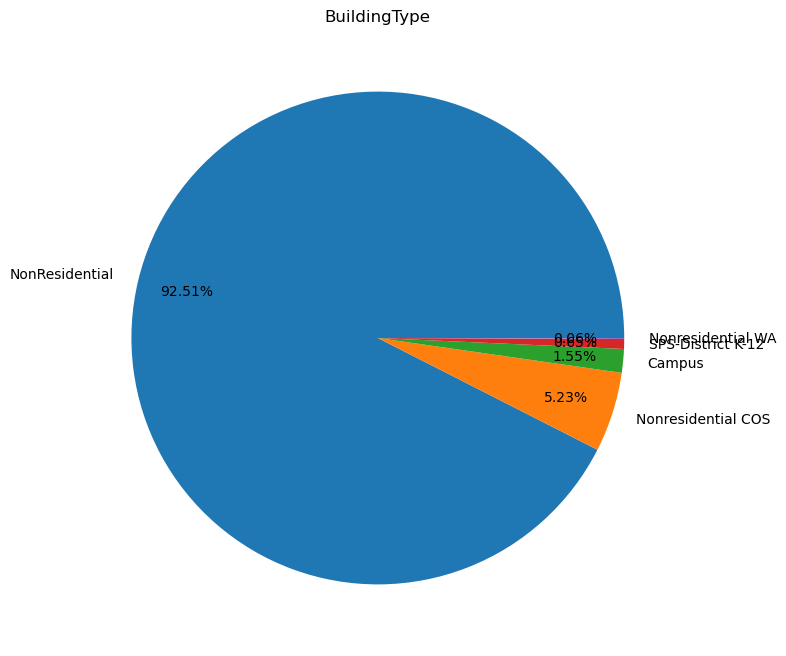

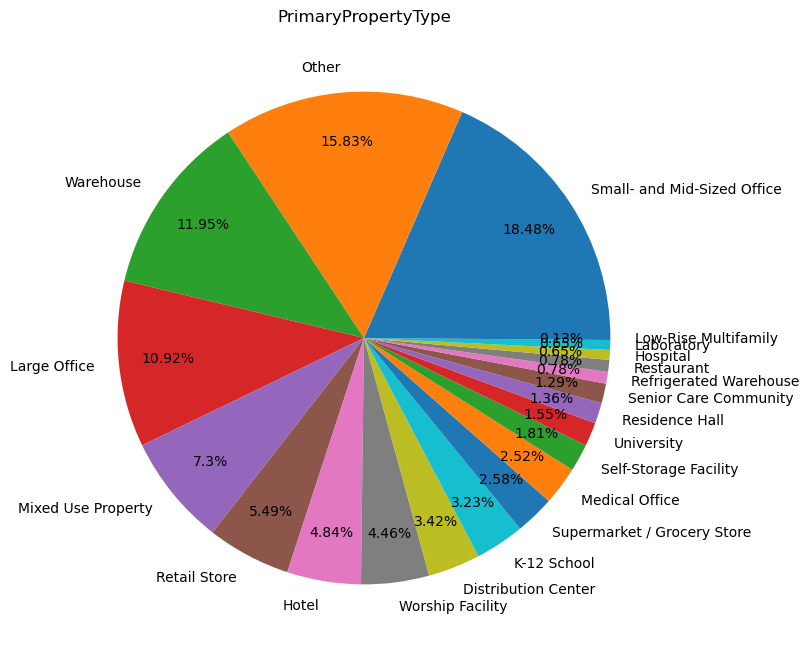

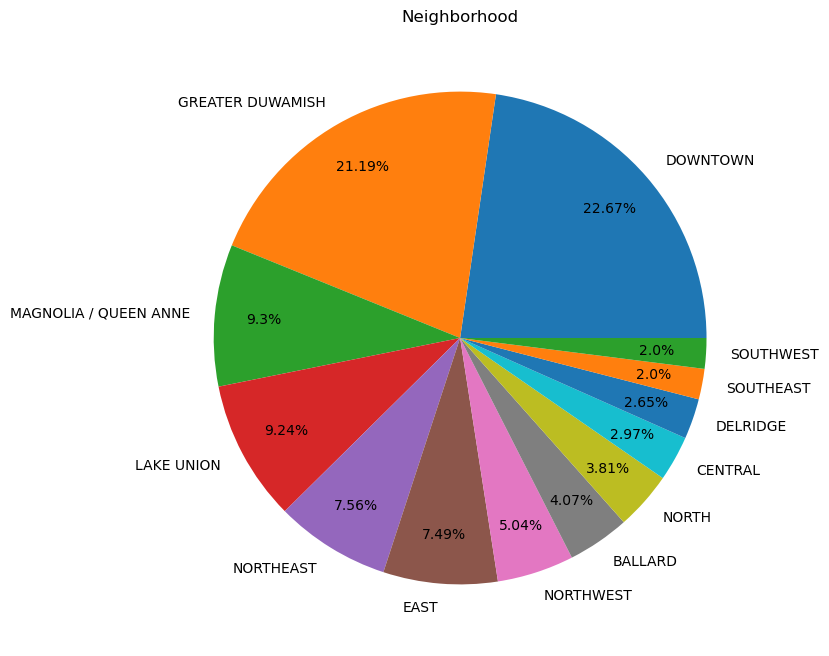

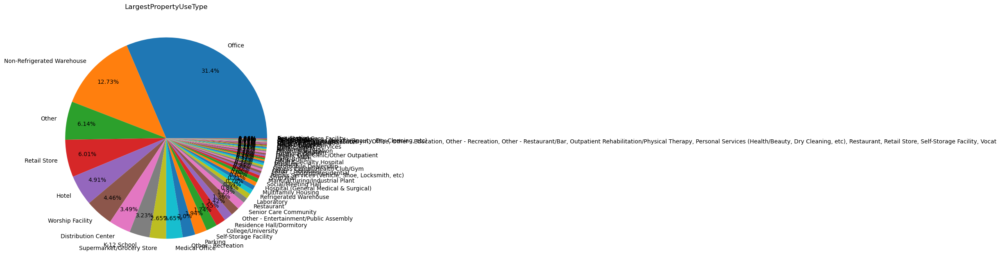

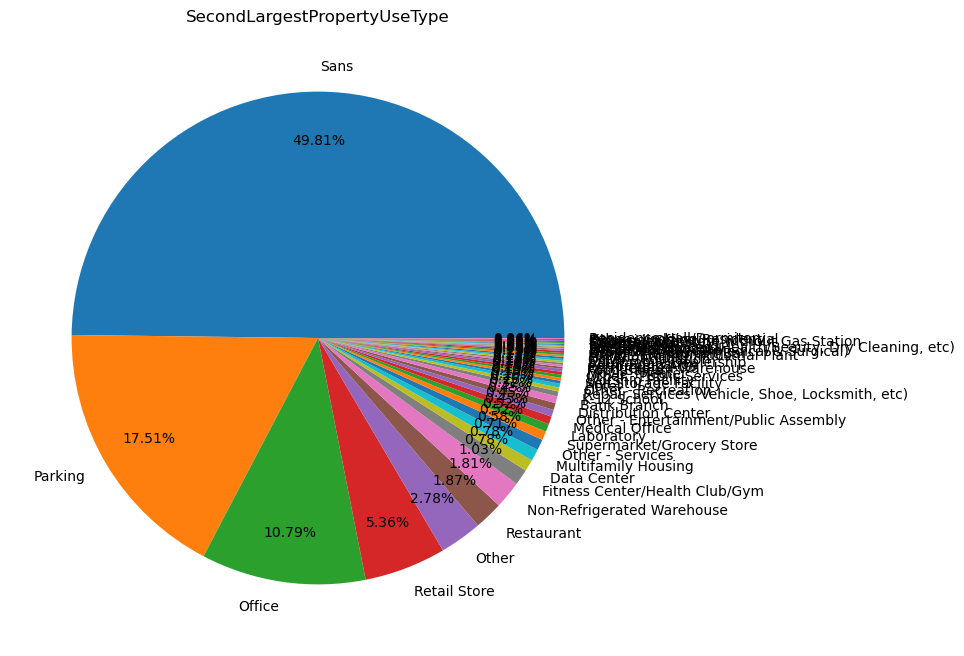

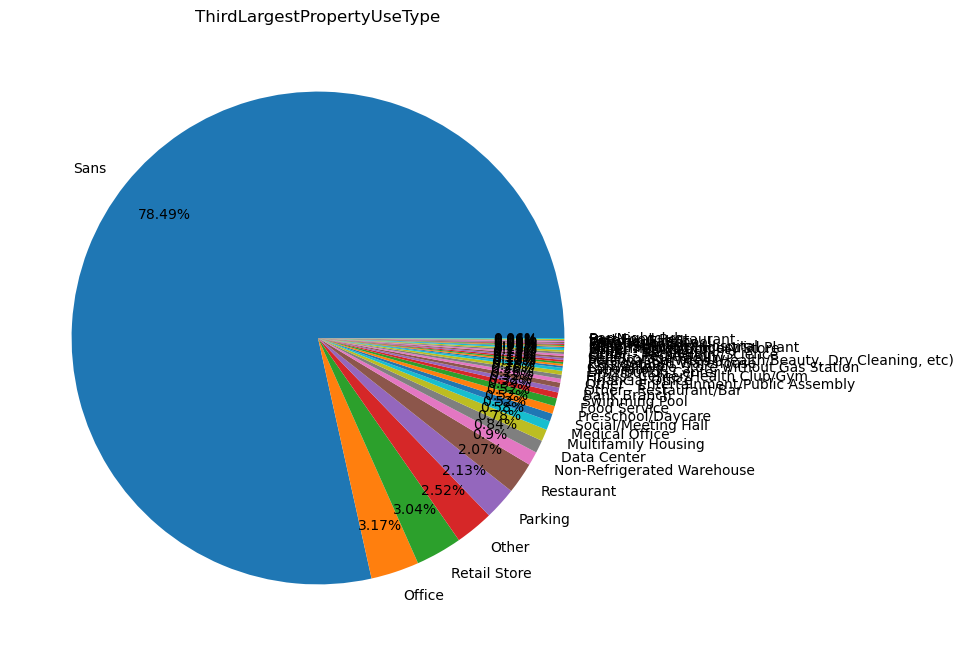

In [48]:
for col in df[['BuildingType', 'PrimaryPropertyType','Neighborhood','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']]:
    plt.figure(figsize=(8,8))
    df[col].value_counts(dropna=False).plot.pie(autopct = lambda col: str(round(col, 2)) + '%',pctdistance = 0.8 )
    plt.title(col, fontsize= 12)
    plt.ylabel(None)

# Geopandas

Je vais utiliser geopandas afin d'afficher mes données sur la carte de Seattle.

In [49]:
# Je crée une colonne de géométrie contenant des objets Point en utilisant la longitude et la latitude du jeu de données.
geometry= [Point(xy) for xy in zip (df['Longitude'] , df['Latitude'])];
geometry[:3]

In [50]:
# Conversion de la dataframe en Geodataframe
df_geo = gpd.GeoDataFrame(df,crs='epsg:4326',geometry=geometry)

In [51]:
df_geo.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Text(0.5, 1.0, 'BuildingType')

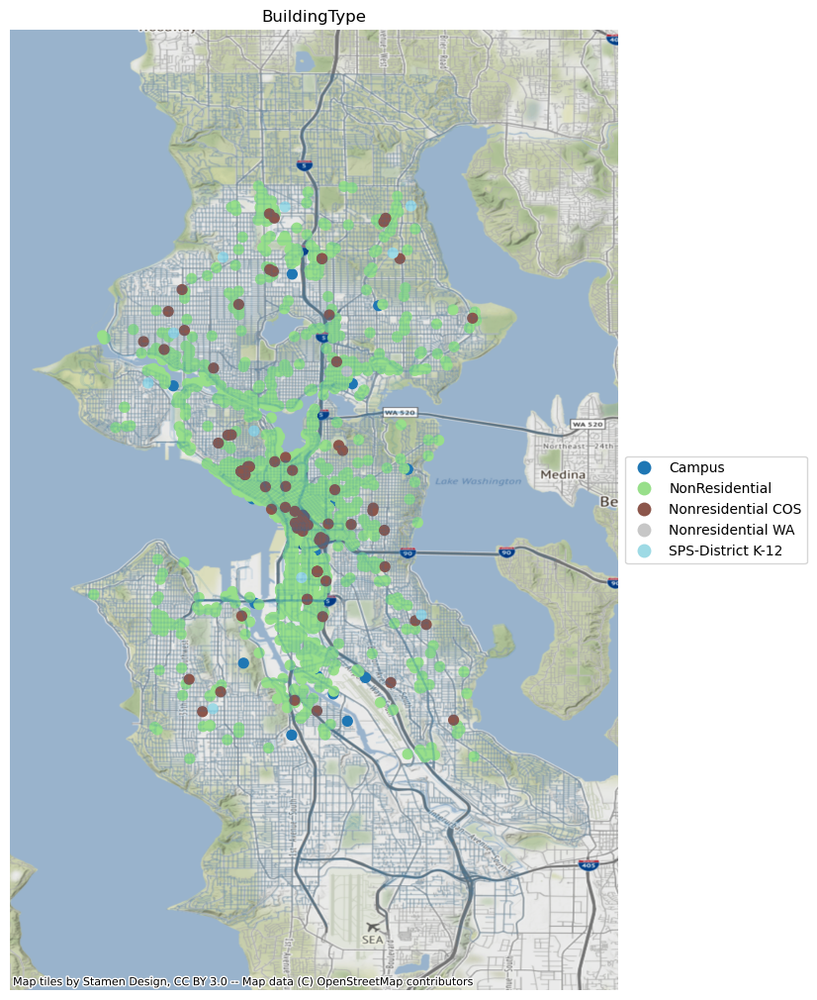

In [52]:
# Initialize our plot
fig, ax = plt.subplots(figsize=(8,10))
# Plot our SF GeoDataFrame
carte.plot(ax=ax, alpha = .1)
# Plot our Starbucks locations
df_geo.plot(ax=ax, column = 'BuildingType', cmap = 'tab20', marker = 'o', markersize=50,  legend = True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)})
# Add in a background using contextily
ctx.add_basemap(ax, crs=df_geo.crs.to_string())
# Turn off axis
ax.set_axis_off()
fig.tight_layout()
plt.title("BuildingType")

- Il y a majoritairement des bâtiments non résidentiels

Text(0.5, 1.0, 'PrimaryPropertyType')

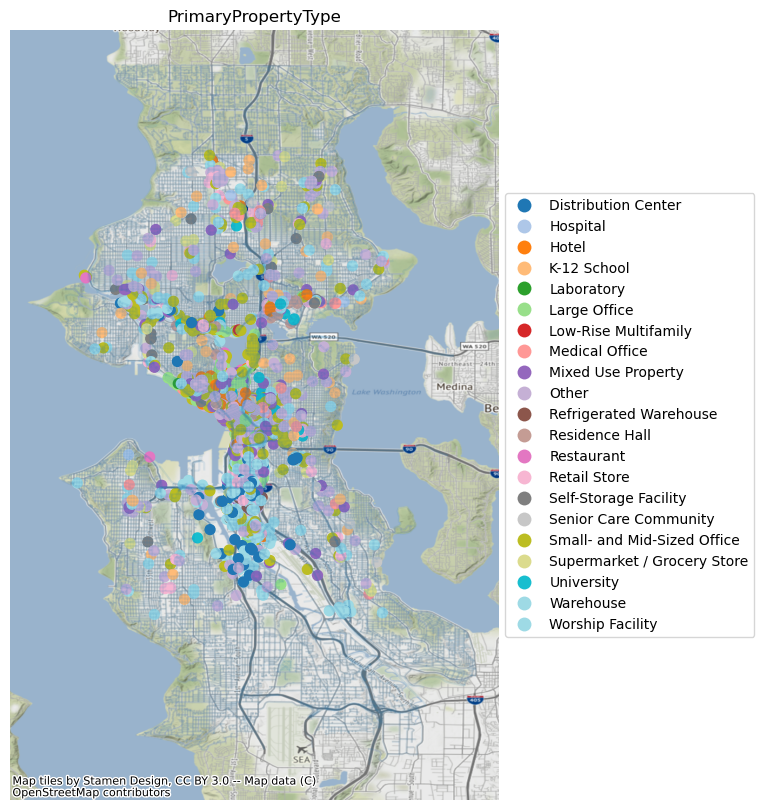

In [53]:
# Initialize our plot
fig, ax = plt.subplots(figsize=(8,8))
# Plot our SF GeoDataFrame
carte.plot(ax=ax, alpha = .1)
# Plot our locations
df_geo.plot(ax=ax, column = 'PrimaryPropertyType',categorical=True ,cmap = 'tab20', marker = 'o', markersize=50, legend = True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)})

# Add in a background using contextily
ctx.add_basemap(ax, crs=df_geo.crs.to_string())
# Turn off axis
ax.set_axis_off()
fig.tight_layout()
plt.title("PrimaryPropertyType")


Text(0.5, 1.0, 'Neighborhood')

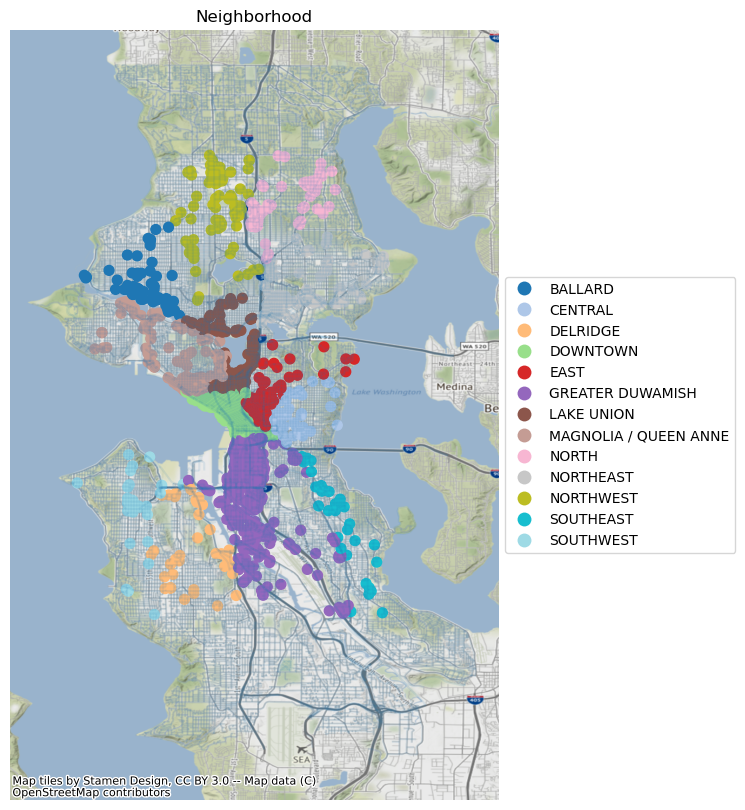

In [54]:
# Initialize our plot
fig, ax = plt.subplots(figsize=(8,8))
# Plot our SF GeoDataFrame
carte.plot(ax=ax, alpha = .1)
# Plot our locations
df_geo.plot(ax=ax, column = 'Neighborhood',categorical=True ,cmap = 'tab20', marker = 'o', markersize=50, legend = True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)})

# Add in a background using contextily
ctx.add_basemap(ax, crs=df_geo.crs.to_string())
# Turn off axis
ax.set_axis_off()
fig.tight_layout()
plt.title("Neighborhood")


# Variables quantitatives

In [55]:
df_geo.select_dtypes('number').describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,1548.000000,1548.0,1535.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1548.000000,1.548000e+03,1548.000000,1.548000e+03,1.544000e+03,842.000000,348.000000,997.000000,1548.000000,1547.000000,1548.000000,1548.000000,1.548000e+03,1.547000e+03,1.548000e+03,1.548000e+03,1.548000e+03,1.548000e+03,1.548000e+03,1548.000000,1548.000000
mean,16497.944444,2016.0,98116.776547,4.415375,47.616488,-122.333518,1961.644057,1.178941,4.276486,1.255130e+05,18023.282946,1.074898e+05,9.994564e+04,37318.538357,16903.863215,63.635908,75.084109,77.525857,183.216667,185.360271,8.860058e+06,8.441981e+06,5.511831e+05,1.799777e+06,6.140840e+06,2.038297e+04,2.038297e+06,193.608908,1.667358
std,13827.877766,0.0,18.695570,2.191527,0.046954,0.023264,32.886918,3.039221,6.780694,3.165002e+05,52288.367379,2.926272e+05,2.855014e+05,67530.427630,39288.680986,28.825309,75.212839,76.235063,187.966057,187.995700,3.130568e+07,2.277676e+07,5.718502e+06,6.304430e+06,2.151071e+07,9.710667e+04,9.710667e+06,779.105278,2.407577
min,1.000000,2016.0,98006.000000,1.000000,47.509590,-122.411820,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,1.400000,0.000000,0.000000,-2.100000,5.713320e+04,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,-0.800000,-0.020000
25%,602.750000,2016.0,98104.000000,2.000000,47.587855,-122.342997,1930.000000,1.000000,1.000000,2.898075e+04,0.000000,2.793675e+04,2.501575e+04,5913.000000,3020.250000,44.000000,34.900002,37.000000,81.199997,84.225002,1.251083e+06,1.322090e+06,0.000000e+00,2.142041e+05,7.308642e+05,0.000000e+00,0.000000e+00,20.655000,0.360000
50%,21180.500000,2016.0,98109.000000,4.000000,47.612710,-122.333160,1965.500000,1.000000,2.000000,4.886600e+04,0.000000,4.608400e+04,4.204300e+04,12633.500000,6168.000000,71.000000,53.750000,56.299999,138.650002,141.800003,2.732167e+06,2.824097e+06,0.000000e+00,5.117487e+05,1.746086e+06,4.881350e+03,4.881350e+05,49.845000,0.880000
75%,24609.000000,2016.0,98125.000000,7.000000,47.649060,-122.322700,1989.000000,1.000000,4.000000,1.083720e+05,4055.500000,9.556825e+04,9.203675e+04,32866.000000,13693.750000,88.000000,85.199997,87.900002,213.549995,215.749996,7.294487e+06,7.470130e+06,0.000000e+00,1.543064e+06,5.264935e+06,1.530812e+04,1.530812e+06,147.227500,1.960000
max,50226.000000,2016.0,98199.000000,7.000000,47.733870,-122.261800,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,639931.000000,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,16870.980000,34.090000


Observations :  
- **'NumberofBuildings'** comprend des lignes avec 0 ou 111 bâtiments.
- **'NumberofFloors'** comprend des lignes avec 0 niveau (est-ce que le rez-de-chaussé équivaut à 0?) et 99 niveaux (building ou erreur de saisie)
- **'TotalGHGEmissions','GHGEmissionsIntensity'**: comprennent des lignes avec des relevés négatifs (est-ce possible?)  

In [56]:
# Je dois modifier le type des colonnes 'ZipCode' et 'NumberofBuildings' en int
df_geo['NumberofBuildings'] = df_geo['NumberofBuildings'].astype('Int64');  


In [57]:
# Number of Buildings:
df_geo.loc[df_geo['NumberofBuildings']==0,:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry
2188,24716,2016,NonResidential,Refrigerated Warehouse,Pacific Commercial,85 South Atlantic St.,Seattle,WA,98134.0,7666207070,2,GREATER DUWAMISH,47.589990,-122.335390,1937,0,2,24430,0,24430,"Other, Refrigerated Warehouse",Refrigerated Warehouse,15667.0,Other,8690.0,Sans,NaN,NaN,NaN,50.599998,53.299999,131.000000,133.800003,1.232823e+06,1.297406e+06,0.000000e+00,2.658868e+05,907206.0,3256.170166,325617.0,False,Compliant,NaN,23.62,0.97,POINT (-122.33539 47.58999)
2407,25546,2016,NonResidential,Mixed Use Property,Compass Housing Alliance - Pioneer Square,210 Alaskan Way S / 77 S. Washington St,Seattle,WA,98104.0,5247800080,7,DOWNTOWN,47.600500,-122.335140,2005,0,5,57600,0,57600,"Financial Office, Multifamily Housing, Parking...",Residence Hall/Dormitory,27600.0,Multifamily Housing,16000.0,Financial Office,7000.0,NaN,NaN,138.000000,145.399994,277.000000,286.899994,6.983736e+06,7.355579e+06,0.000000e+00,9.372571e+05,3197921.0,37858.144530,3785814.0,False,Compliant,NaN,223.36,3.88,POINT (-122.33514 47.60050)
3259,49924,2016,NonResidential,Small- and Mid-Sized Office,SCCC DISTRICT/ERICKSON,1500 HARVARD AVE,Seattle,WA,98122.0,7502500010,3,EAST,47.614380,-122.321740,1912,0,2,64820,0,64820,"Movie Theater, Office, Vocational School",Office,37668.0,Movie Theater,11500.0,Vocational School,10000.0,NaN,NaN,38.400002,39.400002,110.300003,111.400002,2.274297e+06,2.332889e+06,0.000000e+00,5.805297e+05,1980767.0,2935.290039,293529.0,False,Compliant,NaN,29.40,0.45,POINT (-122.32174 47.61438)
2214,24822,2016,NonResidential,Small- and Mid-Sized Office,1943 First Avenue,1943 1st Avenue South,Seattle,WA,98134.0,7666207160,2,GREATER DUWAMISH,47.584620,-122.334700,1910,0,3,49052,0,49052,"Office, Retail Store",Office,32393.0,Retail Store,10057.0,Sans,NaN,NaN,96.0,34.000000,34.000000,106.599998,106.599998,1.441446e+06,1.441446e+06,0.000000e+00,4.224635e+05,1441445.0,0.000000,0.0,False,Compliant,NaN,10.05,0.20,POINT (-122.33470 47.58462)
2631,26331,2016,NonResidential,Small- and Mid-Sized Office,Solid Ground,1501 N. 45th ST.,Seattle,WA,98103.0,4083300310,4,LAKE UNION,47.661170,-122.339100,1997,0,3,31686,7358,24328,"Food Service, Library, Office, Parking",Office,25927.0,Parking,6750.0,Food Service,3743.0,NaN,35.0,72.800003,72.800003,228.500000,228.500000,2.305644e+06,2.305644e+06,0.000000e+00,6.757454e+05,2305643.0,0.000000,0.0,False,Compliant,NaN,16.07,0.51,POINT (-122.33910 47.66117)
2115,24514,2016,NonResidential,Supermarket / Grocery Store,OAKTREE PLAZA ASSOC,10002 AURORA AVE N,Seattle,WA,98133.0,3126049389,5,NORTHWEST,47.702240,-122.344090,1986,0,1,45155,0,45155,Supermarket/Grocery Store,Supermarket/Grocery Store,45155.0,Sans,NaN,Sans,NaN,NaN,6.0,147.800003,149.100006,351.700012,349.899994,6.674180e+06,6.732712e+06,0.000000e+00,1.243978e+06,4244454.0,24297.255860,2429726.0,False,Compliant,NaN,158.63,3.51,POINT (-122.34409 47.70224)
2382,25461,2016,NonResidential,Restaurant,(ID25461) CHINA HARBOR RESTURANT & MARINA,2040 WESTLAKE AVE N,Seattle,WA,98109.0,4088803835,7,LAKE UNION,47.637340,-122.339880,1962,0,2,34072,0,34072,Restaurant,Restaurant,34072.0,Sans,NaN,Sans,NaN,NaN,NaN,193.300003,205.699997,366.399994,388.399994,6.584966e+06,7.007726e+06,0.000000e+00,7.80

In [58]:
# il s'agit d'une erreur de saisie, je remplace 0 par 1
df_geo.loc[df_geo['NumberofBuildings']==0,'NumberofBuildings']=1

In [59]:
df_geo.loc[df_geo['NumberofBuildings']==111,:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry
3274,49967,2016,Campus,University,University of Washington - Seattle Campus,NE 45th St & Brooklyn Ave,Seattle,WA,98105.0,1625049001,4,NORTHEAST,47.65644,-122.31041,1900,111,0,9320156,0,9320156,College/University,College/University,9320156.0,Sans,NaN,Sans,NaN,NaN,NaN,93.800003,0.0,246.600006,0.0,873923712.0,0.0,84985240.0,192577488.0,657074389.0,0.0,0.0,False,Compliant,NaN,11140.56,1.2,POINT (-122.31041 47.65644)


Il s'agit d'un campus, cela explique le grand nombre de bâtiments.

In [60]:
# Number of Floors
df_geo.loc[df_geo['NumberofFloors']==0,:].head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry
1993,24086,2016,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,1333 AIRPORT WAY S,Seattle,WA,98134.0,7666203387,2,GREATER DUWAMISH,47.59042,-122.32498,1991,10,0,230971,0,230971,"Other, Parking",Other,230970.0,Sans,0.0,Sans,NaN,NaN,NaN,91.000000,96.199997,235.100006,242.199997,2.102229e+07,22230844.0,0.0,4.519276e+06,15419770.0,56025.152340,5602515.0,False,Compliant,NaN,405.05,1.75,POINT (-122.32498 47.59042)
3274,49967,2016,Campus,University,University of Washington - Seattle Campus,NE 45th St & Brooklyn Ave,Seattle,WA,98105.0,1625049001,4,NORTHEAST,47.65644,-122.31041,1900,111,0,9320156,0,9320156,College/University,College/University,9320156.0,Sans,NaN,Sans,NaN,NaN,NaN,93.800003,0.000000,246.600006,0.000000,8.739237e+08,0.0,84985240.0,1.925775e+08,657074389.0,0.000000,0.0,False,Compliant,NaN,11140.56,1.20,POINT (-122.31041 47.65644)
3273,49966,2016,NonResidential,Other,Smilow Rainier Vista Boys & Girls Club,4520 Martin Luther King Jr. Way S,Seattle,WA,98108.0,6056110050,2,SOUTHEAST,47.56260,-122.29396,2009,1,0,40265,0,40265,Pre-school/Daycare,Pre-school/Daycare,40265.0,Sans,NaN,Sans,NaN,NaN,NaN,53.599998,56.200001,127.500000,130.199997,2.159170e+06,2261075.5,0.0,4.020232e+05,1371703.0,7874.669922,787467.0,False,Compliant,NaN,51.39,1.28,POINT (-122.29396 47.56260)
3280,49983,2016,NonResidential,Residence Hall,Poplar Hall,3715 W Stevens Way NE,Seattle,WA,98195.0,1625049001,4,NORTHEAST,47.65176,-122.30756,2011,1,0,97040,0,97040,Residence Hall/Dormitory,Residence Hall/Dormitory,97040.0,Sans,NaN,Sans,NaN,NaN,69.0,40.099998,42.000000,109.500000,114.400002,3.894142e+06,4075094.5,0.0,9.172990e+05,3129824.0,7643.180176,764318.0,False,Compliant,NaN,62.41,0.64,POINT (-122.30756 47.65176)
3279,49980,2016,NonResidential,Residence Hall,Mercer Hall,1009 NE Pacific St,Seattle,WA,98195.0,1625049001,4,NORTHEAST,47.65447,-122.31733,1970,1,0,89392,0,89392,Residence Hall/Dormitory,Residence Hall/Dormitory,89392.0,Sans,NaN,Sans,NaN,NaN,16.0,77.900002,83.699997,244.500000,262.899994,6.960904e+06,7483350.0,0.0,2.040124e+06,6960904.0,0.000000,0.0,False,Compliant,NaN,48.53,0.54,POINT (-122.31733 47.65447)


D'après ce pdf (page 5): 
chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://www.dartmouth.edu/fom/docs/bldg_room_id_standards.pdf

*The floor below the first floor will be identified as Basement and have a floor code of ‘0’.*  

0 est ici considéré comme rez-de-chaussée. 

In [61]:
df_geo['NumberofFloors'].describe()

count    1548.000000
mean        4.276486
std         6.780694
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max        99.000000
Name: NumberofFloors, dtype: float64

In [62]:
df_geo.loc[df_geo['NumberofFloors']==99,:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry
1359,21611,2016,NonResidential,Worship Facility,Seattle Chinese Baptist Church,5801 Beacon Avenue South,Seattle,WA,98108.0,2124049098,2,GREATER DUWAMISH,47.55072,-122.30265,1977,1,99,21948,0,21948,Worship Facility,Worship Facility,21948.0,Sans,NaN,Sans,NaN,NaN,80.0,14.9,14.9,46.599998,46.599998,326001.1875,326001.1875,0.0,95545.5,326001.0,0.0,0.0,False,Compliant,NaN,2.27,0.1,POINT (-122.30265 47.55072)


J'ai fait une recherche sur google map :
https://www.google.com/maps/uv?pb=!1s0x549041e433f47dc1%3A0xd9aaac8f1cebfad0!3m1!7e115!4s%2Fmaps%2Fplace%2FSeattle%2BChinese%2BBaptist%2BChurch%2B5801%2BBeacon%2BAvenue%2BSouth%2F%4047.5510625%2C-122.3031968%2C3a%2C75y%2C136.96h%2C90t%2Fdata%3D*213m4*211e1*213m2*211s6FZ3PGUeormDhw-X66Kn6w*212e0*214m2*213m1*211s0x549041e433f47dc1%3A0xd9aaac8f1cebfad0%3Fsa%3DX!5sSeattle%20Chinese%20Baptist%20Church%205801%20Beacon%20Avenue%20South%20-%20Recherche%20Google!15sCgIgAQ&imagekey=!1e2!2s6FZ3PGUeormDhw-X66Kn6w&hl=fr&sa=X&ved=2ahUKEwjV_N2p5un6AhUK0oUKHbdiDIMQpx96BAhlEAg

Il s'agit d'une erreur de saisie, je modifie 99 par 0 (qui correspond au rez-de-chaussée)

In [63]:
df_geo.loc[df_geo['NumberofFloors']==99,'NumberofFloors']=0

In [64]:
df_geo['NumberofFloors'].describe()

count    1548.000000
mean        4.212532
std         6.339209
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max        76.000000
Name: NumberofFloors, dtype: float64

In [65]:
df_geo.loc[df['NumberofFloors']==76,:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry
559,775,2016,NonResidential,Large Office,Columbia Center - 2015,701 5th Avenue,Seattle,WA,98104.0,0942000640,7,DOWNTOWN,47.60454,-122.33072,1985,1,76,1952220,319400,1632820,"Office, Parking",Office,1680937.0,Parking,319368.0,Sans,NaN,2017201620152012200920072006,86.0,55.299999,55.099998,167.300003,166.5,92937640.0,92537256.0,0.0,25747908.0,87851862.0,50857.63281,5085763.0,False,Compliant,NaN,882.56,0.45,POINT (-122.33072 47.60454)


Pas d'erreur de saisie, il s'agit bien d'un gratte-ciel:  
https://en.wikipedia.org/wiki/Columbia_Center

# Colonne '...PropertyUseTypeGFA'

In [66]:
df_geo.loc[(df_geo['SecondLargestPropertyUseTypeGFA'].isna())][['SecondLargestPropertyUseType']].value_counts()

SecondLargestPropertyUseType
Sans                            706
dtype: int64

In [67]:
# Ces bâtiments ne possèdent pas d'activités secondaires. J'impute mes valeurs manquantes par 0.
df_geo.loc[df_geo['SecondLargestPropertyUseTypeGFA'].isna(),'SecondLargestPropertyUseTypeGFA']=0

In [68]:
# Même procédé avec ThirdLargestPropertyUseTypeGFA
df_geo.loc[(df_geo['ThirdLargestPropertyUseTypeGFA'].isna())][['ThirdLargestPropertyUseType']].value_counts()

ThirdLargestPropertyUseType
Sans                           1200
dtype: int64

In [69]:
# Ces bâtiments ne possèdent pas d'activités tertiaires. J'impute mes valeurs manquantes par 0.
df_geo.loc[df_geo['ThirdLargestPropertyUseTypeGFA'].isna(),'ThirdLargestPropertyUseTypeGFA']=0

In [70]:
# Même procédé pour la colonne LargestPropertyUseTypeGFA
df_geo.loc[df_geo['LargestPropertyUseTypeGFA'].isna(),'LargestPropertyUseTypeGFA']= df_geo['PropertyGFABuilding(s)']

In [71]:
df_geo.filter(regex=("PropertyUseType")).isna().mean()

ListOfAllPropertyUseTypes          0.0
LargestPropertyUseType             0.0
LargestPropertyUseTypeGFA          0.0
SecondLargestPropertyUseType       0.0
SecondLargestPropertyUseTypeGFA    0.0
ThirdLargestPropertyUseType        0.0
ThirdLargestPropertyUseTypeGFA     0.0
dtype: float64

# Colonne Outlier


In [72]:
df_geo['Outlier'].isna().mean()

1.0

In [73]:
q1 = df_geo['SiteEnergyUse(kBtu)'].quantile(0.25)
q3 = df_geo['SiteEnergyUse(kBtu)'].quantile(0.75)
iqr = q3-q1 #Interquartile range
fence_low  = q1-1.5*iqr
fence_high = q3+1.5*iqr

df_geo.loc[(df_geo['SiteEnergyUse(kBtu)'] > fence_low) & (df_geo['SiteEnergyUse(kBtu)'] < fence_high),'Outlier']=0;
df_geo['Outlier'] = df_geo['Outlier'].fillna(1)

In [74]:
df_geo['Outlier'].value_counts()

0    1373
1     175
Name: Outlier, dtype: int64

# Colonne ZipCode

In [75]:
df_geo= df_geo.drop(df_geo.loc[df_geo['ZipCode'].isna()].index);
df_geo['ZipCode'] = df_geo['ZipCode'].astype('int32')

In [76]:
df_geo = df_geo.sort_values('ZipCode')

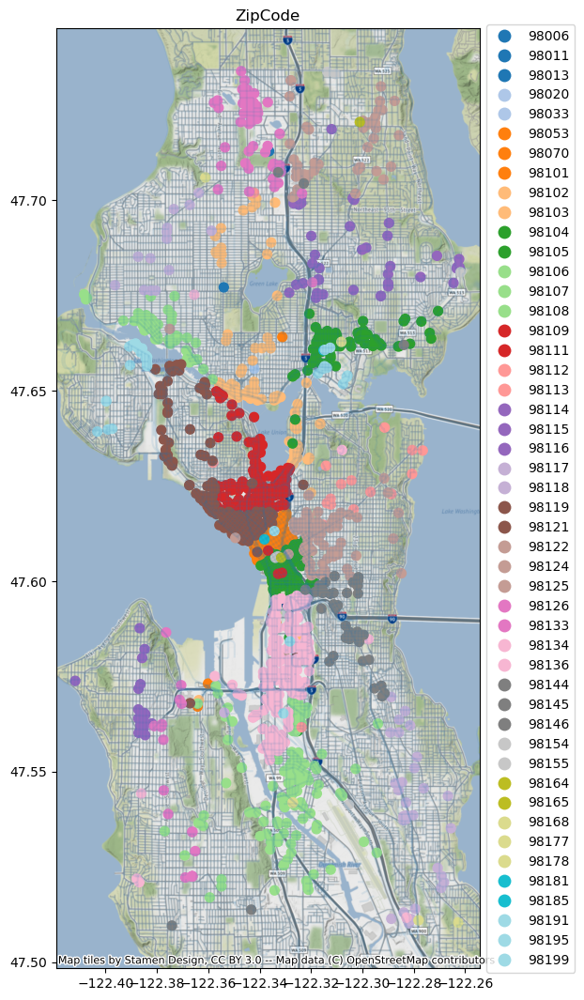

In [77]:
# Affichage des codes postaux et des quartiers de seattle
fig, (ax1) = plt.subplots(1, figsize=(13, 13))

# Affichage de la carte avec les codes postaux
df_geo.plot(ax=ax1, column = 'ZipCode',categorical=True,cmap='tab20',legend=True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},marker = 'o', markersize=50,) 

ctx.add_basemap(ax=ax1, crs=df_geo.crs.to_string())
carte.plot(ax=ax1, alpha = .1)
plt.title('ZipCode')
plt.show()

Il semble que la colonne ZipCode comporte beaucoup d'erreurs.  
Je la retire de mon jeu de données.

In [78]:
df_geo = df_geo.drop(columns='ZipCode')

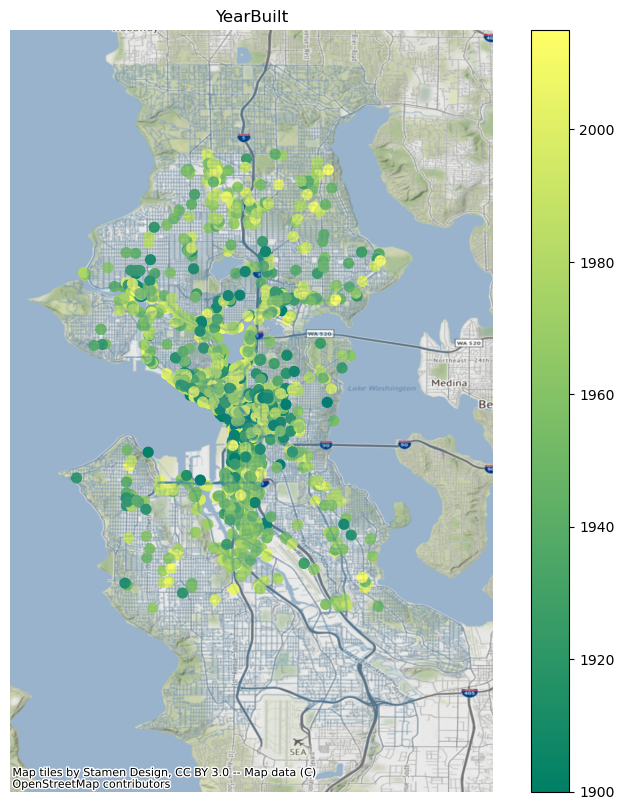

In [79]:
# Initialize our plot
fig, ax = plt.subplots(figsize=(8,8))
# Plot our SF GeoDataFrame
carte.plot(ax=ax, alpha = .1)
# Plot our locations
df_geo.plot(ax=ax, column = 'YearBuilt', cmap = 'summer', marker = 'o', markersize=50,legend=True)

# Add in a background using contextily
ctx.add_basemap(ax, crs=df_geo.crs.to_string())
# Turn off axis
ax.set_axis_off()
fig.tight_layout()
plt.title("YearBuilt")
plt.show()

In [80]:
df_geo['YearBuilt'].max()

2015

In [81]:
df_geo['year_discr']=pd.cut(
    df_geo['YearBuilt'], 
    bins=[df_geo['YearBuilt'].min(), 
          1925,
          1950,
          1975,
          2000,
          df_geo['YearBuilt'].max()
         ],
    include_lowest = True)

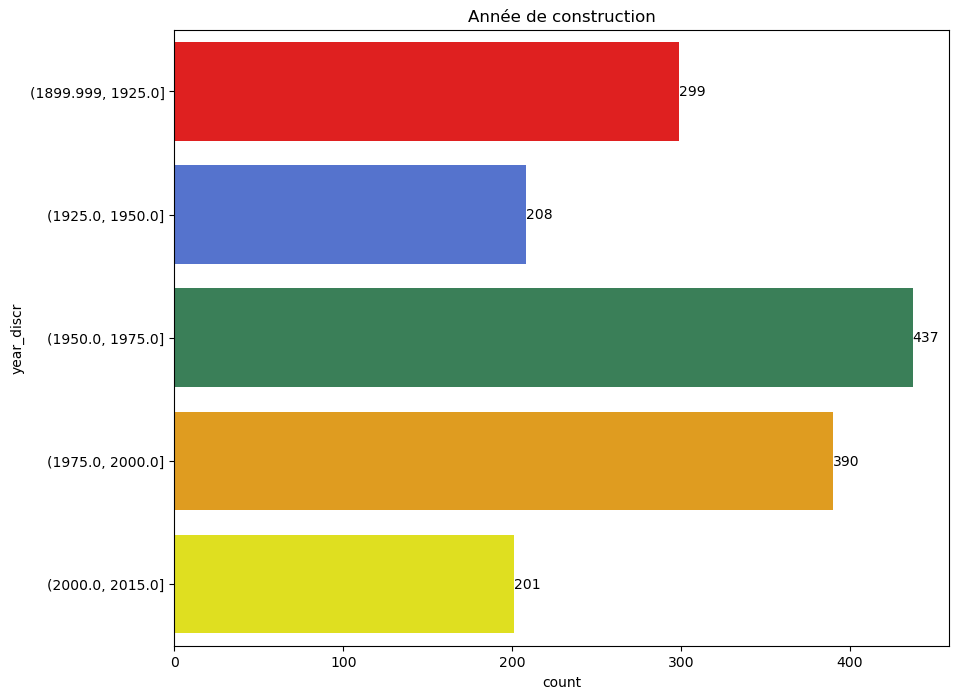

In [82]:
plt.figure(figsize=(10,8))
color = ['red','royalblue','seagreen','orange','yellow']
ax2 = sns.countplot(y='year_discr', data=df_geo,palette=color)
ax2.bar_label(ax2.containers[0])
plt.title('Année de construction')
plt.show()

In [83]:
df_geo['year_discr'].value_counts()

(1950.0, 1975.0]      437
(1975.0, 2000.0]      390
(1899.999, 1925.0]    299
(1925.0, 1950.0]      208
(2000.0, 2015.0]      201
Name: year_discr, dtype: int64

<AxesSubplot: >

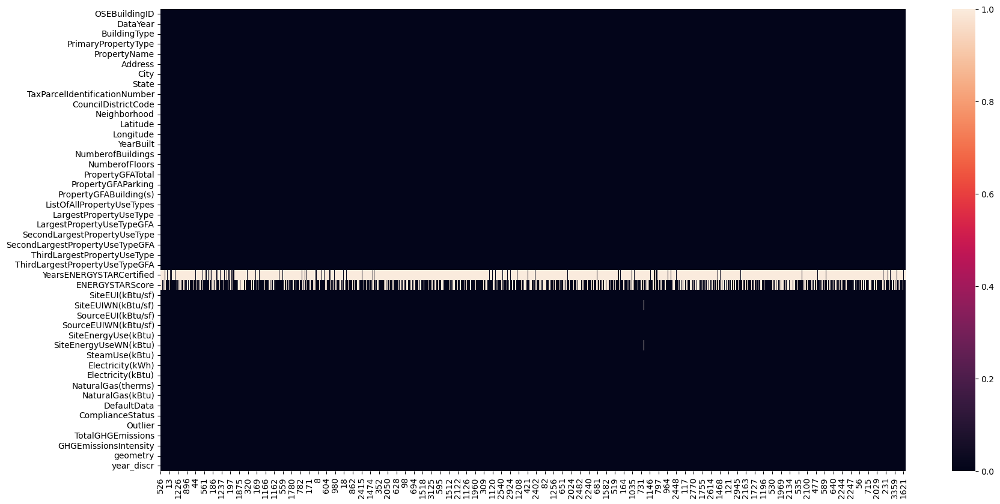

In [84]:
# Valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(df_geo.isna().T)

In [85]:
# Je retire les relevés normalisés et ceux avec une unité différente du Kbtu. 
df_geo = df_geo.drop(columns=['SiteEUIWN(kBtu/sf)','SourceEUIWN(kBtu/sf)','Electricity(kWh)','NaturalGas(therms)','SiteEnergyUseWN(kBtu)'],axis=1)

In [86]:
(df_geo.isna().sum()/df_geo.shape[0]).sort_values(ascending=False)

YearsENERGYSTARCertified           0.936808
ENERGYSTARScore                    0.350489
OSEBuildingID                      0.000000
LargestPropertyUseTypeGFA          0.000000
SecondLargestPropertyUseTypeGFA    0.000000
ThirdLargestPropertyUseType        0.000000
ThirdLargestPropertyUseTypeGFA     0.000000
SiteEUI(kBtu/sf)                   0.000000
SourceEUI(kBtu/sf)                 0.000000
SiteEnergyUse(kBtu)                0.000000
SteamUse(kBtu)                     0.000000
Electricity(kBtu)                  0.000000
NaturalGas(kBtu)                   0.000000
DefaultData                        0.000000
ComplianceStatus                   0.000000
Outlier                            0.000000
TotalGHGEmissions                  0.000000
GHGEmissionsIntensity              0.000000
geometry                           0.000000
SecondLargestPropertyUseType       0.000000
LargestPropertyUseType             0.000000
DataYear                           0.000000
ListOfAllPropertyUseTypes       

# Colonnes EnergyStar

In [87]:
df_geo.loc[(df_geo['YearsENERGYSTARCertified'].isna())&(df_geo['ENERGYSTARScore'].isna()),:]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr
526,712,2016,NonResidential,Large Office,51 University,51 University,Seattle,WA,7666202475,7,DOWNTOWN,47.60604,-122.33948,1918,1,6,108245,14690,93555,"Adult Education, Fitness Center/Health Club/Gy...",Office,64055.0,Adult Education,14621.0,Parking,12359.0,NaN,NaN,45.799999,138.699997,4.515180e+06,266262.0,4248918.0,0.0,False,Compliant,0,50.17,0.46,POINT (-122.33948 47.60604),"(1899.999, 1925.0]"
1773,23368,2016,NonResidential,Mixed Use Property,Seaboard Building,1500-1506 4th Ave.,Seattle,WA,7628750000,7,DOWNTOWN,47.61056,-122.33661,1909,1,11,111137,0,111137,"Bank Branch, Multifamily Housing, Office, Othe...",Office,42939.0,Multifamily Housing,40878.0,Bank Branch,10887.0,NaN,NaN,96.400002,198.300003,9.546165e+06,0.0,4602455.0,4943709.0,False,Compliant,0,294.65,2.65,POINT (-122.33661 47.61056),"(1899.999, 1925.0]"
726,19730,2016,NonResidential,Other,Brick Building,6615 Dayton Ave North,Seattle,WA,0625049063,6,NORTHWEST,47.67713,-122.35398,1917,1,2,28072,0,28072,Social/Meeting Hall,Social/Meeting Hall,23835.0,Sans,0.0,Sans,0.0,NaN,NaN,57.200001,76.900002,1.362523e+06,0.0,192436.0,1170087.0,False,Compliant,0,63.48,2.26,POINT (-122.35398 47.67713),"(1899.999, 1925.0]"
3171,49709,2016,NonResidential,Other,"Seattle ProCure Management, LLC.",1570 North 115th Street,Seattle,WA,3026049128,5,NORTHWEST,47.71286,-122.33635,2012,1,2,53575,0,53575,Urgent Care/Clinic/Other Outpatient,Urgent Care/Clinic/Other Outpatient,53575.0,Sans,0.0,Sans,0.0,NaN,NaN,593.599976,1527.300049,3.180357e+07,0.0,23173477.0,8630089.0,False,Compliant,1,619.90,11.57,POINT (-122.33635 47.71286),"(2000.0, 2015.0]"
32,38,2016,NonResidential,Small- and Mid-Sized Office,Good Shepherd Center,4649 Sunnyside Ave. N.,Seattle,WA,0825049008,4,LAKE UNION,47.66410,-122.33118,1906,1,3,87262,0,87262,"K-12 School, Multifamily Housing, Office, Othe...",Office,40943.0,K-12 School,18153.0,Other - Entertainment/Public Assembly,4307.0,NaN,NaN,61.500000,106.500000,4.145920e+06,0.0,1352843.0,2793077.0,False,Compliant,0,157.77,1.81,POINT (-122.33118 47.66410),"(1899.999, 1925.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3321,50038,2016,NonResidential,Mixed Use Property,Salmon Bay Marine Center West,2360 W Commodore Way,Seattle,WA,2771605298,7,MAGNOLIA / QUEEN ANNE,47.66144,-122.38723,2014,1,2,25532,0,25532,"Office, Repair Services (Vehicle, Shoe, Locksm...",Office,11745.0,"Repair Services (Vehicle, Shoe, Locksmith, etc)",11745.0,Sans,0.0,NaN,NaN,26.700001,83.900002,6.278541e+05,0.0,627854.0,0.0,False,Compliant,0,4.38,0.17,POINT (-122.38723 47.66144),"(2000.0, 2015.0]"
1568,22504,2016,NonResidential,Other,"MER Equipment,Inc.",2400 w Commodore Way,Seattle,WA,2771605305,7,MAGNOLIA / QUEEN ANNE,47.66126,-122.38751,1965,1,1,23169,0,23169,Manufacturing/Industrial Plant,Manufacturing/Industrial Plant,10200.0,Sans,0.0,Sans,0.0,NaN,NaN,21.799999,68.400002,2.222559e+05,0.0,222256.0,0.0,False,Compliant,0,1.55,0.07,POINT (-122.38751 47.66126),"(1950.0, 1975.0]"
1486,21955,2016,NonResidential,Small- and Mid-Sized Office,Magnolia Center,3214 W McGraw St,Seattle,WA,2225039036,7,MAGNOLIA / QUEEN ANNE,47.63981,-122.39907,1927,1,3,23910,0,23910,"Office, Retail Store",Office,20000.0,

In [88]:
df_geo['YearsENERGYSTARCertified'].unique()

array([nan, '2016', '20172015', '201620142012201120082007',
       '2017201520142013201120092008', '2014201320122008',
       '20172016201520092008', '2017201320092008', '2017201120102007',
       '201720162014201320122011201020092007', '201720152014201220102008',
       '2015201320122010', '201720102007', '2012',
       '2017201620152014201320122011201020092008', '201020092007',
       '2017201520142013', '20092005', '20162015201320122010',
       '20162015201320122011201020092008',
       '201620152014201320112010200920072000', '201620142012',
       '201620092008', '2016201520142013201220112010', '201720162012',
       '201620152014', '20162012', '20162015', '2017',
       '2017201620152012200920072006',
       '2016201520142013201220112010200920082007200620052004', '20172016',
       '2012201020072006', '20152014201220112009', '201220092008',
       '2014201020082001',
       '201620152014201320122011201020092008200720062005200320022000',
       '2014201320112010200920082007', '201

In [89]:
df_geo['YearsENERGYSTARCertified'] = df_geo['YearsENERGYSTARCertified'].str.slice(stop=4)

In [90]:
df_geo['YearsENERGYSTARCertified'].unique()

array([nan, '2016', '2017', '2014', '2015', '2012', '2010', '2009',
       '2013', '2011', '2007'], dtype=object)

In [91]:
df_geo = df_geo.sort_values('YearsENERGYSTARCertified')

<AxesSubplot: xlabel='YearsENERGYSTARCertified', ylabel='ENERGYSTARScore'>

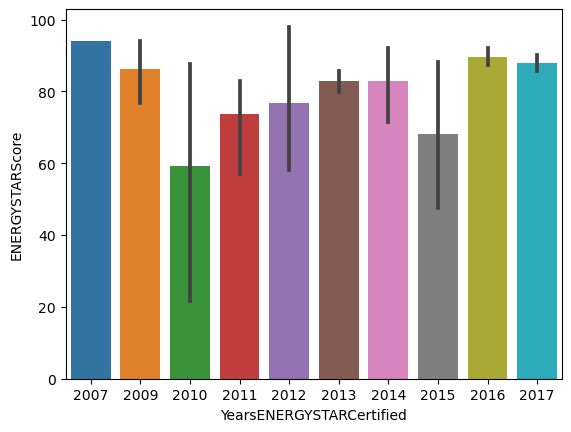

In [92]:
sns.barplot(data=df_geo, x="YearsENERGYSTARCertified", y="ENERGYSTARScore")

En 2010, le score Energy Star est plus bas que les autres.

<AxesSubplot: xlabel='ENERGYSTARScore', ylabel='BuildingType'>

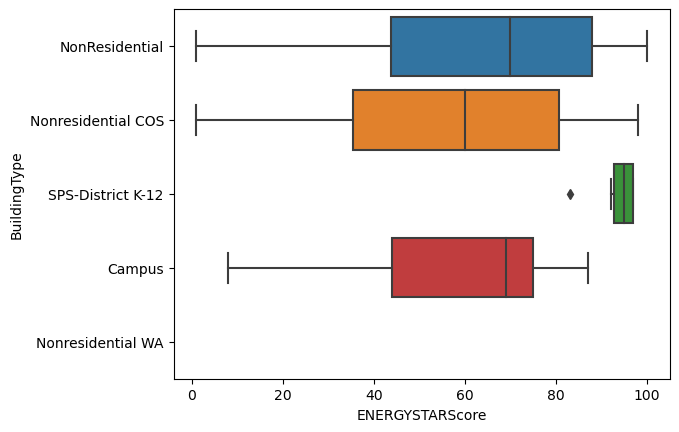

In [93]:
sns.boxplot(data=df_geo, y="BuildingType", x="ENERGYSTARScore")
plt.show()

SPS-District-K-12 ont les scores les plus hauts.

<AxesSubplot: xlabel='ENERGYSTARScore', ylabel='PrimaryPropertyType'>

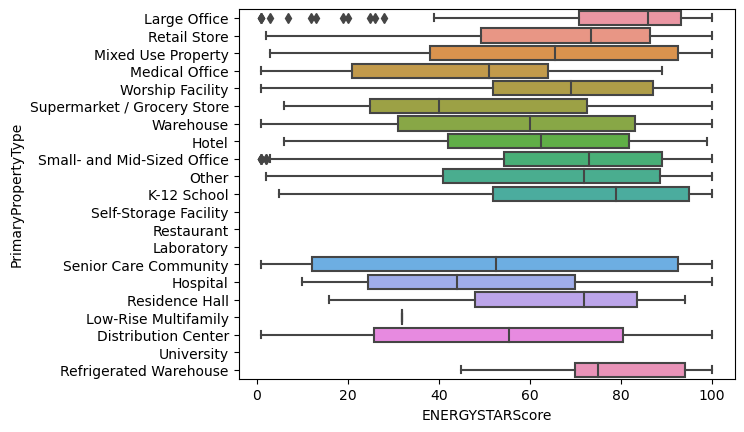

In [95]:
sns.boxplot(data=df_geo, y="PrimaryPropertyType", x="ENERGYSTARScore")

Large office obtient les meilleurs scores.

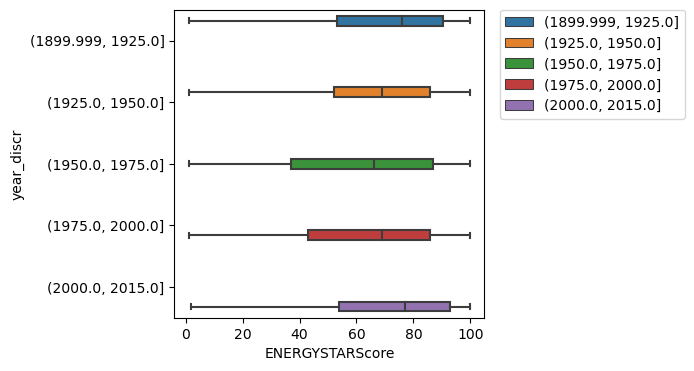

In [96]:
plt.figure(figsize=(4,4))
sns.boxplot(data=df_geo, y="year_discr", x="ENERGYSTARScore", hue='year_discr')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

Les meilleurs scores se situent entre 2000 et 2015.

In [97]:
df_geo['ENERGYSTARScore'].unique()

array([ 94.,  65.,  78.,  96.,  88.,  97.,  93.,  66.,   3.,  77.,  91.,
        83.,  81.,  57.,  58.,  74.,  98.,  82.,  87.,  79.,  84.,  89.,
        62.,  60.,  99.,  28.,  85.,  95.,  86.,  72.,  90.,  73.,  76.,
        92.,  nan,   8.,  68.,  27.,  61.,   1.,  35.,   5.,  49.,   2.,
        59.,  39.,  43.,  75.,  55.,  24.,  30.,  36.,  53.,  71.,  63.,
        56.,  54.,  37.,  67.,   6.,  14.,  47.,  80.,  17.,  45.,  25.,
        69.,  19.,  13.,  31.,  38.,  64.,   7.,  70.,  33.,  32.,  41.,
        48.,  29.,  16.,  51.,  18.,  50.,  46.,  52., 100.,  40.,  15.,
        23.,  21.,  20.,  22.,  26.,   9.,  10.,   4.,  42.,  44.,  34.,
        12.,  11.])

In [98]:
df_geo['YearsENERGYSTARCertified'].isna().sum()

1438

La colonne Year contient beaucoup de valeurs manquantes.

<Figure size 1200x800 with 0 Axes>

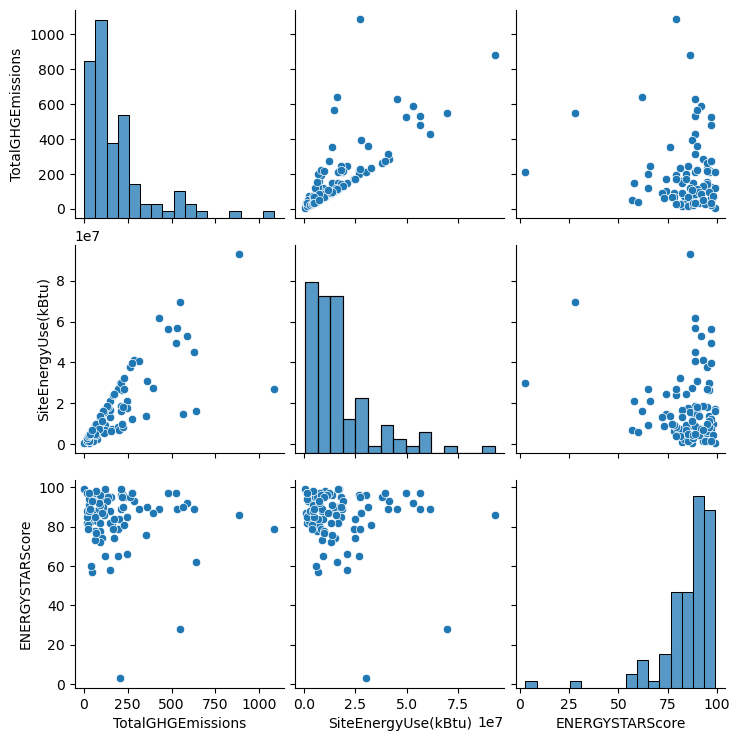

In [99]:
df_star = df_geo.loc[~df_geo['YearsENERGYSTARCertified'].isna(),:];
plt.figure(figsize=(12,8))
sns.pairplot(df_star[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)', 'ENERGYSTARScore']])
plt.show()

Il ne semble pas y avoir de corrélations entre le Score EnergyStar et SiteEnergyUse et TotalGHGEmissions

<AxesSubplot: xlabel='ENERGYSTARScore', ylabel='SteamUse(kBtu)'>

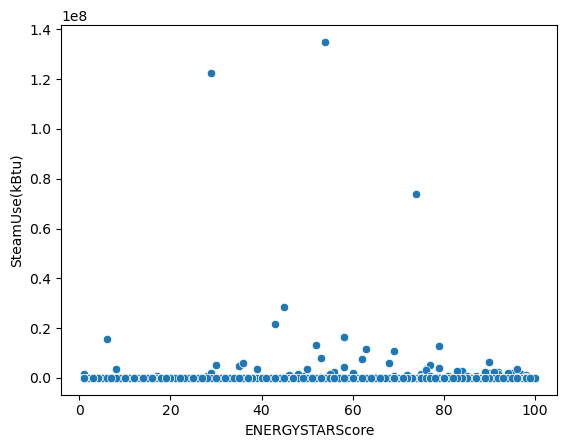

In [100]:
sns.scatterplot(data=df_geo,x='ENERGYSTARScore',y='SteamUse(kBtu)')

<AxesSubplot: xlabel='ENERGYSTARScore', ylabel='Electricity(kBtu)'>

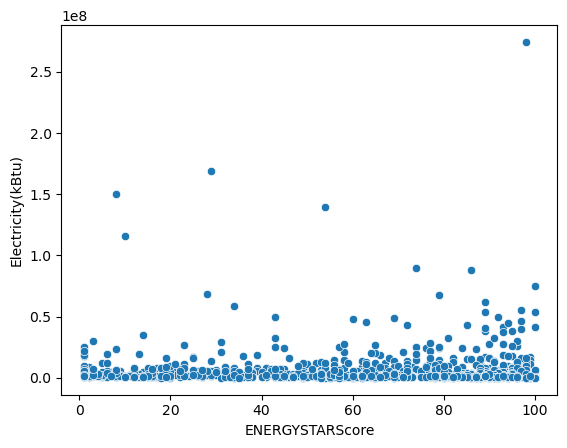

In [101]:
sns.scatterplot(data=df_geo,x='ENERGYSTARScore',y='Electricity(kBtu)')

<AxesSubplot: xlabel='ENERGYSTARScore', ylabel='NaturalGas(kBtu)'>

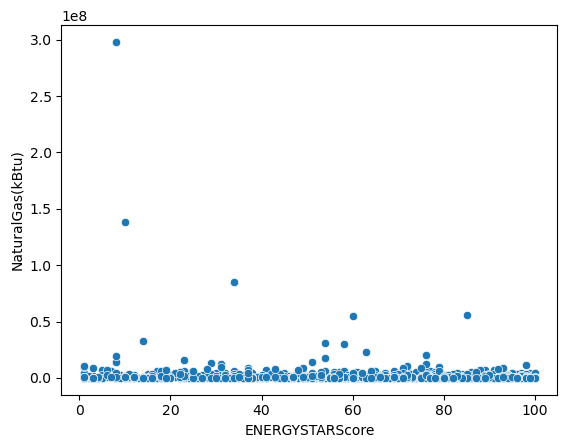

In [102]:
sns.scatterplot(data=df_geo,x='ENERGYSTARScore',y='NaturalGas(kBtu)')

In [103]:
df_geo['ENERGYSTARScore'] = df_geo['ENERGYSTARScore'].fillna(df_geo.groupby('BuildingType')['ENERGYSTARScore'].transform('mean'));
df_geo['ENERGYSTARScore'] = df_geo['ENERGYSTARScore'].fillna(df_geo['ENERGYSTARScore'].mean())

Pour imputer les valeurs manquantes, je regroupe mes bâtiments en fonction de la variable 'BuildingType' et je calcule la moyenne.  

In [104]:
df_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1535 entries, 252 to 2070
Data columns (total 41 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   OSEBuildingID                    1535 non-null   int64   
 1   DataYear                         1535 non-null   int64   
 2   BuildingType                     1535 non-null   object  
 3   PrimaryPropertyType              1535 non-null   object  
 4   PropertyName                     1535 non-null   object  
 5   Address                          1535 non-null   object  
 6   City                             1535 non-null   object  
 7   State                            1535 non-null   object  
 8   TaxParcelIdentificationNumber    1535 non-null   object  
 9   CouncilDistrictCode              1535 non-null   int64   
 10  Neighborhood                     1535 non-null   object  
 11  Latitude                         1535 non-null   float64 
 

<Figure size 1200x800 with 0 Axes>

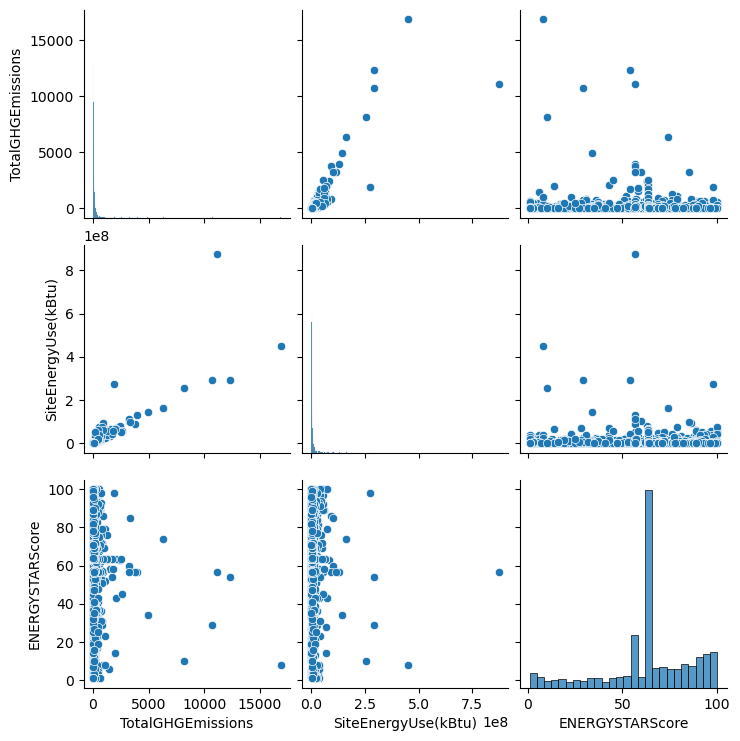

In [105]:
plt.figure(figsize=(12,8))
sns.pairplot(df_geo[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)', 'ENERGYSTARScore']])
plt.show()

Text(0.5, 1.0, 'Score EnergyStar')

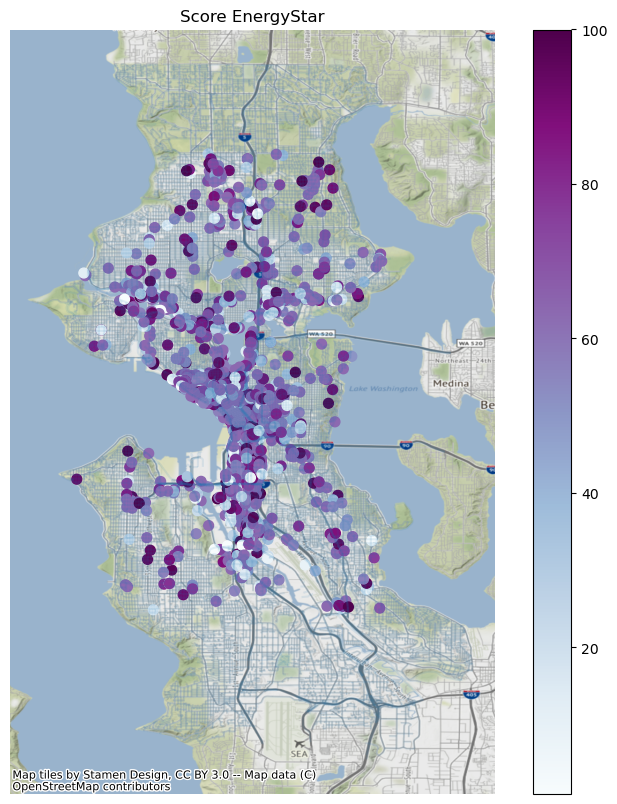

In [106]:
# Initialize our plot
fig, ax = plt.subplots(figsize=(8,8))
# Plot our SF GeoDataFrame
carte.plot(ax=ax, alpha = .1)
# Plot our locations
df_geo.plot(ax=ax, column = 'ENERGYSTARScore',cmap = 'BuPu', marker = 'o', markersize=50, legend = True,)

# Add in a background using contextily
ctx.add_basemap(ax, crs=df_geo.crs.to_string())
# Turn off axis
ax.set_axis_off()
fig.tight_layout()
plt.title("Score EnergyStar")

**Premières conclusions:**  

* **Le jeu de données est composé de 5 parties**
     - Identification du bâtiment (adresse, numéro d'identification, nom ...)
     - Information sur la composition du bâtiment ( Activité principale et secondaire, mesure GFA...)
     - Information EnergyStar
     - Mesures des différents relevés (Energie, gaz, vapeur, total emissions..) 
     - Informations sur la saisie des données (defautdata, comments,outlier...)  
     
* **Présence d'outliers** (observé sur les boxplots)  

* **Beaucoup de données manquantes** dans les colonnes qui traitent de l'activité secondaire et tertiaire ainsi que pour les       colonnes comments, outliers et YearsENERGYSTARCertified  

* **La colonne PropertyGFATotal** est la somme de :  
  - PropertyGFAParking + PropertyGFABuilding(s)
 
* **La colonne PropertyGFABuilding(s)** est la somme de :
  - LargestPropertyUseTypeGFA + SecondLargestPropertyUseTypeGFA (*si le terrain contient plusieurs activités*) +        
    ThirdLargestPropertyUseTypeGFA 

<AxesSubplot: >

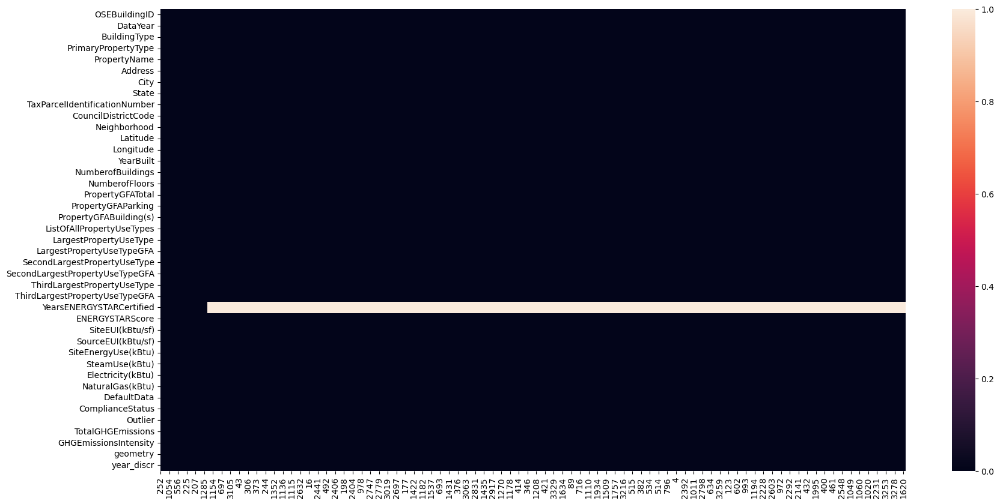

In [107]:
# Valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(df_geo.isna().T)

In [108]:
(df_geo.isna().sum()/df_geo.shape[0]).sort_values(ascending=False)

YearsENERGYSTARCertified           0.936808
OSEBuildingID                      0.000000
LargestPropertyUseTypeGFA          0.000000
SecondLargestPropertyUseTypeGFA    0.000000
ThirdLargestPropertyUseType        0.000000
ThirdLargestPropertyUseTypeGFA     0.000000
ENERGYSTARScore                    0.000000
SiteEUI(kBtu/sf)                   0.000000
SourceEUI(kBtu/sf)                 0.000000
SiteEnergyUse(kBtu)                0.000000
SteamUse(kBtu)                     0.000000
Electricity(kBtu)                  0.000000
NaturalGas(kBtu)                   0.000000
DefaultData                        0.000000
ComplianceStatus                   0.000000
Outlier                            0.000000
TotalGHGEmissions                  0.000000
GHGEmissionsIntensity              0.000000
geometry                           0.000000
SecondLargestPropertyUseType       0.000000
LargestPropertyUseType             0.000000
DataYear                           0.000000
ListOfAllPropertyUseTypes       

# Suppression des données sensibles et/ou inutiles

Une fuite de données consiste en la copie, la transmission, la visualisation, le vol ou l'utilisation d'informations confidentielles, sensibles ou protégées par une personne non autorisée.  

In [109]:
df_geo = df_geo.drop(columns=['OSEBuildingID','DataYear','PropertyName','Address','City','State','TaxParcelIdentificationNumber','CouncilDistrictCode','DefaultData','ComplianceStatus'])

In [110]:
df_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1535 entries, 252 to 2070
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   BuildingType                     1535 non-null   object  
 1   PrimaryPropertyType              1535 non-null   object  
 2   Neighborhood                     1535 non-null   object  
 3   Latitude                         1535 non-null   float64 
 4   Longitude                        1535 non-null   float64 
 5   YearBuilt                        1535 non-null   int64   
 6   NumberofBuildings                1535 non-null   Int64   
 7   NumberofFloors                   1535 non-null   int64   
 8   PropertyGFATotal                 1535 non-null   int64   
 9   PropertyGFAParking               1535 non-null   int64   
 10  PropertyGFABuilding(s)           1535 non-null   int64   
 11  ListOfAllPropertyUseTypes        1535 non-null   object  
 

# Traitement et analyse des variables quantitatives

In [111]:
df3 = df_geo.copy()

In [112]:
df3.loc[df3['TotalGHGEmissions']<0.01,:]

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr
513,NonResidential,Supermarket / Grocery Store,MAGNOLIA / QUEEN ANNE,47.63718,-122.37734,2008,1,1,57176,0,57176,"Personal Services (Health/Beauty, Dry Cleaning...",Supermarket/Grocery Store,39500.0,Retail Store,15000.0,"Personal Services (Health/Beauty, Dry Cleaning...",5500.0,NaN,31.0,208.800003,0.0,1.252517e+07,0.0,0.0,0.0,0,0.0,0.00,POINT (-122.37734 47.63718),"(2000.0, 2015.0]"
3206,NonResidential,Small- and Mid-Sized Office,CENTRAL,47.61432,-122.31257,2013,1,6,52000,0,52000,Office,Office,48159.0,Sans,0.0,Sans,0.0,NaN,100.0,7.100000,2.0,3.427261e+05,0.0,-115417.0,0.0,0,-0.8,-0.02,POINT (-122.31257 47.61432),"(2000.0, 2015.0]"


Ces relevés contiennent des erreurs. Je les retire afin de ne pas biaiser mes prédictions.

In [113]:
df3 = df3.drop(df3.loc[df3['TotalGHGEmissions']<0.01].index)

In [114]:
df3_num = df3.select_dtypes('number');
df3_num = df3_num.iloc[:,8:]


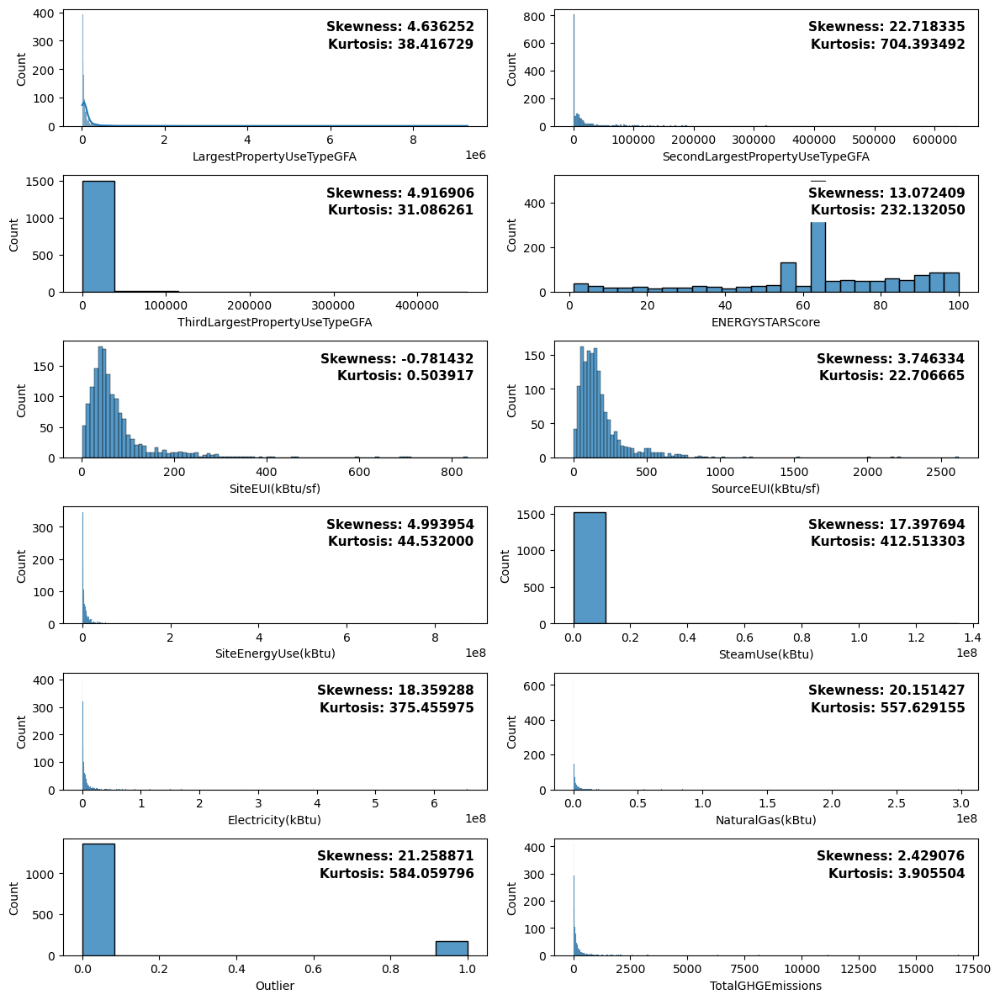

In [116]:
# Création d'un graphique afin d'observer la distribution des variables quantitatives
f, axes = plt.subplots(6, 2, figsize=(12, 12))

sns.histplot(df3_num.iloc[:,0], ax=axes[0,0],kde=True)
sns.histplot(df3_num.iloc[:,1], ax=axes[0,1])
sns.histplot(df3_num.iloc[:,2], ax=axes[1,0])
sns.histplot(df3_num.iloc[:,3], ax=axes[1,1])
sns.histplot(df3_num.iloc[:,4], ax=axes[2,0])
sns.histplot(df3_num.iloc[:,5], ax=axes[2,1])
sns.histplot(df3_num.iloc[:,6], ax=axes[3,0])
sns.histplot(df3_num.iloc[:,7], ax=axes[3,1])
sns.histplot(df3_num.iloc[:,8], ax=axes[4,0])
sns.histplot(df3_num.iloc[:,9], ax=axes[4,1])
sns.histplot(df3_num.iloc[:,10], ax=axes[5,0])
sns.histplot(df3_num.iloc[:,11], ax=axes[5,1])


for i, ax in enumerate(axes.reshape(-1),-1):
    ax.text(x=0.97, y=0.90, transform=ax.transAxes, s="Skewness: %f" % df3_num.iloc[:,i].skew(),\
        fontweight='demibold', fontsize=11, verticalalignment='top', horizontalalignment='right',\
        backgroundcolor='white')
    ax.text(x=0.97, y=0.70, transform=ax.transAxes, s="Kurtosis: %f" % df3_num.iloc[:,i].kurt(),\
        fontweight='demibold', fontsize=11, verticalalignment='center', horizontalalignment='right',\
        backgroundcolor='white')

plt.tight_layout()


Le coefficient d'asymétrie (Sk, skewness en anglais) évalue le défaut de symétrie d'une distribution:
* Il est **nul pour une distribution symétrique**. 
* Il est **positif pour une distribution étalée à droite**.
* Il est **négatif pour une distribution étalée à gauche.**  

Le coefficient d'aplatissement (K, kurtosis en anglais) évalue la dispersion des valeurs "extrêmes" par référence à la loi normale. 
* Il est **nul pour une distribution normale**
* Il est **négatif pour une distribution moins "aplatie" qu'une distribution normale** 
* Il est **positif sur une distribution plus aplatie qu'une distribution normale.**

<Figure size 400x400 with 0 Axes>

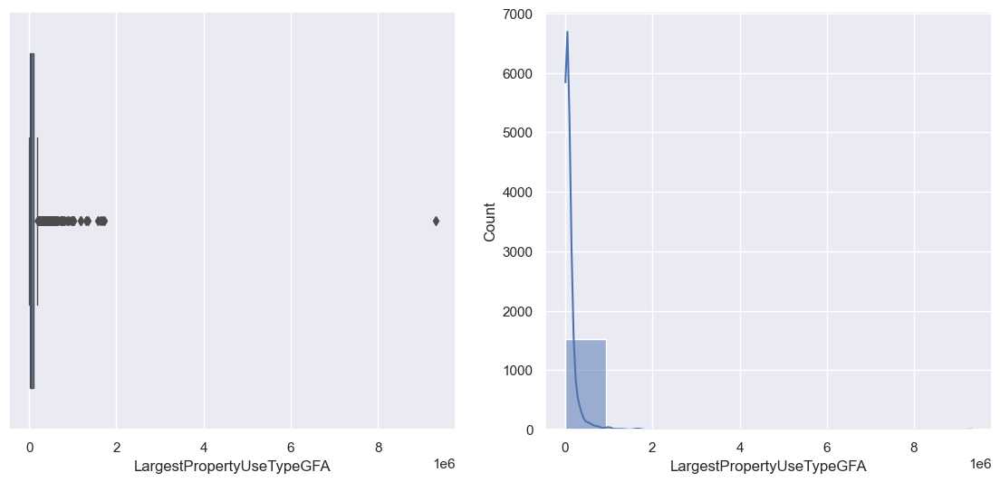

<Figure size 400x400 with 0 Axes>

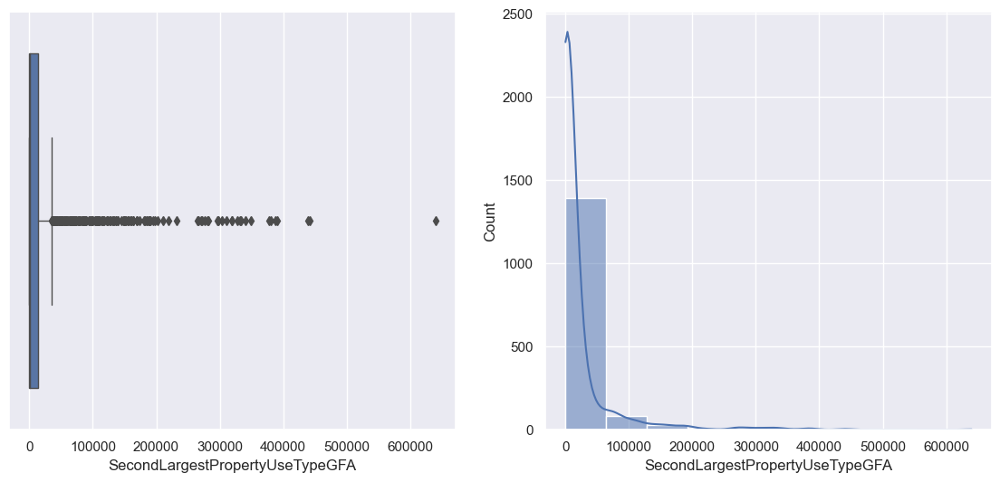

<Figure size 400x400 with 0 Axes>

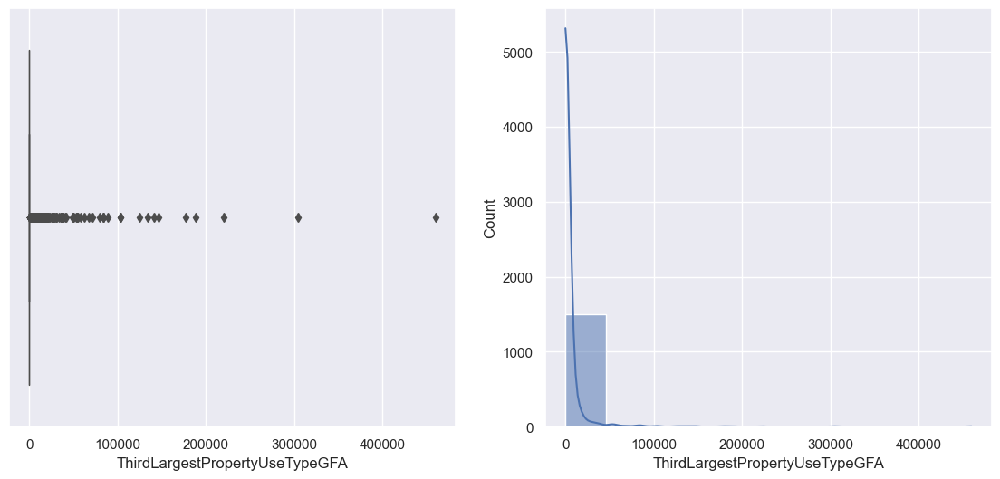

<Figure size 400x400 with 0 Axes>

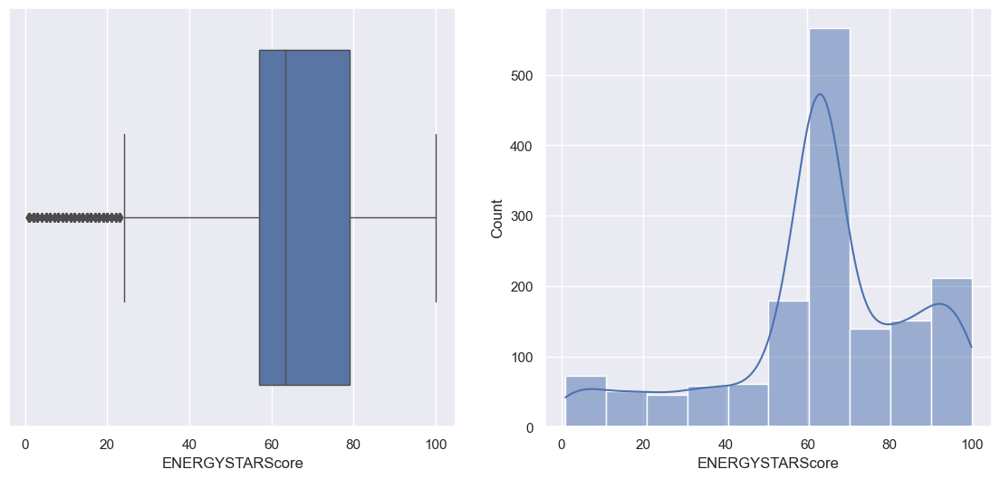

<Figure size 400x400 with 0 Axes>

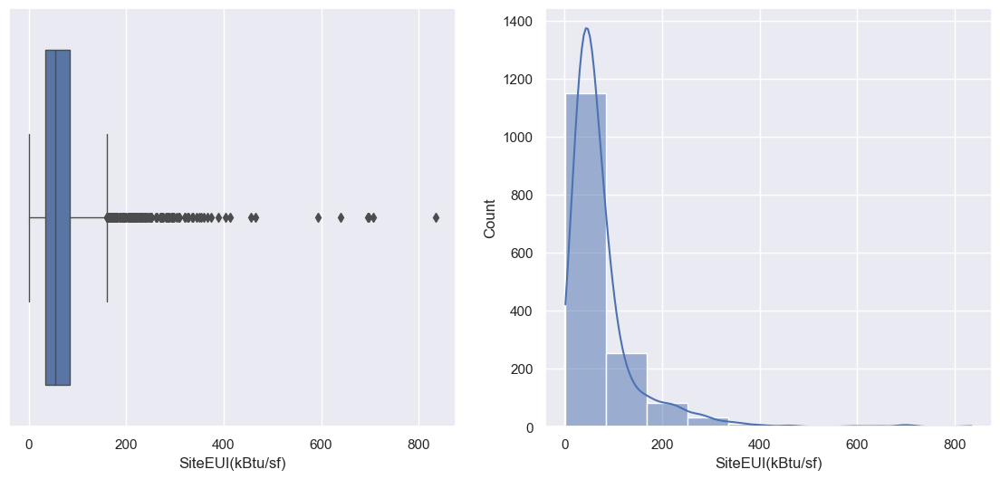

<Figure size 400x400 with 0 Axes>

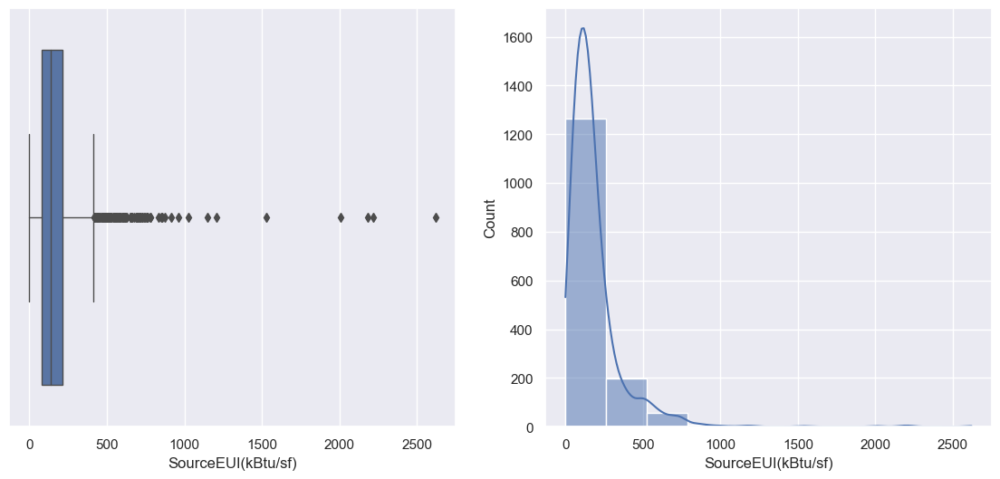

<Figure size 400x400 with 0 Axes>

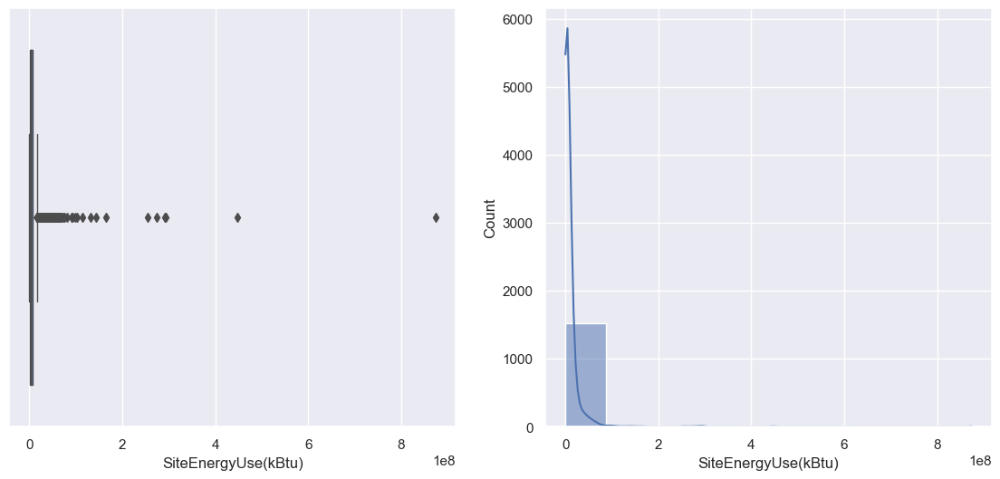

<Figure size 400x400 with 0 Axes>

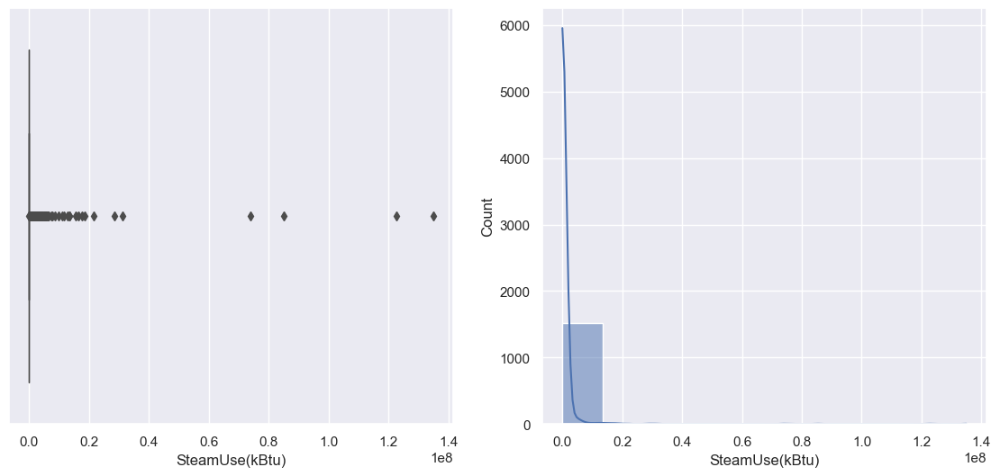

<Figure size 400x400 with 0 Axes>

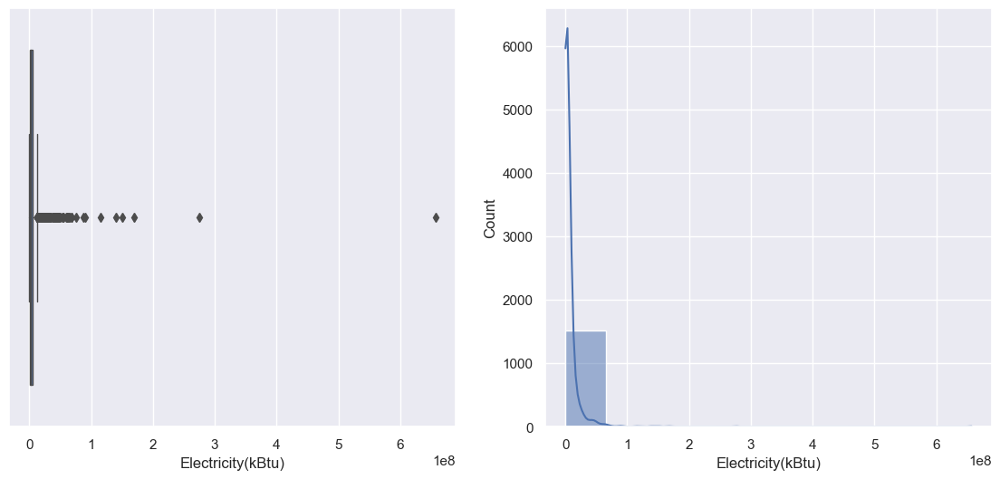

<Figure size 400x400 with 0 Axes>

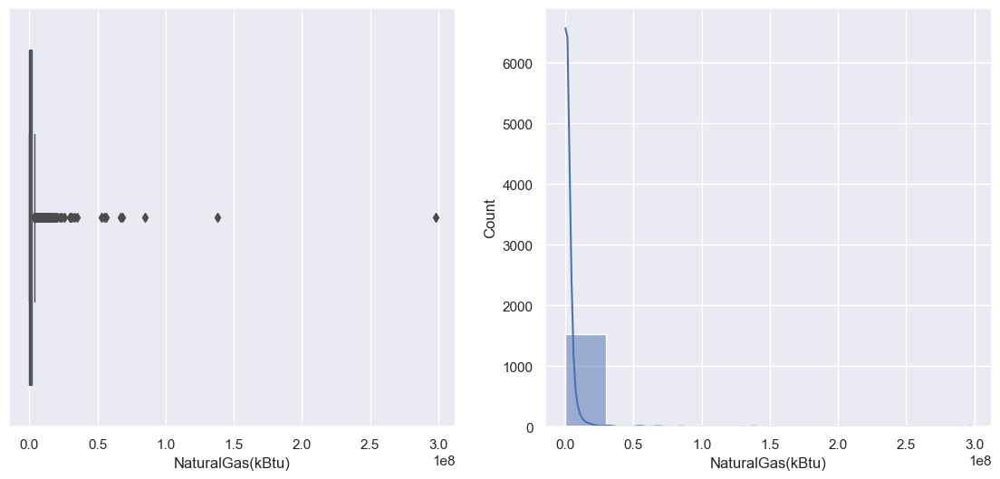

<Figure size 400x400 with 0 Axes>

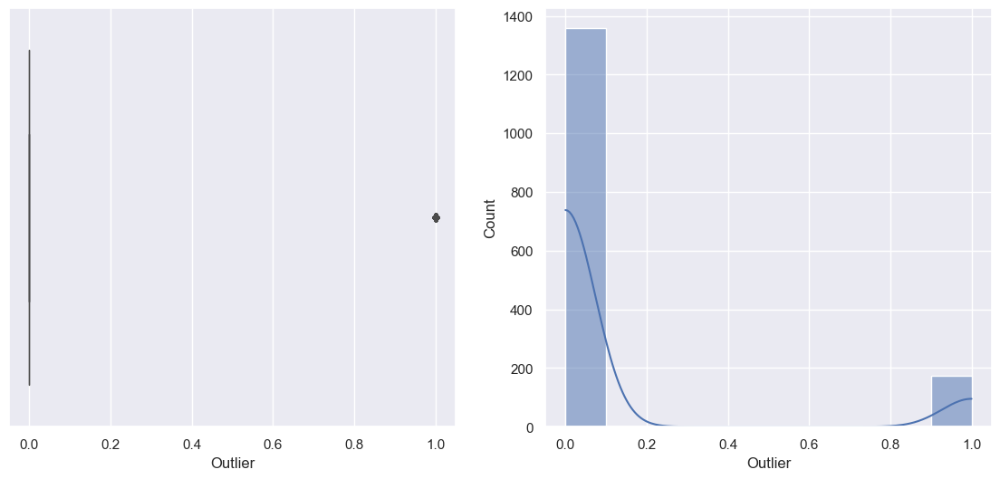

<Figure size 400x400 with 0 Axes>

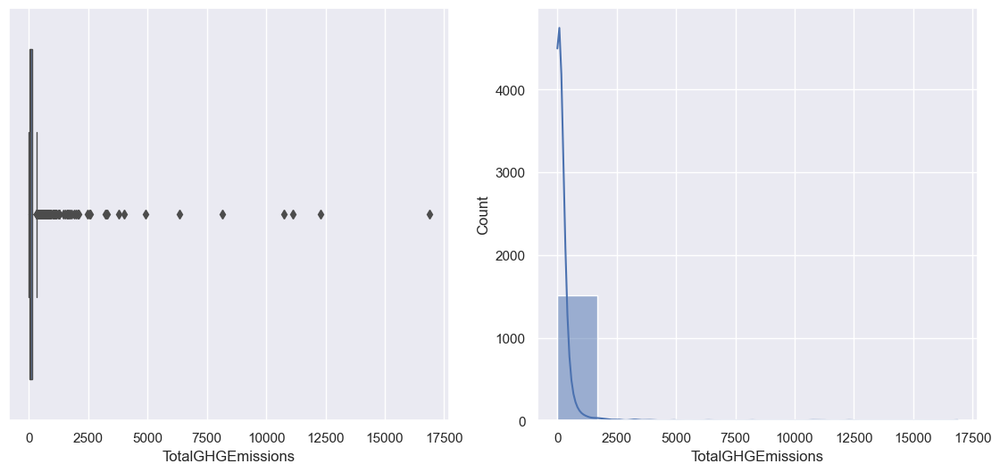

<Figure size 400x400 with 0 Axes>

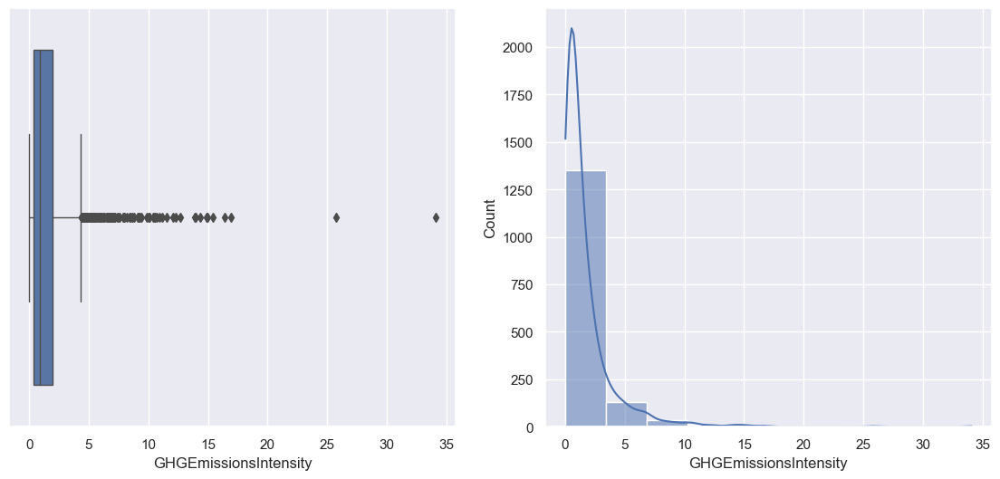

In [117]:
#df_graph = df3.select_dtypes('float')
for i in df3_num:
    plt.figure(figsize=(4,4))
    plt.tight_layout()
    sns.set(rc={"figure.figsize":(14, 6)})
    f, (ax_box, ax_hist) = plt.subplots(1,2, sharex=True)
    plt.gca().set(xlabel= i,ylabel='Count')
    sns.boxplot(x=df3_num[i], ax=ax_box ,data=df3_num, linewidth= 1.0)
    sns.histplot(x=df3_num[i], ax=ax_hist , bins = 10,kde=True)
    
    plt.show()

# Colonnes 'kBtu'

In [118]:
df3

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr
252,NonResidential,Large Office,DOWNTOWN,47.61734,-122.34434,1947,1,3,192630,48512,144118,"Office, Parking",Office,146157.0,Parking,48199.0,Sans,0.0,2007,94.000000,36.700001,112.400002,5.357833e+06,0.0,5169641.0,188191.0,0,46.03,0.24,POINT (-122.34434 47.61734),"(1925.0, 1950.0]"
554,NonResidential,Large Office,DOWNTOWN,47.61732,-122.34791,1975,1,8,150000,23630,126370,"Office, Parking",Office,126648.0,Parking,23913.0,Sans,0.0,2009,65.000000,73.800003,212.100006,9.343428e+06,0.0,8155743.0,1187684.0,0,119.93,0.80,POINT (-122.34791 47.61732),"(1950.0, 1975.0]"
428,NonResidential,Retail Store,NORTH,47.70759,-122.32550,1965,1,2,168619,0,168619,Retail Store,Retail Store,173106.0,Sans,0.0,Sans,0.0,2009,78.000000,37.299999,105.000000,6.455828e+06,0.0,5456882.0,998946.0,0,91.10,0.54,POINT (-122.32550 47.70759),"(1950.0, 1975.0]"
293,NonResidential,Large Office,DOWNTOWN,47.60967,-122.33229,1980,1,36,831198,36606,794592,"Office, Other, Parking",Office,748011.0,Parking,36606.0,Other,9975.0,2009,96.000000,35.200001,108.699997,2.668966e+07,0.0,26031451.0,658204.0,1,216.43,0.27,POINT (-122.33229 47.60967),"(1975.0, 2000.0]"
551,NonResidential,Large Office,MAGNOLIA / QUEEN ANNE,47.62225,-122.35915,2000,1,7,241875,84689,157186,"Office, Parking",Office,163082.0,Parking,83425.0,Sans,0.0,2009,88.000000,53.099998,164.500000,8.655604e+06,0.0,8488392.0,167210.0,0,68.06,0.28,POINT (-122.35915 47.62225),"(1975.0, 2000.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1620,NonResidential,Other,MAGNOLIA / QUEEN ANNE,47.65843,-122.38435,1957,1,2,20294,0,20294,"Office, Other",Other,18000.0,Office,2294.0,Sans,0.0,NaN,63.480533,85.500000,145.100006,1.735996e+06,0.0,536408.0,1199588.0,0,67.45,3.32,POINT (-122.38435 47.65843),"(1950.0, 1975.0]"
1621,NonResidential,Small- and Mid-Sized Office,MAGNOLIA / QUEEN ANNE,47.65708,-122.38383,1983,1,4,40571,10849,29722,Office,Office,24008.0,Sans,0.0,Sans,0.0,NaN,64.000000,53.599998,168.300003,1.286817e+06,0.0,1286817.0,0.0,0,8.97,0.22,POINT (-122.38383 47.65708),"(1975.0, 2000.0]"
1622,NonResidential,Small- and Mid-Sized Office,MAGNOLIA / QUEEN ANNE,47.65649,-122.38383,1983,1,4,41707,15659,26048,"Office, Parking",Office,41707.0,Parking,12000.0,Sans,0.0,NaN,78.000000,42.099998,132.199997,1.755788e+06,0.0,1755788.0,0.0,0,12.24,0.29,POINT (-122.38383 47.65649),"(1975.0, 2000.0]"
1567,NonResidential,Warehouse,MAGNOLIA / QUEEN ANNE,47.66238,-122.38831,1974,1,1,25600,0,25600,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,20600.0,Office,5000.0,Sans,0.0,NaN,1.000000,67.599998,173.000000,1.730601e+06,0.0,1249609.0,480992.0,0,34.26,1.34,POINT (-122.38831 47.66238),"(1950.0, 1975.0]"


In [119]:
energie = ['SteamUse(kBtu)', 'Electricity(kBtu)','NaturalGas(kBtu)']

In [120]:
for col in energie:
    df3.loc[df3[col]>0.0, col]= 1
    df3.loc[df3[col] <= 0.0, col]= 0

In [121]:
df3['Electricity(kBtu)'].value_counts()

1.0    1532
0.0       1
Name: Electricity(kBtu), dtype: int64

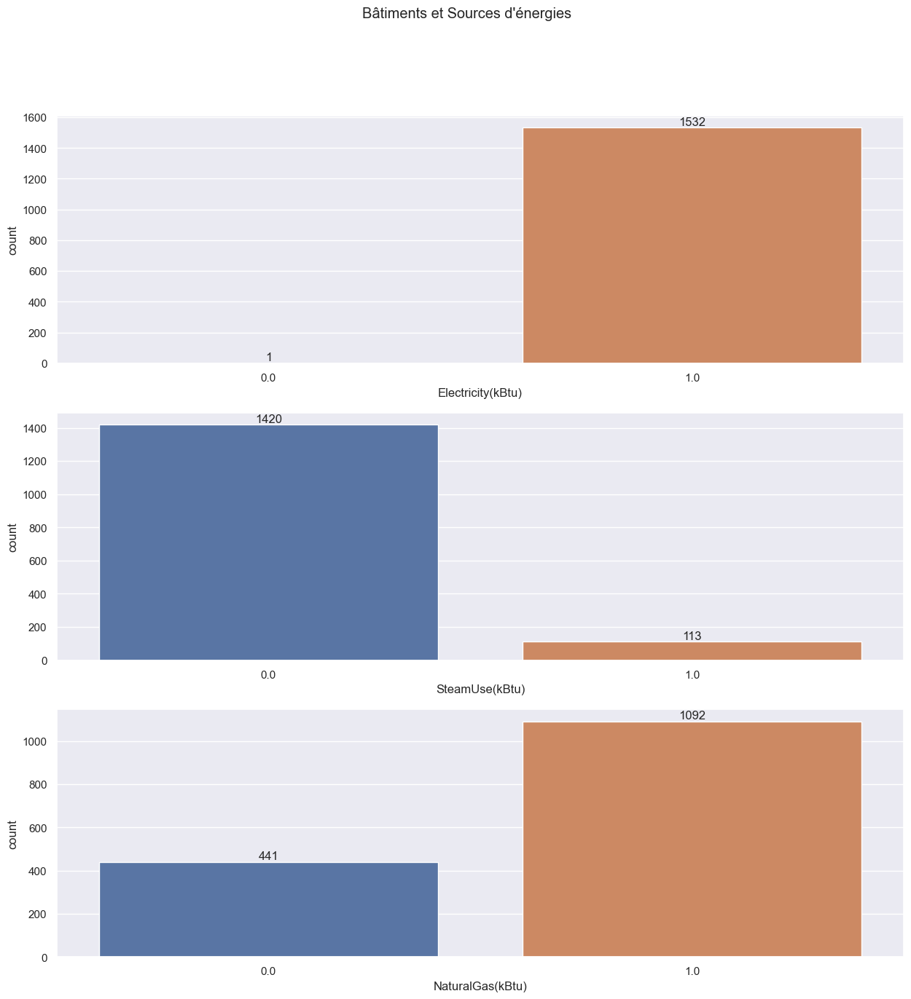

In [182]:
fig, axes = plt.subplots(3, 1,figsize=(15,15) )
plt.suptitle('Bâtiments et Sources d\'énergies')

ax5 = sns.countplot(ax=axes[0],x='Electricity(kBtu)', data=df3)
ax5.bar_label(ax5.containers[0])
ax6 = sns.countplot(ax=axes[1],x='SteamUse(kBtu)', data=df3)
ax6.bar_label(ax6.containers[0])
ax7 = sns.countplot(ax=axes[2],x='NaturalGas(kBtu)', data=df3)
ax7.bar_label(ax7.containers[0])

plt.show()

La majorité des bâtiments utilisent de l'électricité.

# Traitement et analyse des variables qualitatives

In [123]:
df3.select_dtypes('object').columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType',
       'YearsENERGYSTARCertified'],
      dtype='object')

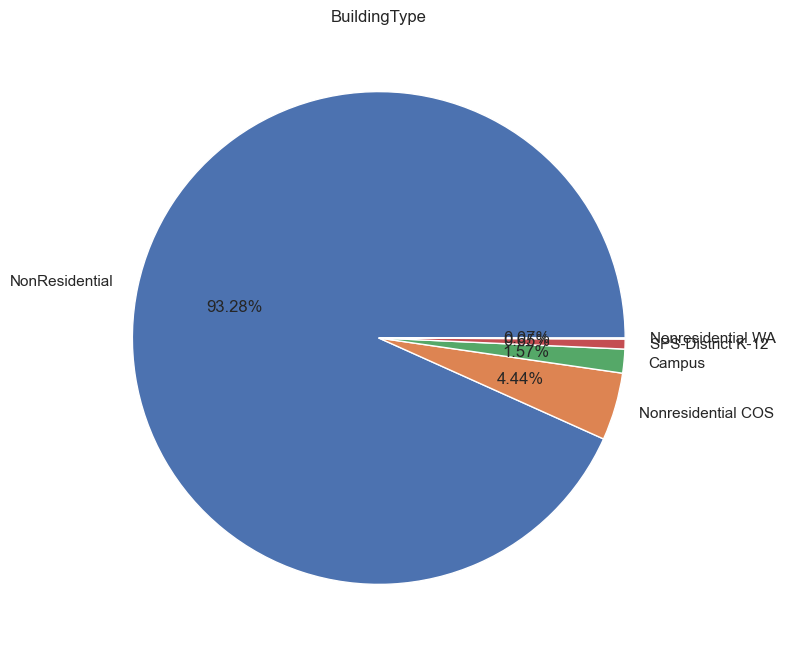

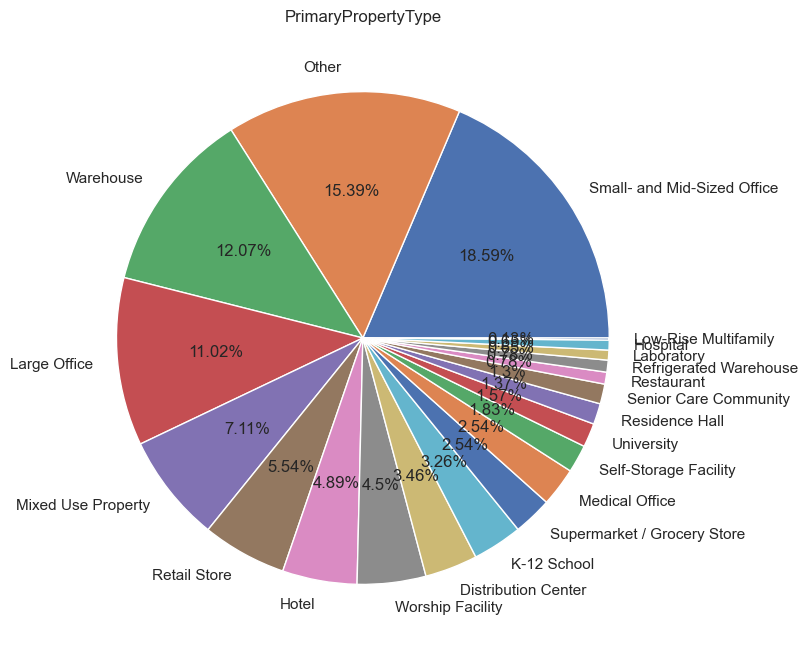

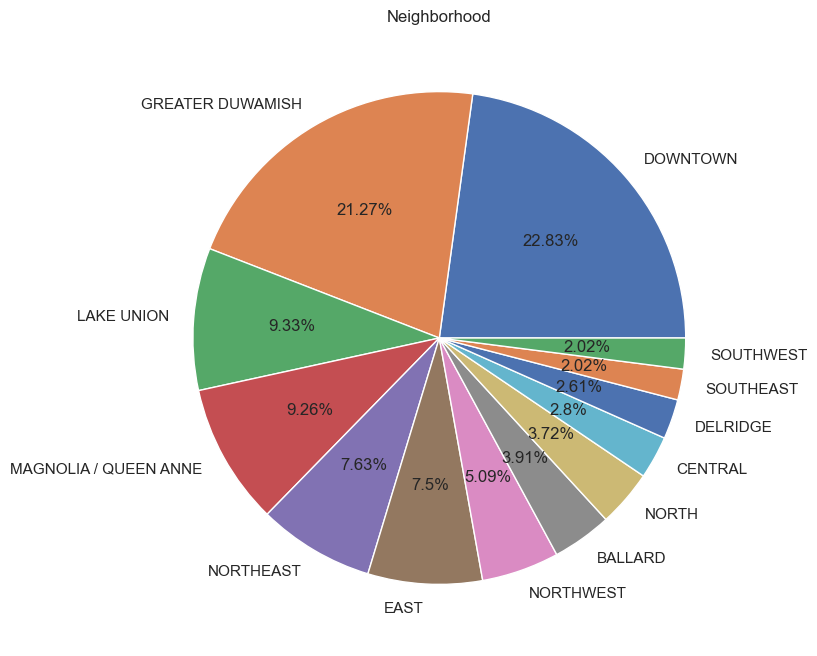

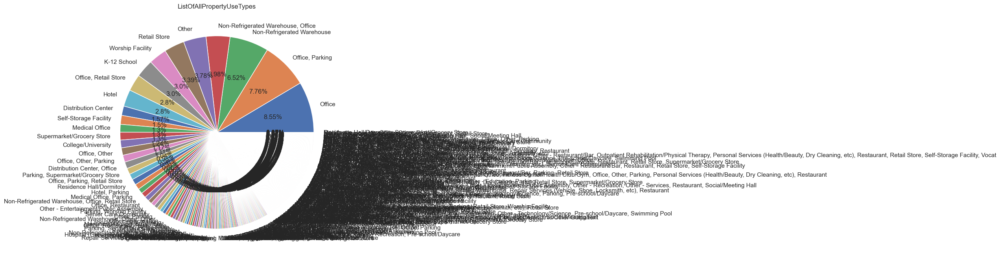

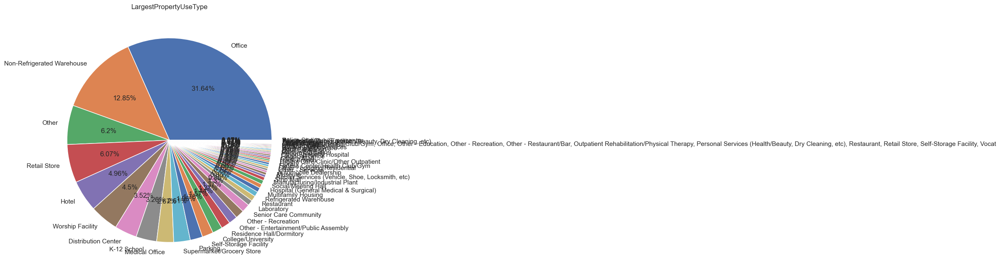

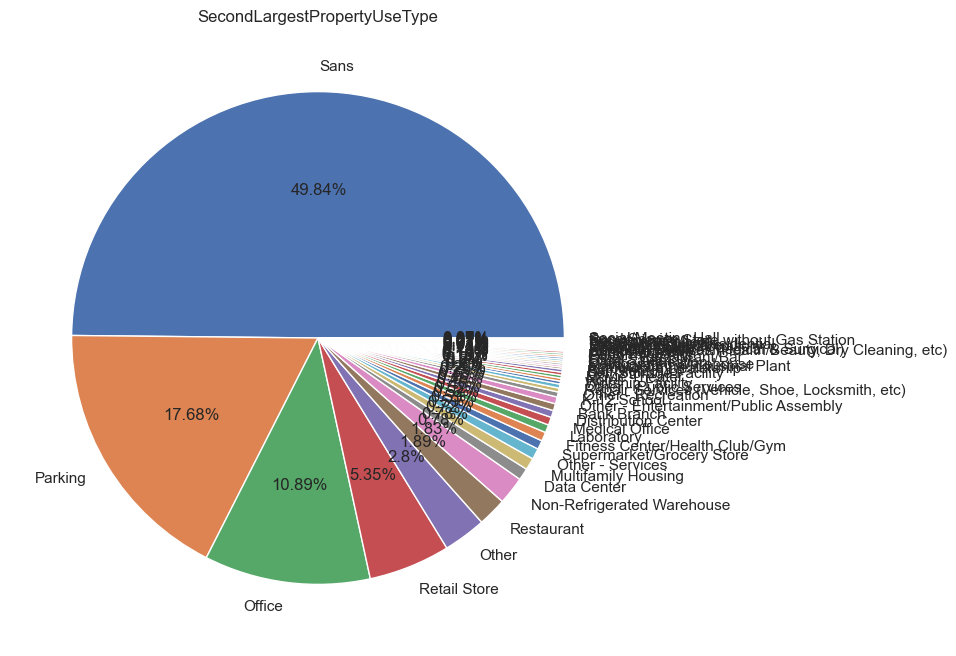

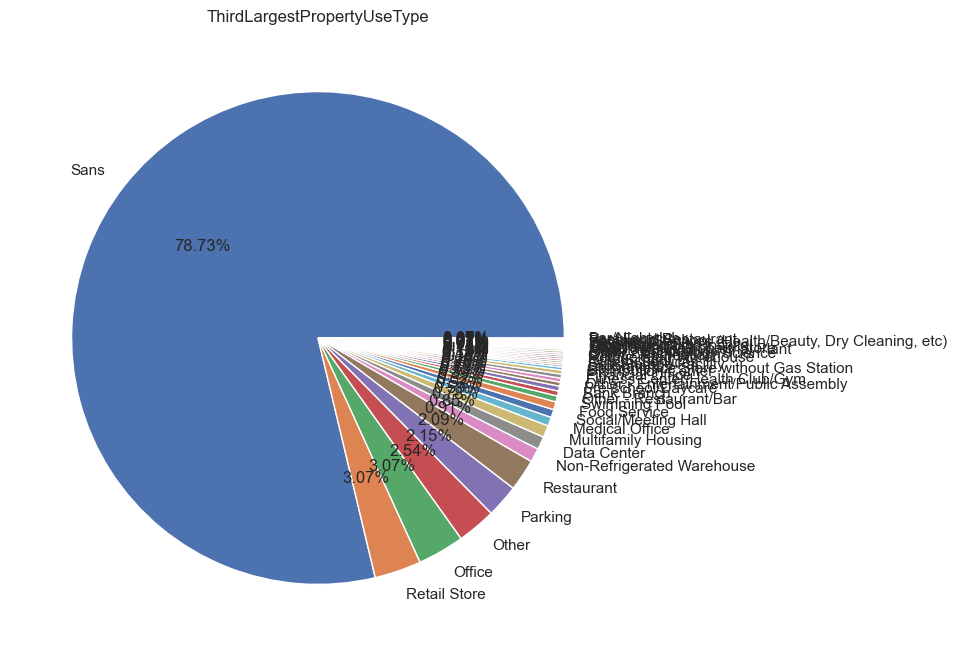

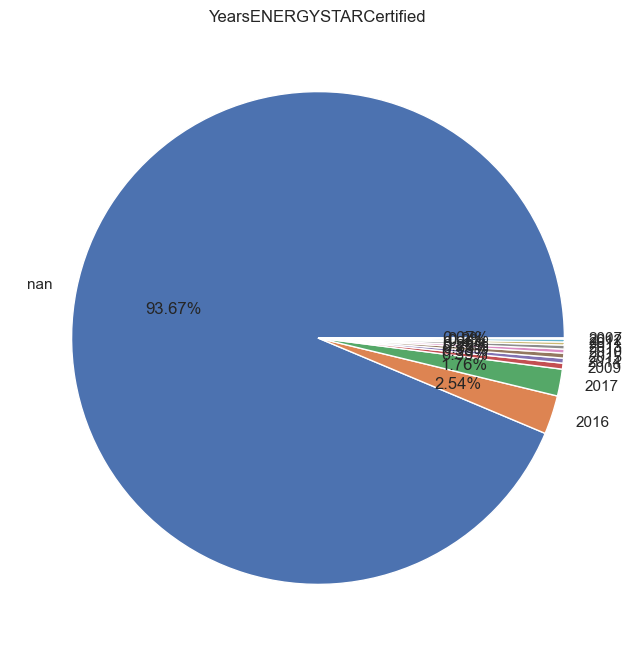

In [124]:
for col in df3.select_dtypes('object'):
    plt.figure(figsize=(8,8))
    df3[col].value_counts(dropna=False).plot.pie(autopct = lambda col: str(round(col, 2)) + '%' )
    plt.title(col, fontsize= 12)
    plt.ylabel(None)

**Je dois réduire le nombre de catégories des colonnes LargestPropertyUseType, SecondLargestPropertyUseType, ThirdLargestPropertyUseType** pour pouvoir les encoder par la suite

In [125]:
for col in df3[['LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']]:
    print(col)
    print(df3[col].nunique())
    print(df3[col].unique())
    print('-'*40)

LargestPropertyUseType
55
['Office' 'Retail Store' 'Medical Office' 'Worship Facility'
 'Supermarket/Grocery Store' 'Non-Refrigerated Warehouse' 'Hotel'
 'Data Center' 'K-12 School' 'Social/Meeting Hall'
 'Urgent Care/Clinic/Other Outpatient' 'Self-Storage Facility'
 'Restaurant' 'Laboratory' 'Other' 'Other - Entertainment/Public Assembly'
 'Other - Mall' 'Financial Office' 'Other - Restaurant/Bar'
 'Automobile Dealership' 'Senior Care Community'
 'Hospital (General Medical & Surgical)' 'Residence Hall/Dormitory'
 'Parking' 'Multifamily Housing' 'Other/Specialty Hospital' 'Bank Branch'
 'Police Station' 'Other - Education' 'Distribution Center'
 'College/University' 'Library' 'Fitness Center/Health Club/Gym' 'Museum'
 'Other - Lodging/Residential' 'Performing Arts' 'Courthouse'
 'Lifestyle Center' 'Other - Services' 'Other - Utility'
 'Other - Recreation' 'Strip Mall'
 'Fitness Center/Health Club/Gym, Office, Other - Education, Other - Recreation, Other - Restaurant/Bar, Outpatient Reh

https://energystar-mesa.force.com/PortfolioManager/s/topic/0TOt00000008fJIGAY/property-types


In [126]:
# Je vais créer un dictionnaire afin de pouvoir remplacer les types de bâtiments
dict_building = {
'Bank Branch':'BankingFinancialServices',
'Financial Office':'BankingFinancialServices',
    
'Adult Education':'Education',
'College/University':'Education',
'K-12 School':'Education',
'Pre-School/Daycare':'Education',
'Pre-school/Daycare': 'Education',
'Vocational School':'Education',
'Other - Education':'Education',
    
'Stadium':'EntertainmentPublicAssembly',
'Convention Center':'EntertainmentPublicAssembly',
'Recreation':'EntertainmentPublicAssembly',
'Fitness Center/Health Club/Gym':'EntertainmentPublicAssembly',
'Swimming Pool':'EntertainmentPublicAssembly',
'Other - Recreation':'EntertainmentPublicAssembly',
'Movie Theater':'EntertainmentPublicAssembly',
'Museum':'EntertainmentPublicAssembly',
'Performing Arts':'EntertainmentPublicAssembly',
'Social/Meeting Hall':'EntertainmentPublicAssembly',
'Bar/Nightclub':'EntertainmentPublicAssembly',
'Other - Entertainment/Public Assembly':'EntertainmentPublicAssembly',
    
    
'Restaurant/Bar':'FoodSalesService',
'Supermarket/Grocery Store':'FoodSalesService',
'Wholesale Club/Supercenter':'FoodSalesService',
'Food Sales':'FoodSalesService',
'Food Service':'FoodSalesService',
'Restaurant':'FoodSalesService',
'Other - Restaurant/Bar': 'FoodSalesService',
'Convenience Store without Gas Station':'FoodSalesService',
'Fast Food Restaurant':'FoodSalesService',
    
    
'Hospital':'Healthcare',
'Other/Specialty Hospital':'Healthcare',
'Medical Office':'Healthcare',
'Outpatient Rehabilitation/Physical Therapy':'Healthcare',
'Residential Care Facility':'Healthcare',
'Senior Living Community':'Healthcare',
'Senior Care Community':'Healthcare',
'Urgent Care/Clinic/Other Outpatient':'Healthcare',
'Other - Specialty Hospital':'Healthcare',
'Hospital (General Medical & Surgical)':'Healthcare',
    
'Barracks':'LodgingResidential',
'Hotel':'LodgingResidential',
'Multifamily Housing':'LodgingResidential',
'Residence Hall/Dormitory':'LodgingResidential',
'Senior Living Community':'LodgingResidential',
'Single Family Home':'LodgingResidential',
'Other - Lodging/Residential':'LodgingResidential',
    
'Other - Utility': 'Utility',
    
    
'Manufacturing/Industrial Plant':'ManufacturingIndustrial',
    
'Mixed Use Property':'MixedUse',
    
'Medical Office':'Office',
'Veterinary Office':'Office',
    
'Courthouse':'PublicServices',
'Drinking Water Treatment & Distribution':'PublicServices',
'Fire Station':'PublicServices',
'Library':'PublicServices',
'Mailing Center/Post Office':'PublicServices',
'Police Station':'PublicServices',
'Prison/Incarceration':'PublicServices',
'Social/Meeting Hall':'PublicServices',
'Transportation Terminal/Station':'PublicServices',
'Wastewater Treatment Plant':'PublicServices',
'Other - Public Services': 'PublicServices',
    
'Worship Facility':'ReligiousWorship',
    
'Automobile Dealership':'Retail',
'Mall':'Retail',
'Other - Mall':'Retail',
'Enclosed Mall':'Retail',
'Strip Mall':'Retail',
'Lifestyle Center':'Retail',
'Retail Store': 'Retail',
'Supermarket/Grocery Store':'Retail',
'Wholesale Club/Supercenter':'Retail',
    
'Data Center':'TechnologyScience',
'Laboratory':'TechnologyScience',
'Other - Technology/Science':'TechnologyScience',
    
'Personal Services (Health/Beauty, Dry Cleaning, etc)':'Services',
'Repair Services (Vehicle, Shoe, Locksmith, etc)':'Services',
'Other - Services':'Services',
    
'Self-Storage Facility':'WarehouseStorage',
'Warehouse/Distribution Center':'WarehouseStorage',
'Distribution Center':'WarehouseStorage',
'Non-Refrigerated Warehouse':'WarehouseStorage',
'Refrigerated Warehouse':'WarehouseStorage'
    

                            }

In [127]:
# Je remplace les valeurs en utilisant le dictionnaire
for column in df3[['PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']]:
    df3[column] = df3[column].replace(dict_building)

In [128]:
df3.head()

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr
252,NonResidential,Large Office,DOWNTOWN,47.61734,-122.34434,1947,1,3,192630,48512,144118,"Office, Parking",Office,146157.0,Parking,48199.0,Sans,0.0,2007,94.0,36.700001,112.400002,5357833.0,0.0,1.0,1.0,0,46.03,0.24,POINT (-122.34434 47.61734),"(1925.0, 1950.0]"
554,NonResidential,Large Office,DOWNTOWN,47.61732,-122.34791,1975,1,8,150000,23630,126370,"Office, Parking",Office,126648.0,Parking,23913.0,Sans,0.0,2009,65.0,73.800003,212.100006,9343428.0,0.0,1.0,1.0,0,119.93,0.80,POINT (-122.34791 47.61732),"(1950.0, 1975.0]"
428,NonResidential,Retail,NORTH,47.70759,-122.32550,1965,1,2,168619,0,168619,Retail Store,Retail,173106.0,Sans,0.0,Sans,0.0,2009,78.0,37.299999,105.000000,6455828.5,0.0,1.0,1.0,0,91.10,0.54,POINT (-122.32550 47.70759),"(1950.0, 1975.0]"
293,NonResidential,Large Office,DOWNTOWN,47.60967,-122.33229,1980,1,36,831198,36606,794592,"Office, Other, Parking",Office,748011.0,Parking,36606.0,Other,9975.0,2009,96.0,35.200001,108.699997,26689658.0,0.0,1.0,1.0,1,216.43,0.27,POINT (-122.33229 47.60967),"(1975.0, 2000.0]"
551,NonResidential,Large Office,MAGNOLIA / QUEEN ANNE,47.62225,-122.35915,2000,1,7,241875,84689,157186,"Office, Parking",Office,163082.0,Parking,83425.0,Sans,0.0,2009,88.0,53.099998,164.500000,8655604.0,0.0,1.0,1.0,0,68.06,0.28,POINT (-122.35915 47.62225),"(1975.0, 2000.0]"


J'ai réduit le nombre de catégories de bâtiments mais il en reste encore beaucoup.
Pour les réduire davantages, j'ai sélectionné les 10 types de bâtiments les plus fréquents dans mon fichier et grouper les autres dans une catégorie 'Autres'.

In [129]:
for col in df3[['PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']] :
    print(col)
    df_test = pd.DataFrame({"nombre":{}, "fréquences":{} })
    
    df_test['nombre'] = df3[col].value_counts(ascending=False)
    df_test['fréquences'] = df3[col].value_counts(normalize=True,ascending=False)
    print(df_test)
    

PrimaryPropertyType
                             nombre  fréquences
Small- and Mid-Sized Office     285    0.185910
Other                           236    0.153947
Warehouse                       185    0.120678
Large Office                    169    0.110241
MixedUse                        109    0.071102
WarehouseStorage                 93    0.060665
Retail                           85    0.055447
LodgingResidential               75    0.048924
ReligiousWorship                 69    0.045010
Education                        50    0.032616
Supermarket / Grocery Store      39    0.025440
Office                           39    0.025440
Healthcare                       30    0.019569
University                       24    0.015656
Residence Hall                   21    0.013699
FoodSalesService                 12    0.007828
TechnologyScience                10    0.006523
Low-Rise Multifamily              2    0.001305
LargestPropertyUseType
                                             

In [130]:
#Colonne Primary
counts = df3['PrimaryPropertyType'].value_counts()
idx = counts[counts < 50].index
df3.loc[df3['PrimaryPropertyType'].isin(idx), 'PrimaryPropertyType'] = "Autres"

# Colonne Largest
counts = df3['LargestPropertyUseType'].value_counts()
idx = counts[counts < 30].index
df3.loc[df3['LargestPropertyUseType'].isin(idx), 'LargestPropertyUseType'] = "Autres"

# Colonne Second
counts = df3['SecondLargestPropertyUseType'].value_counts()
idx = counts[counts < 17].index
df3.loc[df3['SecondLargestPropertyUseType'].isin(idx), 'SecondLargestPropertyUseType'] = "Autres"

# Colonne Third
counts = df3['ThirdLargestPropertyUseType'].value_counts()
idx = counts[counts < 13].index
df3.loc[df3['ThirdLargestPropertyUseType'].isin(idx), 'ThirdLargestPropertyUseType'] = "Autres"


In [131]:
df3.head()

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr
252,NonResidential,Large Office,DOWNTOWN,47.61734,-122.34434,1947,1,3,192630,48512,144118,"Office, Parking",Office,146157.0,Parking,48199.0,Sans,0.0,2007,94.0,36.700001,112.400002,5357833.0,0.0,1.0,1.0,0,46.03,0.24,POINT (-122.34434 47.61734),"(1925.0, 1950.0]"
554,NonResidential,Large Office,DOWNTOWN,47.61732,-122.34791,1975,1,8,150000,23630,126370,"Office, Parking",Office,126648.0,Parking,23913.0,Sans,0.0,2009,65.0,73.800003,212.100006,9343428.0,0.0,1.0,1.0,0,119.93,0.80,POINT (-122.34791 47.61732),"(1950.0, 1975.0]"
428,NonResidential,Retail,NORTH,47.70759,-122.32550,1965,1,2,168619,0,168619,Retail Store,Retail,173106.0,Sans,0.0,Sans,0.0,2009,78.0,37.299999,105.000000,6455828.5,0.0,1.0,1.0,0,91.10,0.54,POINT (-122.32550 47.70759),"(1950.0, 1975.0]"
293,NonResidential,Large Office,DOWNTOWN,47.60967,-122.33229,1980,1,36,831198,36606,794592,"Office, Other, Parking",Office,748011.0,Parking,36606.0,Other,9975.0,2009,96.0,35.200001,108.699997,26689658.0,0.0,1.0,1.0,1,216.43,0.27,POINT (-122.33229 47.60967),"(1975.0, 2000.0]"
551,NonResidential,Large Office,MAGNOLIA / QUEEN ANNE,47.62225,-122.35915,2000,1,7,241875,84689,157186,"Office, Parking",Office,163082.0,Parking,83425.0,Sans,0.0,2009,88.0,53.099998,164.500000,8655604.0,0.0,1.0,1.0,0,68.06,0.28,POINT (-122.35915 47.62225),"(1975.0, 2000.0]"


In [132]:
df3['LargestPropertyUseType'].nunique()

11

In [133]:
df3['SecondLargestPropertyUseType'].nunique()

11

In [134]:
df3['ThirdLargestPropertyUseType'].nunique()

11

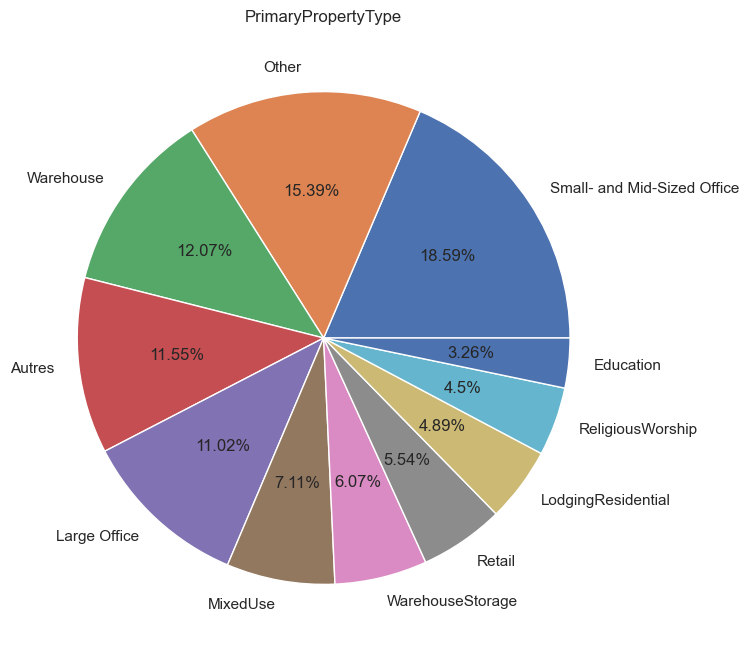

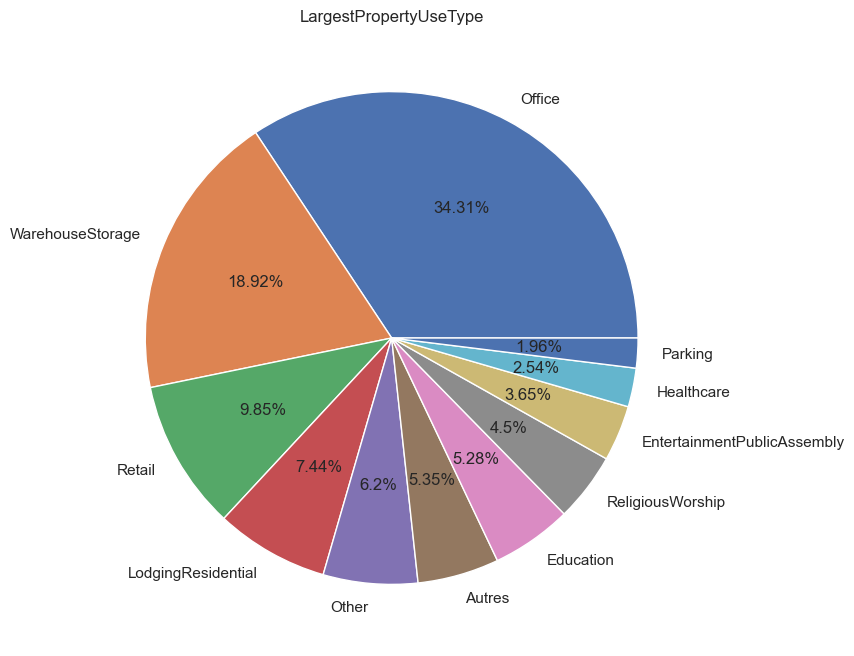

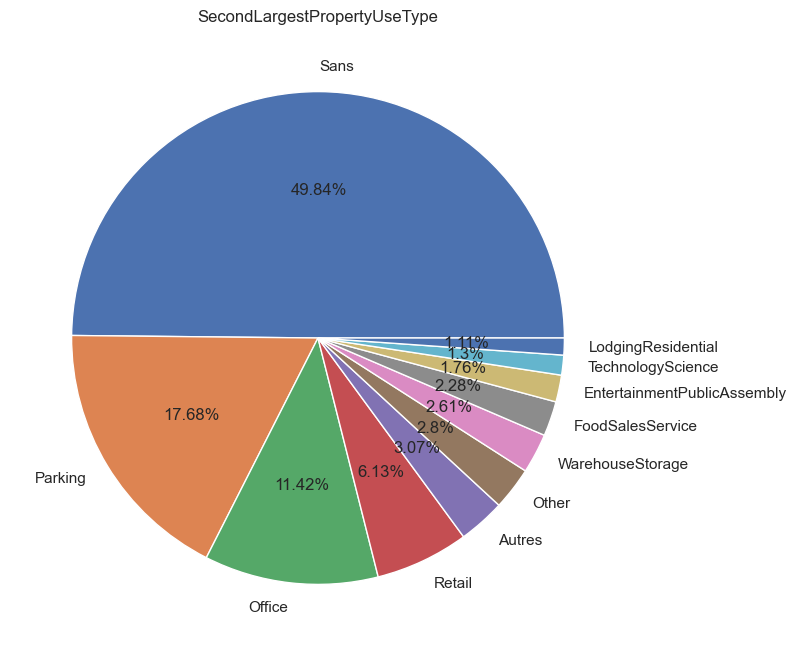

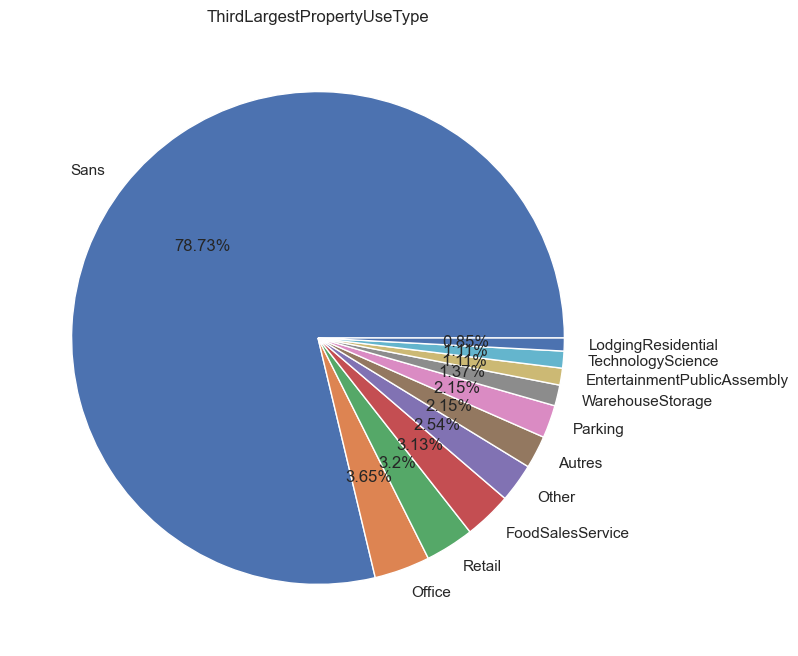

In [135]:
for col in df3[['PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']] :
    plt.figure(figsize=(8,8))
    df3[col].value_counts(dropna=False).plot.pie(autopct = lambda col: str(round(col, 2)) + '%' )
    plt.title(col, fontsize= 12)
    plt.ylabel(None)

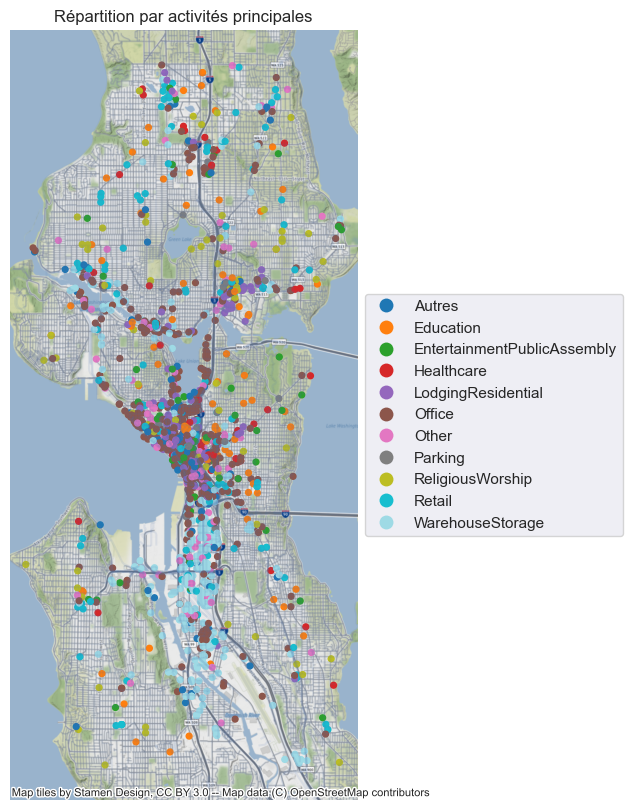

In [136]:
# Affichage des codes postaux et des quartiers de seattle
fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# Affichage de la carte avec les codes postaux
df3.plot(ax=ax1, column = 'LargestPropertyUseType',categorical=True,cmap='tab20',legend=True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},marker = '.', markersize=70,) 
plt.axis('off')
ctx.add_basemap(ax=ax1, crs=df_geo.crs.to_string())
carte.plot(ax=ax1, alpha = .1)
ax.grid(False)
plt.title('Répartition par activités principales')
plt.show()

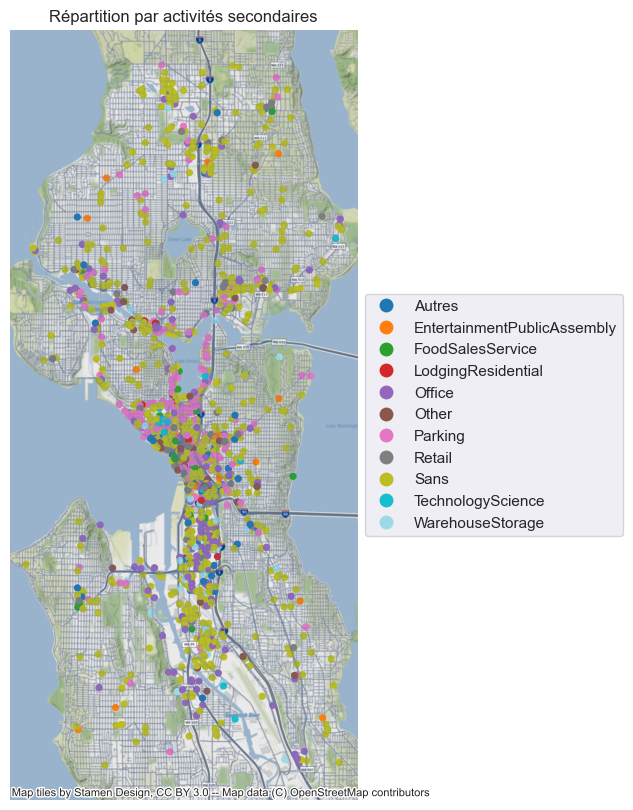

In [137]:
# Affichage des codes postaux et des quartiers de seattle
fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# Affichage de la carte avec les codes postaux
df3.plot(ax=ax1, column = 'SecondLargestPropertyUseType',categorical=True,cmap='tab20',legend=True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},marker = '.', markersize=70,) 
plt.axis('off')
ctx.add_basemap(ax=ax1, crs=df_geo.crs.to_string())
carte.plot(ax=ax1, alpha = .1)
ax.grid(False)
plt.title('Répartition par activités secondaires')
plt.show()

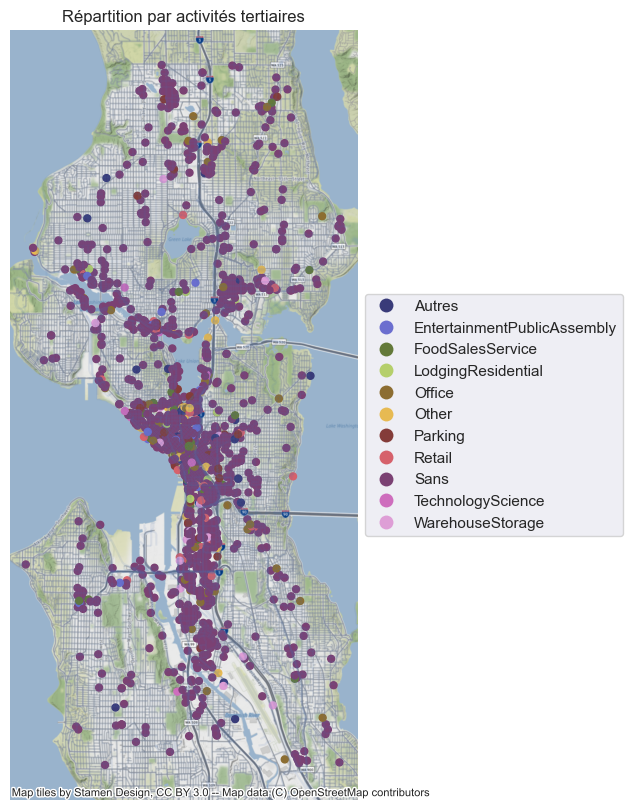

In [138]:
# Affichage des codes postaux et des quartiers de seattle
fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# Affichage de la carte avec les codes postaux
df3.plot(ax=ax1, column = 'ThirdLargestPropertyUseType',categorical=True,cmap='tab20b',legend=True,legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},marker = '.', markersize=100) 
plt.axis('off')
ctx.add_basemap(ax=ax1, crs=df_geo.crs.to_string())
carte.plot(ax=ax1, alpha = .1)
ax.grid(False)
plt.title('Répartition par activités tertiaires')
plt.show()

Maintenant que j'ai réduit mes catégories, je vais modifier mon df afin d'avoir en colonne chaque catagorie dans laquelle sera indiquée la surface GFA.

In [139]:
# Je sélectionne les valeurs contenus dans mes colonnes Usetype
surface = df3[["LargestPropertyUseType", "SecondLargestPropertyUseType", "ThirdLargestPropertyUseType"]].values;

# Je crée une colonne contenant toutes les valeurs des mes colonnes
surface = list(set(surface.reshape((-1,))))
surface = sorted([x for x in surface if pd.notnull(x)])
surface


['Autres',
 'Education',
 'EntertainmentPublicAssembly',
 'FoodSalesService',
 'Healthcare',
 'LodgingResidential',
 'Office',
 'Other',
 'Parking',
 'ReligiousWorship',
 'Retail',
 'Sans',
 'TechnologyScience',
 'WarehouseStorage']

In [140]:
for column in surface :
    df3[column] = 0

# remplissage des colonnes :
for i in range(0, len(df3)) :
    if pd.notnull(df3["LargestPropertyUseTypeGFA"].iloc[i]):
        df3[df3["LargestPropertyUseType"].iloc[i]].iloc[i] += df3["LargestPropertyUseTypeGFA"].iloc[i]
    if pd.notnull(df3["SecondLargestPropertyUseTypeGFA"].iloc[i]):
        df3[df3["SecondLargestPropertyUseType"].iloc[i]].iloc[i] += df3["SecondLargestPropertyUseTypeGFA"].iloc[i]
    if pd.notnull(df3["ThirdLargestPropertyUseType"].iloc[i]):
        df3[df3["ThirdLargestPropertyUseType"].iloc[i]].iloc[i] += df3["ThirdLargestPropertyUseTypeGFA"].iloc[i]
df3.head()

C:\Users\sarah\AppData\Local\Temp\ipykernel_1596\2167593715.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[df3["LargestPropertyUseType"].iloc[i]].iloc[i] += df3["LargestPropertyUseTypeGFA"].iloc[i]
C:\Users\sarah\AppData\Local\Temp\ipykernel_1596\2167593715.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[df3["SecondLargestPropertyUseType"].iloc[i]].iloc[i] += df3["SecondLargestPropertyUseTypeGFA"].iloc[i]
C:\Users\sarah\AppData\Local\Temp\ipykernel_1596\2167593715.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: htt

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr,Autres,Education,EntertainmentPublicAssembly,FoodSalesService,Healthcare,LodgingResidential,Office,Other,Parking,ReligiousWorship,Retail,Sans,TechnologyScience,WarehouseStorage
252,NonResidential,Large Office,DOWNTOWN,47.61734,-122.34434,1947,1,3,192630,48512,144118,"Office, Parking",Office,146157.0,Parking,48199.0,Sans,0.0,2007,94.0,36.700001,112.400002,5357833.0,0.0,1.0,1.0,0,46.03,0.24,POINT (-122.34434 47.61734),"(1925.0, 1950.0]",0,0,0,0.0,0,0,146157.0,0,48199.0,0,0.0,0,0,0
554,NonResidential,Large Office,DOWNTOWN,47.61732,-122.34791,1975,1,8,150000,23630,126370,"Office, Parking",Office,126648.0,Parking,23913.0,Sans,0.0,2009,65.0,73.800003,212.100006,9343428.0,0.0,1.0,1.0,0,119.93,0.80,POINT (-122.34791 47.61732),"(1950.0, 1975.0]",0,0,0,0.0,0,0,126648.0,0,23913.0,0,0.0,0,0,0
428,NonResidential,Retail,NORTH,47.70759,-122.32550,1965,1,2,168619,0,168619,Retail Store,Retail,173106.0,Sans,0.0,Sans,0.0,2009,78.0,37.299999,105.000000,6455828.5,0.0,1.0,1.0,0,91.10,0.54,POINT (-122.32550 47.70759),"(1950.0, 1975.0]",0,0,0,0.0,0,0,0.0,0,0.0,0,173106.0,0,0,0
293,NonResidential,Large Office,DOWNTOWN,47.60967,-122.33229,1980,1,36,831198,36606,794592,"Office, Other, Parking",Office,748011.0,Parking,36606.0,Other,9975.0,2009,96.0,35.200001,108.699997,26689658.0,0.0,1.0,1.0,1,216.43,0.27,POINT (-122.33229 47.60967),"(1975.0, 2000.0]",0,0,0,0.0,0,0,748011.0,9975,36606.0,0,0.0,0,0,0
551,NonResidential,Large Office,MAGNOLIA / QUEEN ANNE,47.62225,-122.35915,2000,1,7,241875,84689,157186,"Office, Parking",Office,163082.0,Parking,83425.0,Sans,0.0,2009,88.0,53.099998,164.500000,8655604.0,0.0,1.0,1.0,0,68.06,0.28,POINT (-122.35915 47.62225),"(1975.0, 2000.0]",0,0,0,0.0,0,0,163082.0,0,83425.0,0,0.0,0,0,0


# Analyse bivariée

Je dois réaliser deux prédictions :  
* prédiction de la consommation d'énergie
* prédiction de la consommation de CO2  

# Consommation d'énergie

In [141]:
df3

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr,Autres,Education,EntertainmentPublicAssembly,FoodSalesService,Healthcare,LodgingResidential,Office,Other,Parking,ReligiousWorship,Retail,Sans,TechnologyScience,WarehouseStorage
252,NonResidential,Large Office,DOWNTOWN,47.61734,-122.34434,1947,1,3,192630,48512,144118,"Office, Parking",Office,146157.0,Parking,48199.0,Sans,0.0,2007,94.000000,36.700001,112.400002,5.357833e+06,0.0,1.0,1.0,0,46.03,0.24,POINT (-122.34434 47.61734),"(1925.0, 1950.0]",0,0,0,0.0,0,0,146157.0,0,48199.0,0,0.0,0,0,0
554,NonResidential,Large Office,DOWNTOWN,47.61732,-122.34791,1975,1,8,150000,23630,126370,"Office, Parking",Office,126648.0,Parking,23913.0,Sans,0.0,2009,65.000000,73.800003,212.100006,9.343428e+06,0.0,1.0,1.0,0,119.93,0.80,POINT (-122.34791 47.61732),"(1950.0, 1975.0]",0,0,0,0.0,0,0,126648.0,0,23913.0,0,0.0,0,0,0
428,NonResidential,Retail,NORTH,47.70759,-122.32550,1965,1,2,168619,0,168619,Retail Store,Retail,173106.0,Sans,0.0,Sans,0.0,2009,78.000000,37.299999,105.000000,6.455828e+06,0.0,1.0,1.0,0,91.10,0.54,POINT (-122.32550 47.70759),"(1950.0, 1975.0]",0,0,0,0.0,0,0,0.0,0,0.0,0,173106.0,0,0,0
293,NonResidential,Large Office,DOWNTOWN,47.60967,-122.33229,1980,1,36,831198,36606,794592,"Office, Other, Parking",Office,748011.0,Parking,36606.0,Other,9975.0,2009,96.000000,35.200001,108.699997,2.668966e+07,0.0,1.0,1.0,1,216.43,0.27,POINT (-122.33229 47.60967),"(1975.0, 2000.0]",0,0,0,0.0,0,0,748011.0,9975,36606.0,0,0.0,0,0,0
551,NonResidential,Large Office,MAGNOLIA / QUEEN ANNE,47.62225,-122.35915,2000,1,7,241875,84689,157186,"Office, Parking",Office,163082.0,Parking,83425.0,Sans,0.0,2009,88.000000,53.099998,164.500000,8.655604e+06,0.0,1.0,1.0,0,68.06,0.28,POINT (-122.35915 47.62225),"(1975.0, 2000.0]",0,0,0,0.0,0,0,163082.0,0,83425.0,0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1620,NonResidential,Other,MAGNOLIA / QUEEN ANNE,47.65843,-122.38435,1957,1,2,20294,0,20294,"Office, Other",Other,18000.0,Office,2294.0,Sans,0.0,NaN,63.480533,85.500000,145.100006,1.735996e+06,0.0,1.0,1.0,0,67.45,3.32,POINT (-122.38435 47.65843),"(1950.0, 1975.0]",0,0,0,0.0,0,0,2294.0,18000,0.0,0,0.0,0,0,0
1621,NonResidential,Small- and Mid-Sized Office,MAGNOLIA / QUEEN ANNE,47.65708,-122.38383,1983,1,4,40571,10849,29722,Office,Office,24008.0,Sans,0.0,Sans,0.0,NaN,64.000000,53.599998,168.300003,1.286817e+06,0.0,1.0,0.0,0,8.97,0.22,POINT (-122.38383 47.65708),"(1975.0, 2000.0]",0,0,0,0.0,0,0,24008.0,0,0.0,0,0.0,0,0,0
1622,NonResidential,Small- and Mid-Sized Office,MAGNOLIA / QUEEN ANNE,47.65649,-122.38383,1983,1,4,41707,15659,26048,"Office, Parking",Office,41707.0,Parking,12000.0,Sans,0.0,NaN,78.000000,42.099998,132.199997,1.755788e+06,0.0,1.0,0.0,0,12.24,0.29,POINT (-122.38383 47.65649),"(1975.0, 2000.0]",0,0,0,0.0,0,0,41707.0,0,12000.0,0,0.0,0,0,0
1567,NonResidential,Warehouse,MAGNOLIA / QUEEN ANNE,47.66238,-122.38831,1974,1,1,25600,0,25600,"Non-Refrigerated Warehouse, Office",WarehouseStorage,20600.0,Office,5000.0,Sans,0.0,NaN,1.000000,67.599998,173.000000,1.730601e+06,0.0,1.0,1.0,0,34.26,1.34,POINT (-122.38831 47.66238),"(1950.0, 1975.0]",0,0,0,0.0,0,0,5000.0,0,0.0,0,0.0,0,0,20600


In [142]:
df3.columns

Index(['BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)', 'Electricity(kBtu)',
       'NaturalGas(kBtu)', 'Outlier', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'geometry', 'year_discr', 'Autres',
       'Education', 'EntertainmentPublicAssembly', 'FoodSalesService',
       'Healthcare', 'LodgingResidential', 'Office', 'Other', 'Parking',
       'ReligiousWorship', 'Retail', 'Sans', 'TechnologyScience',
       'WarehouseStorage'],
     

In [143]:
df3_corr = round(df3[['Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)', 'Electricity(kBtu)',
       'NaturalGas(kBtu)', 'Outlier', 'TotalGHGEmissions',
       'GHGEmissionsIntensity']].corr(),2)

C:\Users\sarah\AppData\Local\Temp\ipykernel_1596\1998891912.py:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  'GHGEmissionsIntensity']].corr(),2)


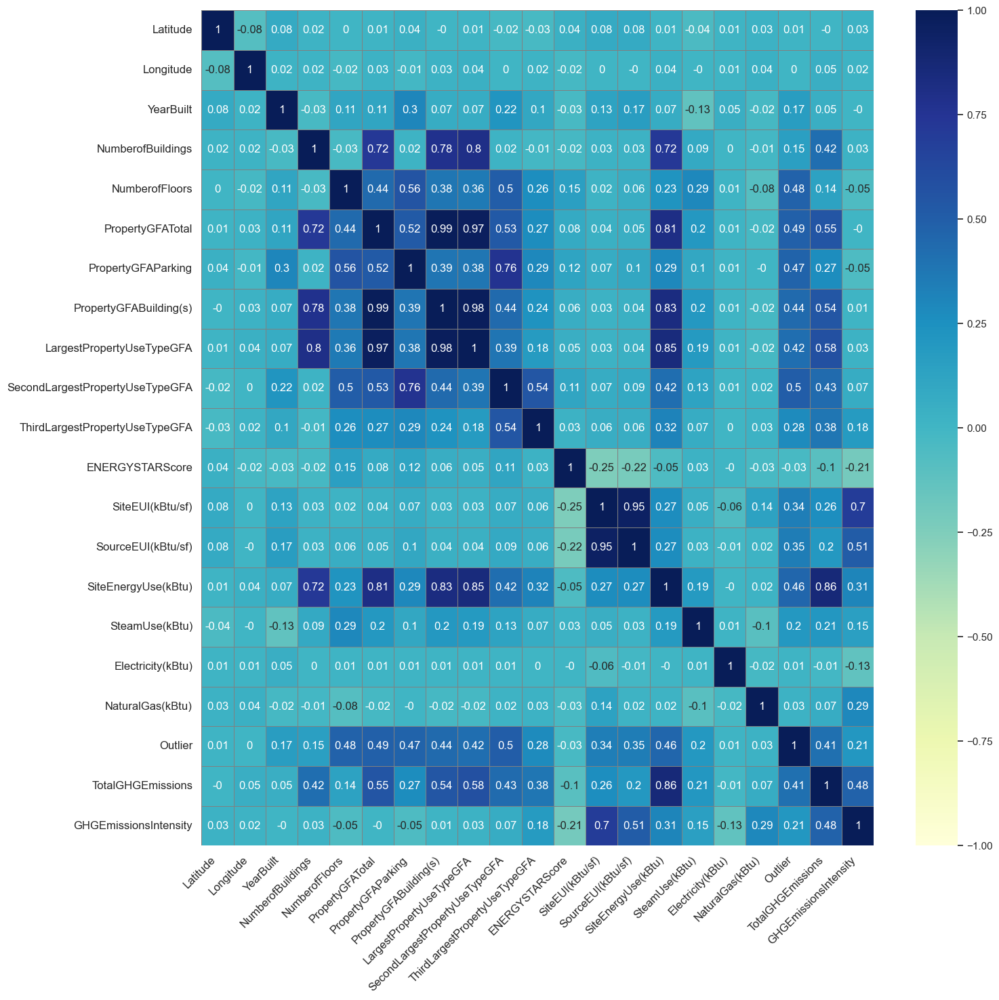

In [144]:
plt.figure(figsize=(16,16))

sns.heatmap(data=df3_corr, annot=True,cmap ="YlGnBu", linecolor='grey',linewidths=0.5,vmin=-1, vmax=1)
plt.yticks(rotation=0,fontsize = 12) 
plt.xticks(rotation=45,fontsize = 12,va="top", ha='right') 
plt.show()

On remarque :
* Notre variable target est corrélée avec : 
- Number of building
- PropertyGFATotal
- Property GFA building(s)
- LargestPropertyUseTypeGFA
- TotalGHGEmissions (l'autre target)  


* Il y a multicolinéarité entre les variables

In [145]:
df3_new = round(df3[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
                     'SteamUse(kBtu)', 'Electricity(kBtu)','Outlier',
       'NaturalGas(kBtu)','TotalGHGEmissions','Autres', 'Education',
       'EntertainmentPublicAssembly', 'FoodSalesService', 'Healthcare',
       'LodgingResidential', 'Office', 'Other', 'Parking', 'ReligiousWorship',
       'Retail', 'TechnologyScience', 'WarehouseStorage','SiteEnergyUse(kBtu)']].corr(),2)

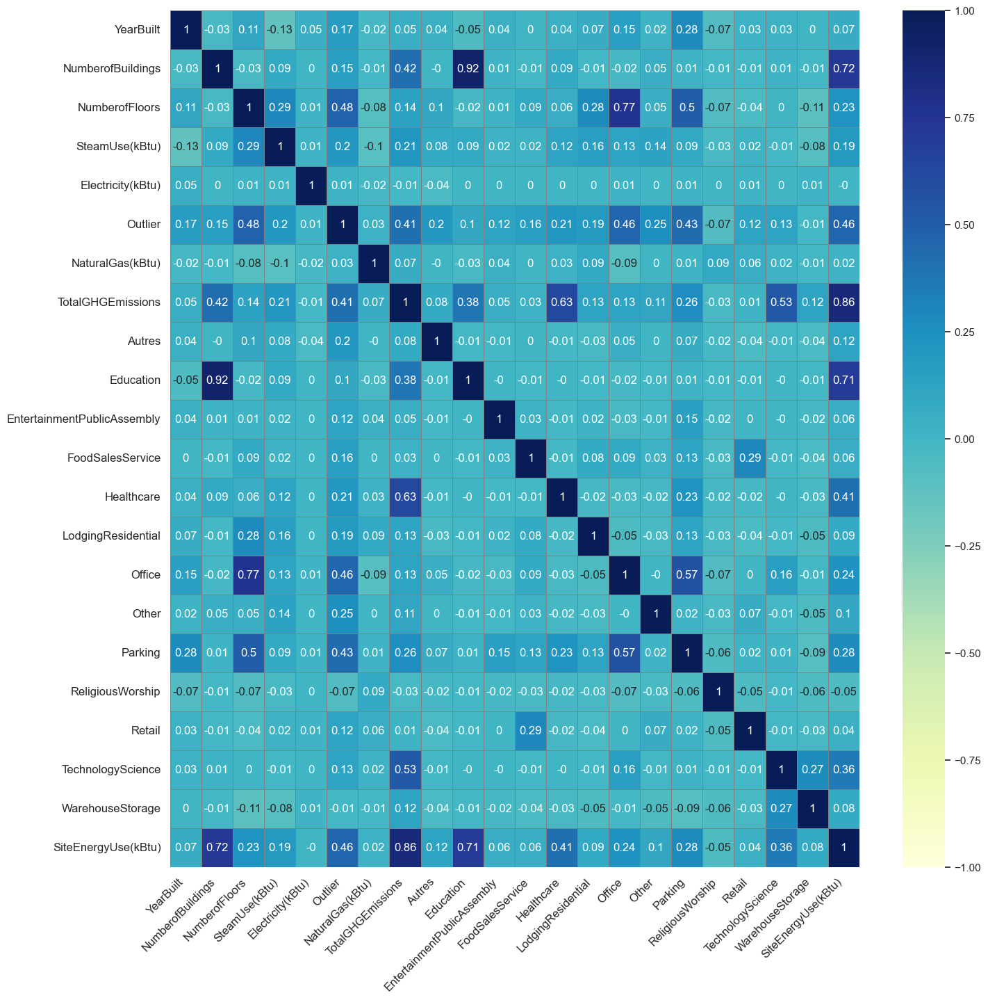

In [146]:
plt.figure(figsize=(16,16))

sns.heatmap(data=df3_new, annot=True,cmap ="YlGnBu", linecolor='grey',linewidths=0.5,vmin=-1, vmax=1)
plt.yticks(rotation=0,fontsize = 12) 
plt.xticks(rotation=45,fontsize = 12,va="top", ha='right') 
plt.show()

In [147]:
df4 = df3.copy()

# Test de corrélation des variables qualitatives

In [148]:
# Je réalise un test anova sur mes variables qualitatives pour vérifier la corrélation avec SiteEnergyUSe

# Je commence par renommer SiteEnergyUSe
df4 = df4.rename(columns={'SiteEnergyUse(kBtu)':'SiteEnergyUse'})

In [149]:
df4.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1533 entries, 252 to 2070
Data columns (total 45 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   BuildingType                     1533 non-null   object  
 1   PrimaryPropertyType              1533 non-null   object  
 2   Neighborhood                     1533 non-null   object  
 3   Latitude                         1533 non-null   float64 
 4   Longitude                        1533 non-null   float64 
 5   YearBuilt                        1533 non-null   int64   
 6   NumberofBuildings                1533 non-null   Int64   
 7   NumberofFloors                   1533 non-null   int64   
 8   PropertyGFATotal                 1533 non-null   int64   
 9   PropertyGFAParking               1533 non-null   int64   
 10  PropertyGFABuilding(s)           1533 non-null   int64   
 11  ListOfAllPropertyUseTypes        1533 non-null   object  
 

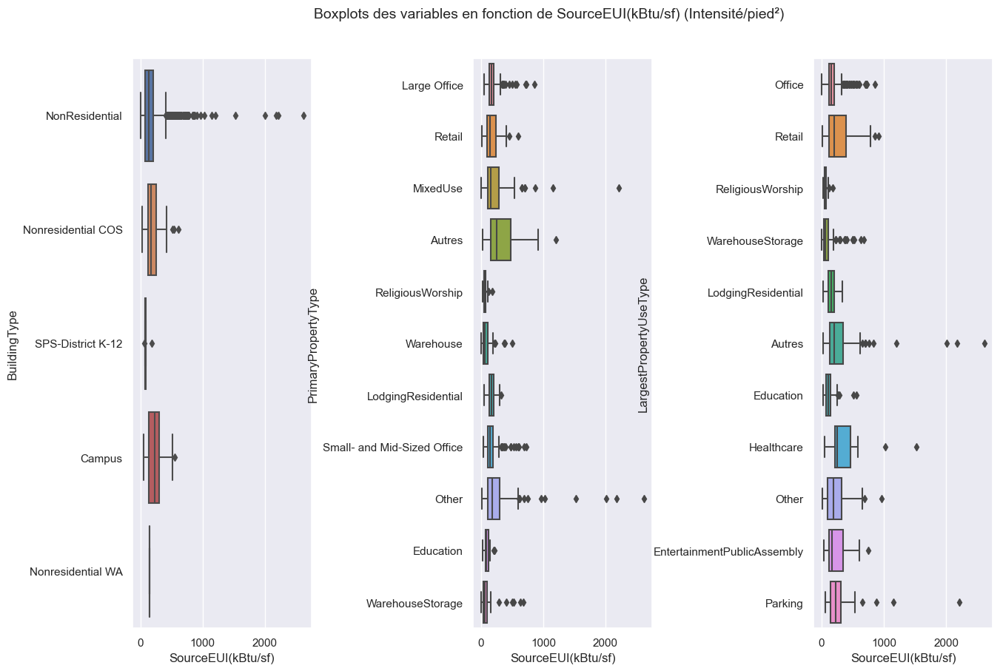

In [150]:
fig, axes = plt.subplots(1,3,figsize=(15,10) )
fig.subplots_adjust(wspace=0.9)


fig.suptitle("Boxplots des variables en fonction de SourceEUI(kBtu/sf) (Intensité/pied²)", fontsize=14, y=0.95)

sns.boxplot(ax=axes[0], data=df4, x='SourceEUI(kBtu/sf)', y='BuildingType')

sns.boxplot(ax=axes[1], data=df4, x='SourceEUI(kBtu/sf)', y='PrimaryPropertyType')

sns.boxplot(ax=axes[2], data=df4, x='SourceEUI(kBtu/sf)', y='LargestPropertyUseType')





plt.show()
    

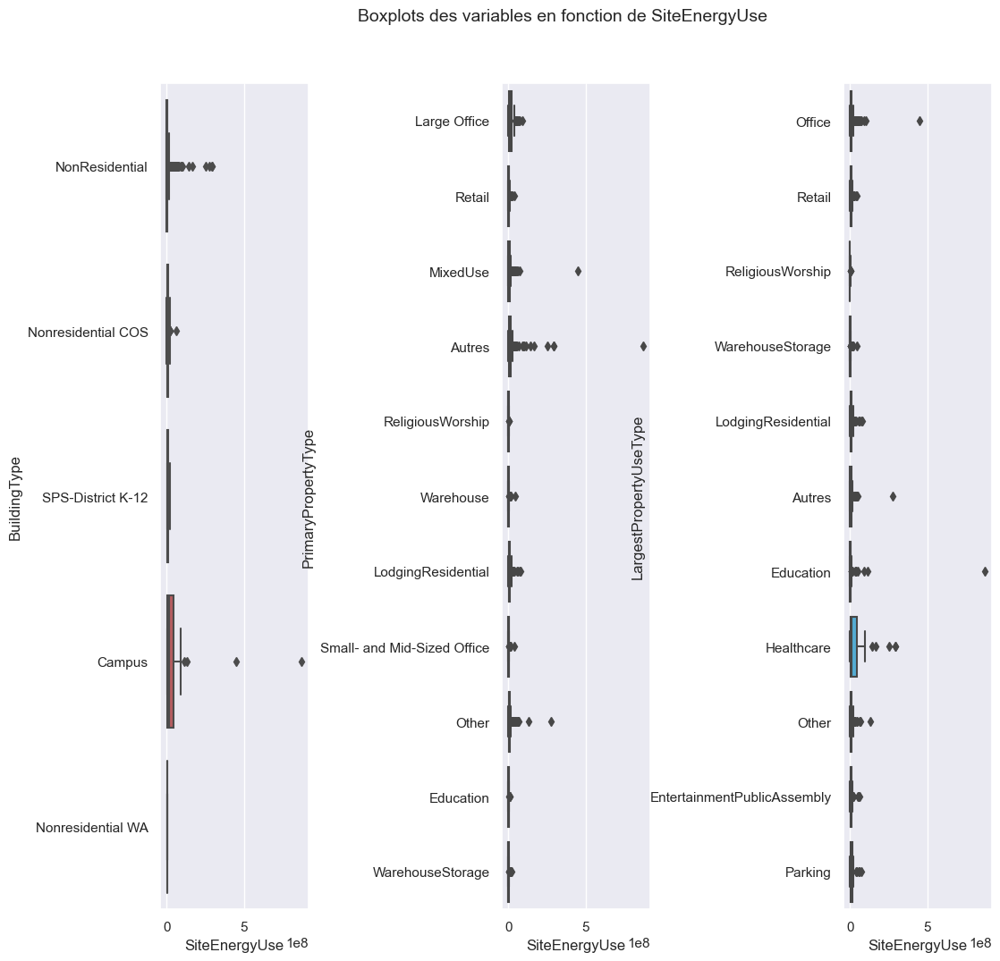

In [151]:
fig, axes = plt.subplots(1,3,figsize=(12,12) )
fig.subplots_adjust(wspace=1.3)


fig.suptitle("Boxplots des variables en fonction de SiteEnergyUse", fontsize=14, y=0.95)

sns.boxplot(ax=axes[0], data=df4, x='SiteEnergyUse', y='BuildingType')

sns.boxplot(ax=axes[1], data=df4, x='SiteEnergyUse', y='PrimaryPropertyType')

sns.boxplot(ax=axes[2], data=df4, x='SiteEnergyUse', y='LargestPropertyUseType')




plt.show()
    

In [152]:
df4.describe()

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Autres,Education,EntertainmentPublicAssembly,FoodSalesService,Healthcare,LodgingResidential,Office,Other,Parking,ReligiousWorship,Retail,Sans,TechnologyScience,WarehouseStorage
count,1533.000000,1533.000000,1533.000000,1533.000000,1533.000000,1.533000e+03,1533.000000,1.533000e+03,1.533000e+03,1533.000000,1533.000000,1533.000000,1533.000000,1533.000000,1.533000e+03,1533.000000,1533.000000,1533.000000,1533.000000,1533.000000,1533.000000,1533.000000,1.533000e+03,1.533000e+03,1533.000000,1.533000e+03,1533.000000,1.533000e+03,1533.000000,1533.000000,1533.000000,1533.000000,1533.0,1533.000000,1533.000000
mean,47.616387,-122.333489,1961.481409,1.214612,4.240705,1.265340e+05,18199.636008,1.083344e+05,1.006693e+05,20458.021720,3828.824135,63.279227,74.574886,183.037900,8.921214e+06,0.073712,0.999348,0.712329,0.114155,194.870215,1.643020,4048.950424,1.177532e+04,4.525211e+03,497.317612,6.324453e+03,9293.153947,4.463130e+04,5962.809524,16057.578472,1459.211350,8216.019243,0.0,854.186562,11310.621657
std,0.046815,0.023132,32.832580,3.046248,6.362534,3.178738e+05,52513.154108,2.939280e+05,2.864115e+05,53382.563627,19995.843088,23.281466,74.283487,187.766324,3.145076e+07,0.261386,0.025540,0.452825,0.318104,782.759080,2.341432,24216.558295,2.442395e+05,5.436877e+04,3496.128961,7.158990e+04,51858.991952,1.256260e+05,32046.307101,51410.182052,7507.792125,35192.890277,0.0,17076.017017,39732.130783
min,47.509590,-122.411820,1900.000000,1.000000,0.000000,1.630000e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,1.400000,0.000000,5.713320e+04,0.000000,0.000000,0.000000,0.000000,0.400000,0.010000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,47.587810,-122.342870,1930.000000,1.000000,1.000000,2.939400e+04,0.000000,2.830400e+04,2.550000e+04,0.000000,0.000000,57.000000,34.799999,81.099998,1.262235e+06,0.000000,1.000000,0.000000,0.000000,20.760000,0.360000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
50%,47.612560,-122.333180,1965.000000,1.000000,2.000000,4.924300e+04,0.000000,4.656000e+04,4.280000e+04,320.000000,0.000000,63.480533,53.599998,138.699997,2.746561e+06,0.000000,1.000000,1.000000,0.000000,50.070000,0.880000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
75%,47.649040,-122.322850,1988.000000,1.000000,4.000000,1.097940e+05,4968.000000,9.663000e+04,9.302000e+04,14074.000000,0.000000,79.000000,85.099998,214.000000,7.408342e+06,0.000000,1.000000,1.000000,0.000000,147.490000,1.950000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,3.203900e+04,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
max,47.733870,-122.261800,2015.000000,111.000000,76.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,639931.000000,459748.000000,100.000000,834.400024,2620.000000,8.739237e+08,1.000000,1.000000,1.000000,1.000000,16870.980000,34.090000,537150.000000,9.320156e+06,1.585960e+06,80000.000000,1.639334e+06,994212.000000,1.680937e+06,535947.000000,441551.000000,103000.000000,561684.000000,0.0,639931.000000,892000.000000


In [153]:
df4.loc[df4['Parking']>441500,:]

,BuildingType,PrimaryPropertyType,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,geometry,year_discr,Autres,Education,EntertainmentPublicAssembly,FoodSalesService,Healthcare,LodgingResidential,Office,Other,Parking,ReligiousWorship,Retail,Sans,TechnologyScience,WarehouseStorage
618,NonResidential,Autres,EAST,47.608951,-122.322402,1994,7,14,2207521,441551,1765970,"Hospital (General Medical & Surgical), Parking",Healthcare,1639334.0,Parking,441551.0,Sans,0.0,NaN,54.0,177.899994,377.0,291614432.0,1.0,1.0,1.0,1,12307.16,6.97,POINT (-122.32240 47.60895),"(1975.0, 2000.0]",0,0,0,0.0,1639334,0,0.0,0,441551.0,0,0.0,0,0,0


In [154]:
# Test ANOVA
lm = ols('SiteEnergyUse~BuildingType+PrimaryPropertyType+LargestPropertyUseType+SecondLargestPropertyUseType+ThirdLargestPropertyUseType', data = df4).fit()
table = sm.stats.anova_lm(lm)
table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,1.277372e+17,3.193429e+16,38.600717,8.904410e-31
PrimaryPropertyType,10.0,7.295917e+16,7.295917e+15,8.818973,3.458842e-14
LargestPropertyUseType,10.0,5.049504e+16,5.049504e+15,6.103610,3.658660e-09
SecondLargestPropertyUseType,10.0,2.379347e+16,2.379347e+15,2.876047,1.466149e-03
ThirdLargestPropertyUseType,10.0,8.547295e+15,8.547295e+14,1.033158,4.125823e-01
Residual,1489.0,1.231847e+18,8.272979e+14,NaN,NaN


On pose les hypothèses de départ :  

* H0 : Variables indépendantes si p-value > 5%
* H1 : Variables non indépendantes si p-value < 5%  

Avec une p-value inférieure à 0.05%, on peut rejeter l'hypothèse H0.

In [158]:
# Test ANOVA avec les colonnes par bâtiments créées.
lm_1 = ols('SiteEnergyUse~Autres+Education+EntertainmentPublicAssembly+FoodSalesService+Healthcare+LodgingResidential+Office+Other+Retail+TechnologyScience+WarehouseStorage', data = df4).fit()
table_1 = sm.stats.anova_lm(lm_1)
print(lm_1.summary())

                            OLS Regression Results                            
Dep. Variable:          SiteEnergyUse   R-squared:                       0.906
Model:                            OLS   Adj. R-squared:                  0.905
Method:                 Least Squares   F-statistic:                     1332.
Date:                Tue, 31 Jan 2023   Prob (F-statistic):               0.00
Time:                        13:55:48   Log-Likelihood:                -26828.
No. Observations:                1533   AIC:                         5.368e+04
Df Residuals:                    1521   BIC:                         5.374e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

In [183]:
table_1

,df,sum_sq,mean_sq,F,PR(>F)
Autres,1.0,2.097510e+16,2.097510e+16,223.887775,2.510962e-47
Education,1.0,7.605476e+17,7.605476e+17,8118.067635,0.000000e+00
EntertainmentPublicAssembly,1.0,6.834160e+15,6.834160e+15,72.947661,3.180735e-17
FoodSalesService,1.0,5.422623e+15,5.422623e+15,57.880947,4.853740e-14
Healthcare,1.0,2.651793e+17,2.651793e+17,2830.517214,0.000000e+00
LodgingResidential,1.0,1.628535e+16,1.628535e+16,173.829478,1.152876e-37
Office,1.0,1.012047e+17,1.012047e+17,1080.257068,1.834930e-179
Other,1.0,2.122439e+16,2.122439e+16,226.548618,7.840684e-48
Retail,1.0,3.394856e+15,3.394856e+15,36.236618,2.186533e-09
TechnologyScience,1.0,1.699926e+17,1.699926e+17,1814.497123,1.225804e-261


Il y a corrélation entre SiteEnergyUse et les catégories de bâtiments.

# Corrélation avec les variables quantitatives

In [160]:
from scipy.stats import spearmanr

In [161]:
df4 = df4.drop('geometry',axis=1)

In [162]:
col_num = df4.select_dtypes('number').dropna()


In [163]:
col_num

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Autres,Education,EntertainmentPublicAssembly,FoodSalesService,Healthcare,LodgingResidential,Office,Other,Parking,ReligiousWorship,Retail,Sans,TechnologyScience,WarehouseStorage
252,47.61734,-122.34434,1947,1,3,192630,48512,144118,146157.0,48199.0,0.0,94.000000,36.700001,112.400002,5.357833e+06,0.0,1.0,1.0,0,46.03,0.24,0,0,0,0.0,0,0,146157.0,0,48199.0,0,0.0,0,0,0
554,47.61732,-122.34791,1975,1,8,150000,23630,126370,126648.0,23913.0,0.0,65.000000,73.800003,212.100006,9.343428e+06,0.0,1.0,1.0,0,119.93,0.80,0,0,0,0.0,0,0,126648.0,0,23913.0,0,0.0,0,0,0
428,47.70759,-122.32550,1965,1,2,168619,0,168619,173106.0,0.0,0.0,78.000000,37.299999,105.000000,6.455828e+06,0.0,1.0,1.0,0,91.10,0.54,0,0,0,0.0,0,0,0.0,0,0.0,0,173106.0,0,0,0
293,47.60967,-122.33229,1980,1,36,831198,36606,794592,748011.0,36606.0,9975.0,96.000000,35.200001,108.699997,2.668966e+07,0.0,1.0,1.0,1,216.43,0.27,0,0,0,0.0,0,0,748011.0,9975,36606.0,0,0.0,0,0,0
551,47.62225,-122.35915,2000,1,7,241875,84689,157186,163082.0,83425.0,0.0,88.000000,53.099998,164.500000,8.655604e+06,0.0,1.0,1.0,0,68.06,0.28,0,0,0,0.0,0,0,163082.0,0,83425.0,0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1620,47.65843,-122.38435,1957,1,2,20294,0,20294,18000.0,2294.0,0.0,63.480533,85.500000,145.100006,1.735996e+06,0.0,1.0,1.0,0,67.45,3.32,0,0,0,0.0,0,0,2294.0,18000,0.0,0,0.0,0,0,0
1621,47.65708,-122.38383,1983,1,4,40571,10849,29722,24008.0,0.0,0.0,64.000000,53.599998,168.300003,1.286817e+06,0.0,1.0,0.0,0,8.97,0.22,0,0,0,0.0,0,0,24008.0,0,0.0,0,0.0,0,0,0
1622,47.65649,-122.38383,1983,1,4,41707,15659,26048,41707.0,12000.0,0.0,78.000000,42.099998,132.199997,1.755788e+06,0.0,1.0,0.0,0,12.24,0.29,0,0,0,0.0,0,0,41707.0,0,12000.0,0,0.0,0,0,0
1567,47.66238,-122.38831,1974,1,1,25600,0,25600,20600.0,5000.0,0.0,1.000000,67.599998,173.000000,1.730601e+06,0.0,1.0,1.0,0,34.26,1.34,0,0,0,0.0,0,0,5000.0,0,0.0,0,0.0,0,0,20600


In [187]:
for col in col_num:
    corr,p = spearmanr(col_num['SiteEnergyUse'],col_num[col])
    
    if p> 0.05:
        print("Variable dont l'hypothèse H0 n'est pas rejetée")
        print(col)
        print(corr,p)
        
    else :
        pass

Variable dont l'hypothèse H0 n'est pas rejetée
Longitude
-0.04494903274393181 0.07851509142158708
Variable dont l'hypothèse H0 n'est pas rejetée
Electricity(kBtu)
-0.029328029887978623 0.2511310499150213
Variable dont l'hypothèse H0 n'est pas rejetée
Education
-0.003025415201474073 0.9057829148228618


Longitude, Electricity(kBtu) et Education ne rejettent pas l'hypothèse H0.

# Consommation de CO²

# Corrélation avec les variables qualitatives

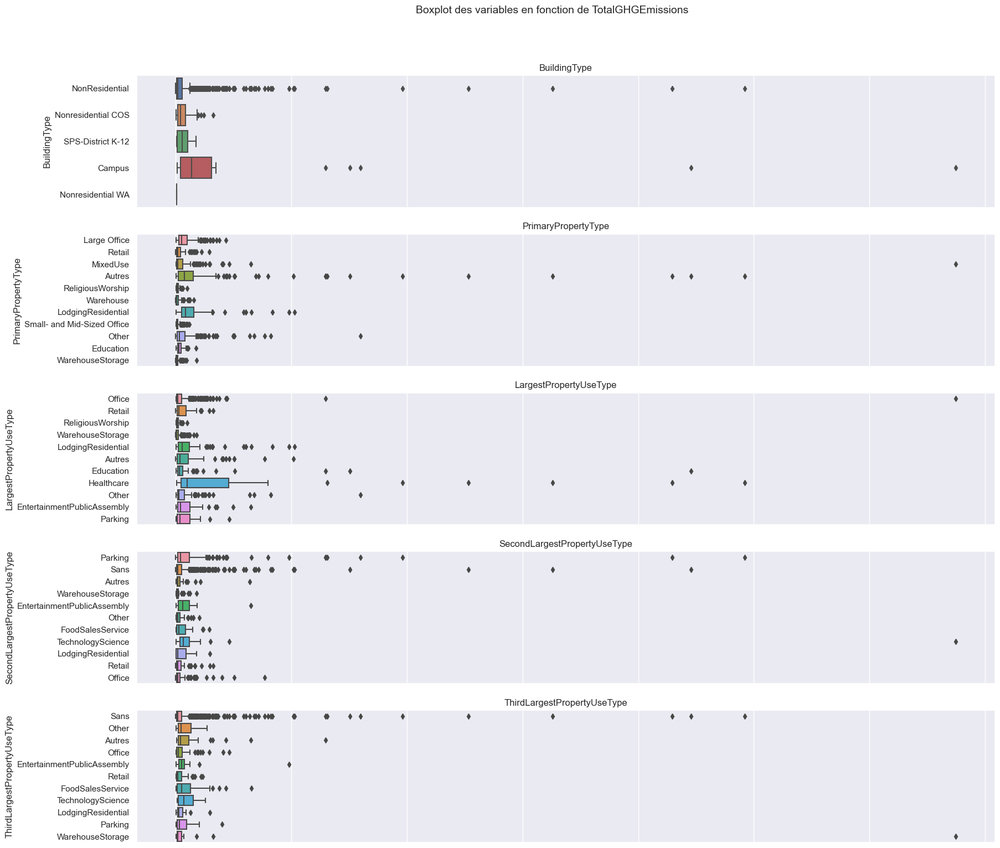

In [166]:
fig, axes = plt.subplots(5, 1,figsize=(20,18) ) 
#fig.subplots_adjust(hspace=0.2)


fig.suptitle("Boxplot des variables en fonction de TotalGHGEmissions", fontsize=14, y=0.95)

sns.boxplot(ax=axes[0], data=df4, x='TotalGHGEmissions', y='BuildingType')
axes[0].set(xticklabels=[]) 
axes[0].set(xlabel=None)
axes[0].set(title='BuildingType')

sns.boxplot(ax=axes[ 1], data=df4, x='TotalGHGEmissions', y='PrimaryPropertyType')
axes[1].set(xticklabels=[]) 
axes[1].set(xlabel=None)
axes[1].set(title='PrimaryPropertyType')

sns.boxplot(ax=axes[2], data=df4, x='TotalGHGEmissions', y='LargestPropertyUseType')
axes[2].set(xticklabels=[]) 
axes[2].set(xlabel=None)
axes[2].set(title='LargestPropertyUseType')

sns.boxplot(ax=axes[3], data=df4, x='TotalGHGEmissions', y='SecondLargestPropertyUseType')
axes[3].set(xticklabels=[]) 
axes[3].set(xlabel=None)
axes[3].set(title='SecondLargestPropertyUseType')

sns.boxplot(ax=axes[4], data=df4, x='TotalGHGEmissions', y='ThirdLargestPropertyUseType')

axes[4].set(xticklabels=[]) 
axes[4].set(xlabel=None)
axes[4].set(title='ThirdLargestPropertyUseType')


plt.show()
    

On remarque la présence de nombreux outliers.

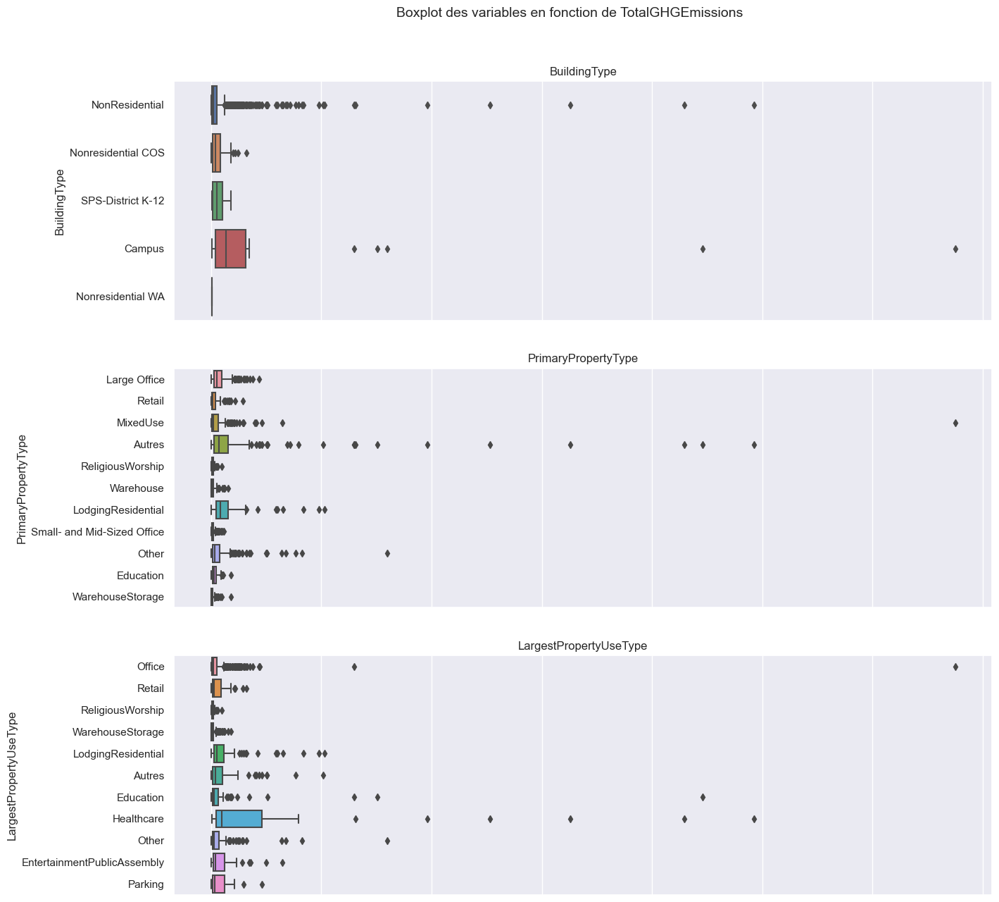

In [167]:
fig, axes = plt.subplots(3, 1,figsize=(15,15) )
#fig.subplots_adjust(hspace=0.2)


fig.suptitle("Boxplot des variables en fonction de TotalGHGEmissions", fontsize=14, y=0.95)

sns.boxplot(ax=axes[0], data=df4, x='TotalGHGEmissions', y='BuildingType')
axes[0].set(xticklabels=[]) 
axes[0].set(xlabel=None)
axes[0].set(title='BuildingType')

sns.boxplot(ax=axes[ 1], data=df4, x='TotalGHGEmissions', y='PrimaryPropertyType')
axes[1].set(xticklabels=[]) 
axes[1].set(xlabel=None)
axes[1].set(title='PrimaryPropertyType')

sns.boxplot(ax=axes[2], data=df4, x='TotalGHGEmissions', y='LargestPropertyUseType')
axes[2].set(xticklabels=[]) 
axes[2].set(xlabel=None)
axes[2].set(title='LargestPropertyUseType')


plt.show()

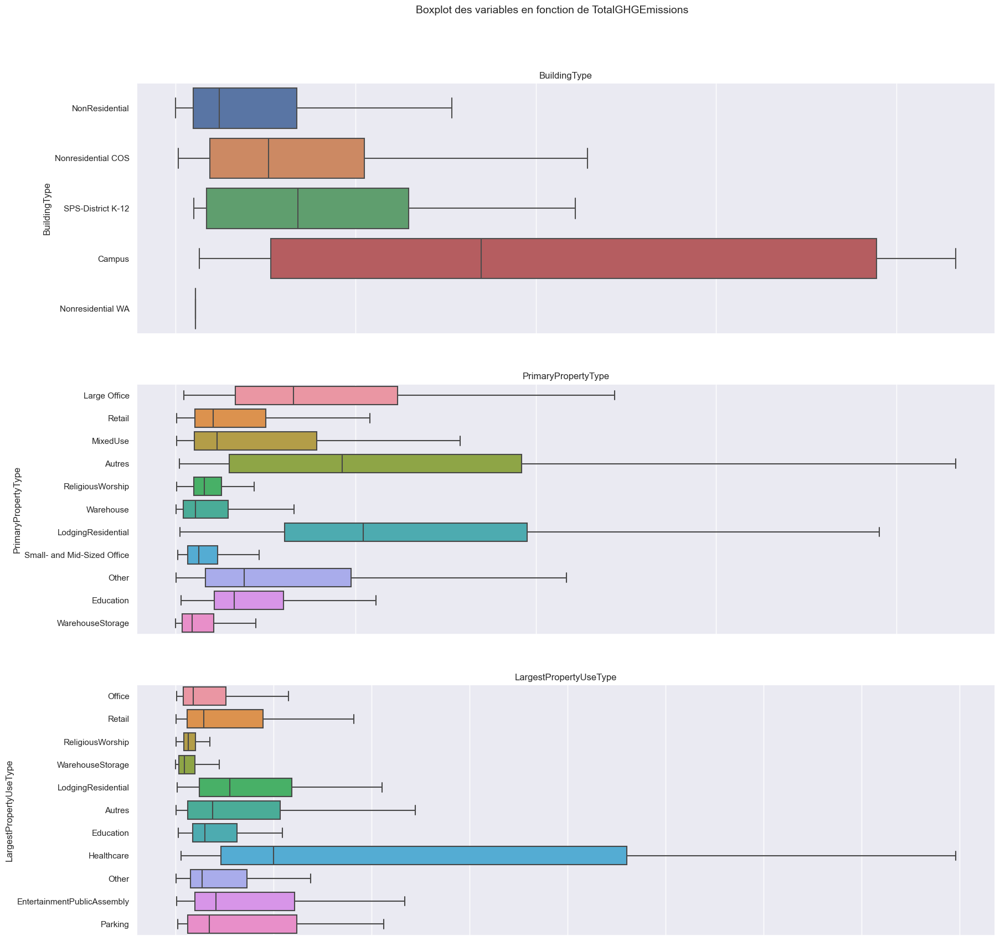

In [168]:
fig, axes = plt.subplots(3, 1,figsize=(20,20) )
#fig.subplots_adjust(hspace=0.2)


fig.suptitle("Boxplot des variables en fonction de TotalGHGEmissions sans Outliers", fontsize=14, y=0.95)

sns.boxplot(ax=axes[0], data=df4, x='TotalGHGEmissions', y='BuildingType',showfliers=False)
axes[0].set(xticklabels=[]) 
axes[0].set(xlabel=None)
axes[0].set(title='BuildingType')

sns.boxplot(ax=axes[ 1], data=df4, x='TotalGHGEmissions', y='PrimaryPropertyType',showfliers=False)
axes[1].set(xticklabels=[]) 
axes[1].set(xlabel=None)
axes[1].set(title='PrimaryPropertyType')

sns.boxplot(ax=axes[2], data=df4, x='TotalGHGEmissions', y='LargestPropertyUseType',showfliers=False)
axes[2].set(xticklabels=[]) 
axes[2].set(xlabel=None)
axes[2].set(title='LargestPropertyUseType')


plt.show()

In [169]:
# Test ANOVA
lm = ols('TotalGHGEmissions~BuildingType+PrimaryPropertyType+ListOfAllPropertyUseTypes+LargestPropertyUseType+SecondLargestPropertyUseType+ThirdLargestPropertyUseType', data = df4).fit()
table = sm.stats.anova_lm(lm)
table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,6.756806e+07,1.689201e+07,63.937480,9.113757e-49
PrimaryPropertyType,10.0,4.575949e+07,4.575949e+06,17.320293,1.437431e-29
ListOfAllPropertyUseTypes,363.0,5.243533e+08,1.444499e+06,5.467534,5.107791e-107
LargestPropertyUseType,10.0,9.285366e+05,9.285366e+04,0.351458,9.663623e-01
SecondLargestPropertyUseType,10.0,9.802976e+05,9.802976e+04,0.371050,9.591919e-01
ThirdLargestPropertyUseType,10.0,9.121280e+05,9.121280e+04,0.345247,9.684591e-01
Residual,1130.0,2.985413e+08,2.641958e+05,NaN,NaN


On pose les hypothèses de départ :  

* H0 : Variables indépendantes si p-value > 5%
* H1 : Variables non indépendantes si p-value < 5%  

Avec une p-value inférieure à 0.05%, on peut rejeter l'hypothèse H0.

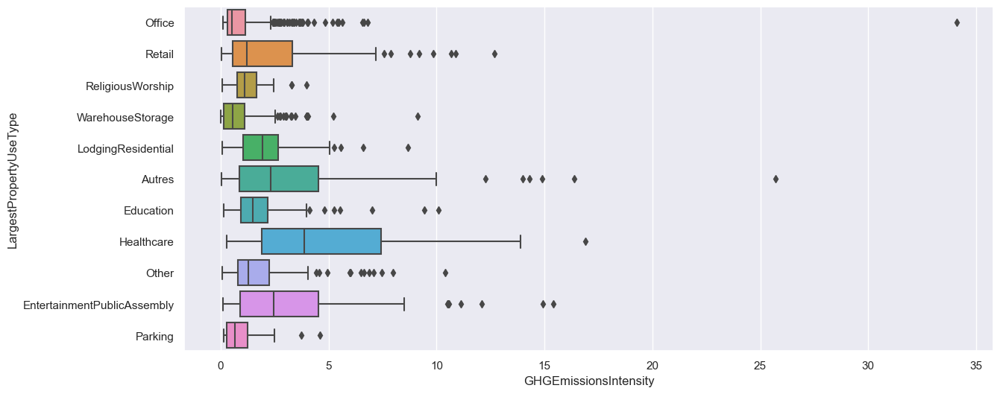

In [170]:
sns.boxplot(x='GHGEmissionsIntensity',y='LargestPropertyUseType',data=df4)
plt.show()

# Corrélation avec les variables quantitatives

In [171]:
from scipy.stats import spearmanr

In [172]:
col_num = df4.select_dtypes('number').dropna()


In [188]:
for col in col_num:
    corr,p = spearmanr(col_num['TotalGHGEmissions'],col_num[col])
        
    if p> 0.05:
        print("Variable dont l'hypothèse H0 n'est pas rejetée")
        print(col)
        print(corr,p)
        
    else :
        pass

Variable dont l'hypothèse H0 n'est pas rejetée
Longitude
-0.026176814721941253 0.3057150608793355
Variable dont l'hypothèse H0 n'est pas rejetée
Electricity(kBtu)
-0.03983531814353789 0.11898680747551138
Variable dont l'hypothèse H0 n'est pas rejetée
Office
0.04430341636277242 0.08290526381745736
Variable dont l'hypothèse H0 n'est pas rejetée
Retail
0.04272896192286955 0.0944475564658487


Longitude, Electricityn Office et Retail ne rejettent pas l'hypothèse 0.

In [174]:
df4_new = df4[['Autres', 'Education',
       'EntertainmentPublicAssembly', 'FoodSalesService', 'Healthcare',
       'LodgingResidential', 'Office', 'Other', 'Parking', 'ReligiousWorship',
       'Retail', 'TechnologyScience', 'WarehouseStorage','TotalGHGEmissions']].corr()

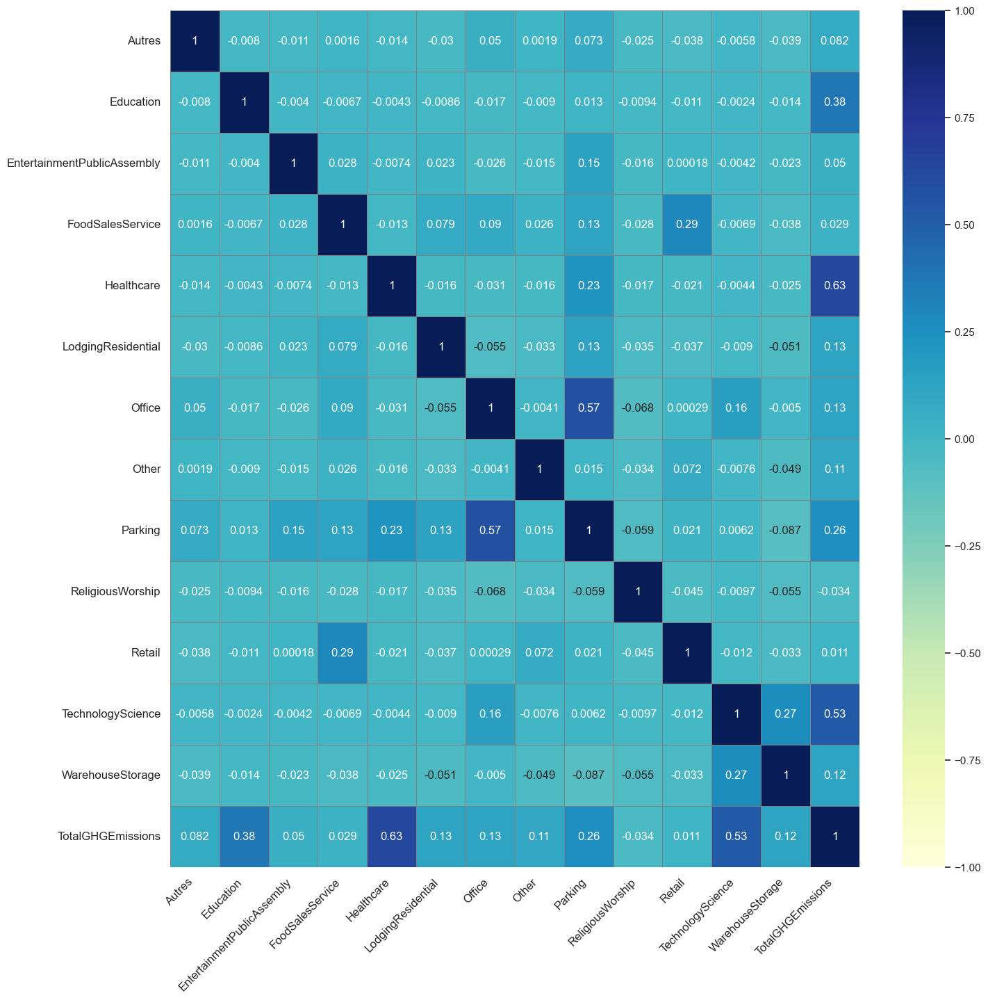

In [175]:
plt.figure(figsize=(16,16))

sns.heatmap(data=df4_new, annot=True,cmap ="YlGnBu", linecolor='grey',linewidths=0.5,vmin=-1, vmax=1)
plt.yticks(rotation=0,fontsize = 12) 
plt.xticks(rotation=45,fontsize = 12,va="top", ha='right') 
plt.show()

* Pas de multicolinéarité.  
* TotalGHGEmissions semble corrélé à Healthcare et TechnologyScience.

In [176]:
df_fin = df4[['BuildingType', 'PrimaryPropertyType', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'YearsENERGYSTARCertified','ENERGYSTARScore', 
       'SiteEnergyUse', 'SteamUse(kBtu)', 'Electricity(kBtu)',
       'NaturalGas(kBtu)', 'Outlier', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'Autres', 'Education',
       'EntertainmentPublicAssembly', 'FoodSalesService', 'Healthcare',
       'LodgingResidential', 'Office', 'Other', 'Parking', 'ReligiousWorship',
       'Retail', 'Sans', 'TechnologyScience', 'WarehouseStorage']]

In [177]:
df_fin.to_csv('projet_4_clean.csv');
